# Predictive Maintenance

# Import Data

check lists
1. row granularity
2. columns non-null
3. colums numeric
4. feature engineering
5. feature selection
6. feature scaling

## Import dataset and merge 2 tables

In [12]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('darkgrid')
sns.set_palette("bright6")
sns.color_palette('bright6')

[(0.00784313725490196, 0.24313725490196078, 1.0),
 (0.10196078431372549, 0.788235294117647, 0.2196078431372549),
 (0.9098039215686274, 0.0, 0.043137254901960784),
 (0.5450980392156862, 0.16862745098039217, 0.8862745098039215),
 (1.0, 0.7686274509803922, 0.0),
 (0.0, 0.8431372549019608, 1.0)]

In [13]:
!pwd

/d/ai/predictive-maintenance-residential-aircon-coop/notebooks


In [14]:
# Import Dataset
df_indoor = pd.read_csv("data/Indoor_data.csv")
df_outdoor = pd.read_csv("data/Outdoor_data.csv")

In [15]:
# Clear the title column
df_indoor = df_indoor.drop('title', axis=1)
df_outdoor = df_outdoor.drop('title', axis=1)

# Inner join : combine records from two tables whenever there are matching values in a field common to both tables.
join_on = "time"
df_combined = df_indoor.merge(df_outdoor, on=join_on, how="inner")
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194607 entries, 0 to 194606
Data columns (total 25 columns):
 #   Column                                            Non-Null Count   Dtype  
---  ------                                            --------------   -----  
 0   time                                              194607 non-null  object 
 1   Airflow indoor-Indoor                             194049 non-null  float64
 2   Motor FCU-Indoor                                  194070 non-null  float64
 3   Eqv.Current (Evaporator)-Indoor                   194029 non-null  float64
 4   Indoor Supply Air Temp (Evaporator)-Indoor        194069 non-null  float64
 5   Indoor Ambient Temperature-Indoor                 194044 non-null  float64
 6   Eqv Phase to Phase Voltage (Evaporator)-Indoor    194018 non-null  float64
 7   Indoor Return Temp (Evaporator)-Indoor            194065 non-null  float64
 8   Indoor Ambient Humidity-Indoor                    194031 non-null  float64
 9   Eqv.

## Mapping new name

In [16]:
# Dictionary mapping old column names to new column names
column_mapping = {
    #------------------------------- Ambient ------------------------------------
    "Indoor Ambient Temperature-Indoor": "ambient_temp_indoor",
    "Indoor Ambient Humidity-Indoor": "ambient_humid_indoor",
    "Outdoor Ambient Temperature-Outdoor": "ambient_temp_outdoor",
    "Outdoor Ambient Humidity-Outdoor": "ambient_humid_outdoor",
    
    #------------------------------- Evaporator ------------------------------------
    # Air flow and Motor FCU
    "Airflow indoor-Indoor": "evaporator_airflow",
    "Motor FCU-Indoor": "evaporator_motorfcu",
    
    # Supply air and Return air
    "Indoor Supply Air Temp (Evaporator)-Indoor": "evaporator_supplyair",
    "Indoor Return Temp (Evaporator)-Indoor": "evaporator_return_temp",
    
    # Electrical data
    "Eqv.Current (Evaporator)-Indoor": "evaporator_eqv_current_indoor",
    "Eqv Phase to Phase Voltage (Evaporator)-Indoor": "evaporator_eqv_volt_indoor",

    #------------------------------- Condenser 1 ------------------------------------
    # Suction
    "Outdoor_Suction_Com1 (Condensor1)-Outdoor": "compressor1_suction_temp",
    
    # Discharge
    "Outdoor_Discharge_Temp_Com1 (Condensor1)-Outdoor": "condensor1_discharge_temp",
    
    # Liquid
    "Outdoor_Liquid_com1 (Condensor1)-Outdoor": "condensor1_liquid",
    
    # High and Low
    "High compressor 1 (Condensor1)-Outdoor": "condensor1_discharge_pressure",
    "Low compressor 1 (Condensor1)-Outdoor": "compressor1_suction_pressure",
    
    # Electrical data
    "Eqv.Current (Condensor1)-Outdoor": "condensor1_eqv_current_outdoor",
    "Eqv Phase to Phase Voltage (Condensor1)-Outdoor": "condensor1_eqv_volt_outdoor",
    
    #------------------------------- Condenser 2 ------------------------------------
    # Suction
    "Outdoor_Suction_Com2 (Condensor2)-Outdoor": "compressor2_suction_temp",
    
    # Discharge
    "Outdoor_Discharge_Temp_Com2 (Condensor2)-Outdoor": "condensor2_discharge_temp",
    
    # Liquid
    "Outdoor_Liquid_Com2 (Condensor2)-Outdoor": "condensor2_liquid",
    
    # High and Low
    "High compressor 2 (Condensor2)-Outdoor": "condensor2_discharge_pressure",
    "Low compressor 2 (Condensor2)-Outdoor": "compressor2_suction_pressure",
    
    # Electrical data
    "Eqv.Current (Condensor2)-Outdoor": "condensor2_eqv_current_outdoor",
    "Eqv Phase to Phase Voltage (Condensor2)-Outdoor": "condensor2_eqv_volt_outdoor",
}

# Rename the columns in the DataFrame
df = df_combined.rename(columns=column_mapping)

# print(df.columns)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194607 entries, 0 to 194606
Data columns (total 25 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   time                            194607 non-null  object 
 1   evaporator_airflow              194049 non-null  float64
 2   evaporator_motorfcu             194070 non-null  float64
 3   evaporator_eqv_current_indoor   194029 non-null  float64
 4   evaporator_supplyair            194069 non-null  float64
 5   ambient_temp_indoor             194044 non-null  float64
 6   evaporator_eqv_volt_indoor      194018 non-null  float64
 7   evaporator_return_temp          194065 non-null  float64
 8   ambient_humid_indoor            194031 non-null  float64
 9   condensor1_eqv_current_outdoor  193360 non-null  float64
 10  condensor2_eqv_current_outdoor  193390 non-null  float64
 11  compressor1_suction_pressure    193355 non-null  float64
 12  condensor1_liqui

In [17]:
len(df_combined.columns)

25

In [18]:
sensor_raw = [col for col in df if col != "time"]
sensor_raw

['evaporator_airflow',
 'evaporator_motorfcu',
 'evaporator_eqv_current_indoor',
 'evaporator_supplyair',
 'ambient_temp_indoor',
 'evaporator_eqv_volt_indoor',
 'evaporator_return_temp',
 'ambient_humid_indoor',
 'condensor1_eqv_current_outdoor',
 'condensor2_eqv_current_outdoor',
 'compressor1_suction_pressure',
 'condensor1_liquid',
 'ambient_temp_outdoor',
 'condensor1_eqv_volt_outdoor',
 'condensor2_eqv_volt_outdoor',
 'condensor1_discharge_pressure',
 'compressor1_suction_temp',
 'ambient_humid_outdoor',
 'compressor2_suction_pressure',
 'condensor1_discharge_temp',
 'condensor2_discharge_pressure',
 'condensor2_liquid',
 'condensor2_discharge_temp',
 'compressor2_suction_temp']

# Cleaning Data

## Count Missing Data

In [19]:
# Count nan values in each column
df.isnull().sum().reset_index()

,index,0
0,time,0
1,evaporator_airflow,558
2,evaporator_motorfcu,537
3,evaporator_eqv_current_indoor,578
4,evaporator_supplyair,538
5,ambient_temp_indoor,563
6,evaporator_eqv_volt_indoor,589
7,evaporator_return_temp,542
8,ambient_humid_indoor,576
9,condensor1_eqv_current_outdoor,1247


## Fill with Forward and Backward Fill

In [20]:
# Nan handling
df.fillna(method="ffill", inplace=True)
# df.fillna(method="bfill", inplace=True)

# Count nan values in each column
df.isnull().sum().reset_index()

,index,0
0,time,0
1,evaporator_airflow,0
2,evaporator_motorfcu,0
3,evaporator_eqv_current_indoor,0
4,evaporator_supplyair,0
5,ambient_temp_indoor,0
6,evaporator_eqv_volt_indoor,0
7,evaporator_return_temp,0
8,ambient_humid_indoor,0
9,condensor1_eqv_current_outdoor,0


In [21]:
df.head()

,time,evaporator_airflow,evaporator_motorfcu,evaporator_eqv_current_indoor,evaporator_supplyair,ambient_temp_indoor,evaporator_eqv_volt_indoor,evaporator_return_temp,ambient_humid_indoor,condensor1_eqv_current_outdoor,...,condensor2_eqv_volt_outdoor,condensor1_discharge_pressure,compressor1_suction_temp,ambient_humid_outdoor,compressor2_suction_pressure,condensor1_discharge_temp,condensor2_discharge_pressure,condensor2_liquid,condensor2_discharge_temp,compressor2_suction_temp
0,2024-01-16 13:13:00+07:00,5.3,88.1,3.33,16.0,24.1,388.70,26.8,40.8,5.38,...,389.28,170.29,30.4,32.7,51.81,30.3,315.41,39.6,79.5,17.6
1,2024-01-16 13:13:30+07:00,5.5,88.0,3.33,16.0,24.1,388.70,26.9,40.9,5.35,...,388.80,170.54,30.6,33.1,52.08,29.9,317.61,39.7,79.5,17.6
2,2024-01-16 13:14:30+07:00,5.5,87.6,3.34,16.1,24.1,389.31,26.9,41.0,5.41,...,389.84,171.56,30.8,33.5,51.46,29.6,317.48,40.0,79.8,17.8
3,2024-01-16 13:15:30+07:00,5.3,88.0,3.34,16.3,24.1,388.90,27.0,41.1,5.35,...,388.12,171.81,31.0,33.8,51.89,29.3,318.91,39.9,80.1,18.1
4,2024-01-16 13:16:30+07:00,5.6,88.0,3.28,16.3,24.2,386.41,27.0,41.3,5.29,...,386.50,171.68,31.2,33.4,51.93,29.1,320.59,40.3,80.4,18.3


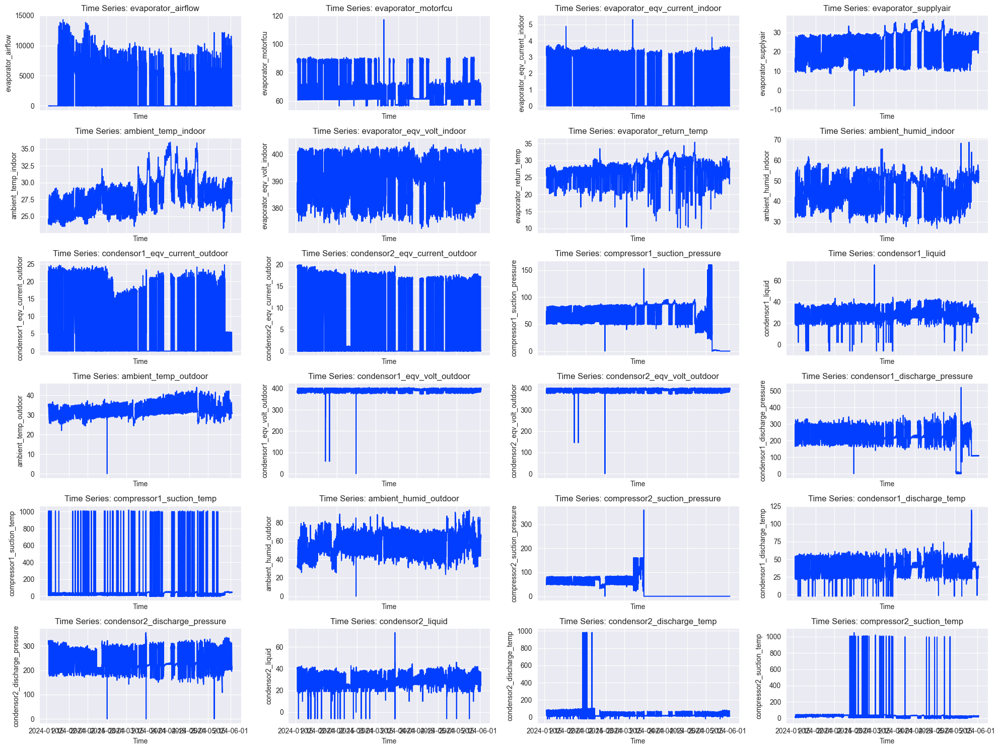

In [22]:
# Assuming 'time' is your datetime index or column
df['time'] = pd.to_datetime(df['time'])  # Ensure 'time' is in datetime format

# Set up the matplotlib figure with 4 columns and 6 rows
fig, axes = plt.subplots(6, 4, figsize=(20, 15), sharex=True)  # 6 rows, 4 columns

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each feature as a time series plot
for i, column in enumerate(sensor_raw):
    axes[i].plot(df['time'], df[column])
    axes[i].set_title(f'Time Series: {column}')
    axes[i].set_xlabel('Time')
    axes[i].set_ylabel(column)

# Hide any empty subplots if there are less than 24 features
for j in range(len(sensor_raw), 24):
    fig.delaxes(axes[j])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

## Visual Box Plot 

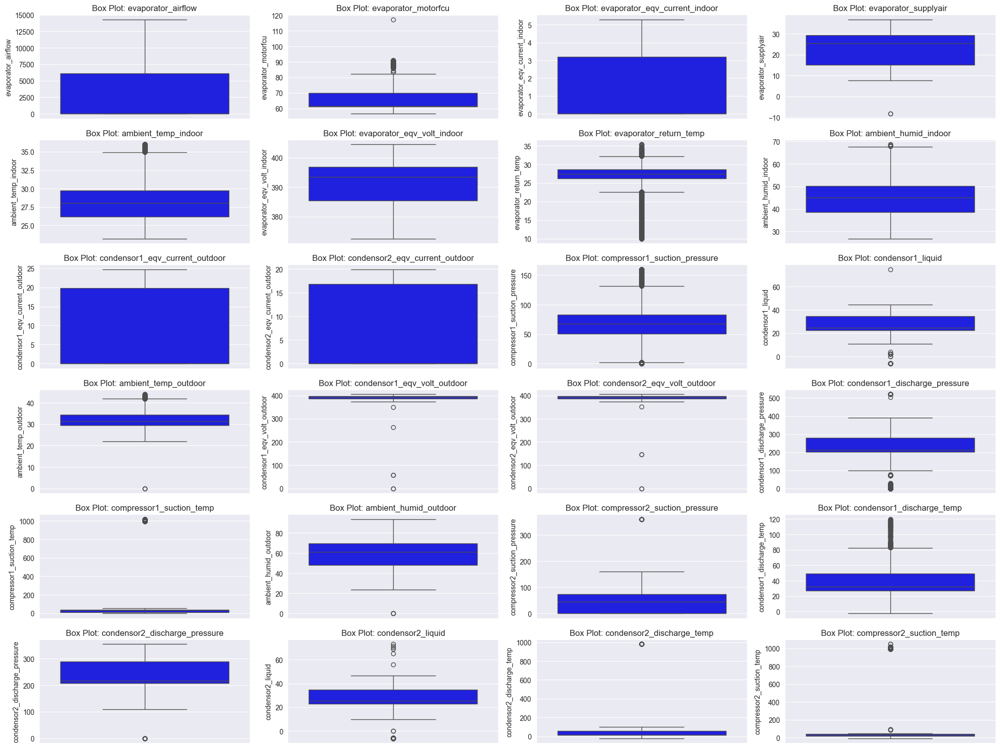

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the matplotlib figure with 4 columns and 6 rows
fig, axes = plt.subplots(6, 4, figsize=(20, 15))  # 6 rows, 4 columns

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each feature's boxplot
for i, column in enumerate(sensor_raw):
    sns.boxplot(data=df, y=column, ax=axes[i], color="blue")
    axes[i].set_title(f'Box Plot: {column}')
    axes[i].set_xlabel('')
    axes[i].set_ylabel(column)

# Hide any empty subplots if there are less than 24 features
for j in range(len(sensor_raw), 24):
    fig.delaxes(axes[j])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


# Understanding Sensor Data

In [24]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
evaporator_airflow,194607.0,2852.959535,3394.527565,0.00,0.00,0.00,6084.000,14297.40
evaporator_motorfcu,194607.0,68.264539,11.573007,56.60,61.10,61.50,70.000,117.30
evaporator_eqv_current_indoor,194607.0,1.496632,1.615639,0.00,0.00,0.00,3.200,5.30
evaporator_supplyair,194607.0,22.624604,7.708379,-8.20,15.10,25.40,29.200,36.80
ambient_temp_indoor,194607.0,28.273004,2.584560,23.20,26.20,28.00,29.700,36.00
evaporator_eqv_volt_indoor,194607.0,391.318516,6.566421,372.46,385.43,393.51,396.900,404.50
evaporator_return_temp,194607.0,27.205974,2.726927,10.00,26.20,27.40,28.600,35.40
ambient_humid_indoor,194607.0,44.296212,6.800910,26.80,38.60,45.00,50.200,68.70
condensor1_eqv_current_outdoor,194607.0,7.556929,9.389558,0.00,0.00,0.00,19.845,24.76
condensor2_eqv_current_outdoor,194607.0,6.241083,8.321687,0.00,0.00,0.00,16.810,19.96


List of feature we have threshold
- Current Compressor 14-18 A
- High Pressure 240-320 psi
- Low Pressure 50-75 Psi
- Discharge Temp <90 C
- Suction Temp <20 C
- Air Flow 6000-120000 CMH
- Noise <95 dB

In [25]:
df.time = pd.to_datetime(df.time)

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194607 entries, 0 to 194606
Data columns (total 25 columns):
 #   Column                          Non-Null Count   Dtype                    
---  ------                          --------------   -----                    
 0   time                            194607 non-null  datetime64[ns, UTC+07:00]
 1   evaporator_airflow              194607 non-null  float64                  
 2   evaporator_motorfcu             194607 non-null  float64                  
 3   evaporator_eqv_current_indoor   194607 non-null  float64                  
 4   evaporator_supplyair            194607 non-null  float64                  
 5   ambient_temp_indoor             194607 non-null  float64                  
 6   evaporator_eqv_volt_indoor      194607 non-null  float64                  
 7   evaporator_return_temp          194607 non-null  float64                  
 8   ambient_humid_indoor            194607 non-null  float64                  
 9   cond

## Condensor and Evaporator Current

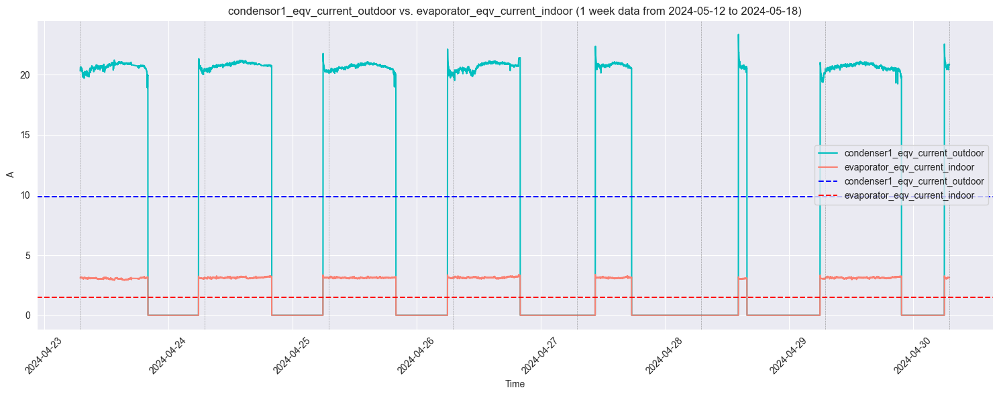

In [27]:
# Convert the start_date to match the timezone of "time" column
start_date = pd.to_datetime('2024-04-23', utc=True).tz_convert('UTC+07:00')
end_date = pd.to_datetime('2024-04-30', utc=True).tz_convert('UTC+07:00')  # Includes data up to midnight

df_filtered = df[(df['time'] >= start_date) & (df['time'] < end_date)]

# Create the figure
plt.figure(figsize=(15, 6))

""" Plot the time series data as lines """
plt.plot(df_filtered["time"], df_filtered["condensor1_eqv_current_outdoor"], color="c", label="condenser1_eqv_current_outdoor")
plt.plot(df_filtered["time"], df_filtered["evaporator_eqv_current_indoor"], color="salmon", label="evaporator_eqv_current_indoor")

# Calculate daily boundaries for vertical lines
daily_boundaries = pd.date_range(start_date, end_date, freq='D')

# Add vertical lines at the beginning of each day
for day in daily_boundaries:
    plt.axvline(x=day, color='gray', linestyle='--', alpha=0.7, linewidth=0.5) 
    
# Plot mean values for filtered data
plt.axhline(y=df_filtered["condensor1_eqv_current_outdoor"].mean(), color='b', linestyle='--', label="condenser1_eqv_current_outdoor")
plt.axhline(y=df_filtered["evaporator_eqv_current_indoor"].mean(), color='r', linestyle='--', label="evaporator_eqv_current_indoor")

# Add informative title, labels, and legend
plt.title("condensor1_eqv_current_outdoor vs. evaporator_eqv_current_indoor (1 week data from 2024-05-12 to 2024-05-18)")
plt.xlabel("Time")
plt.ylabel("A")
plt.legend()

# Rotate x-axis labels for better readability with frequent data points
plt.xticks(rotation=45)

# Display the plot
plt.grid(True)
plt.tight_layout()
plt.show()
# - Current Compressor 14-18 A

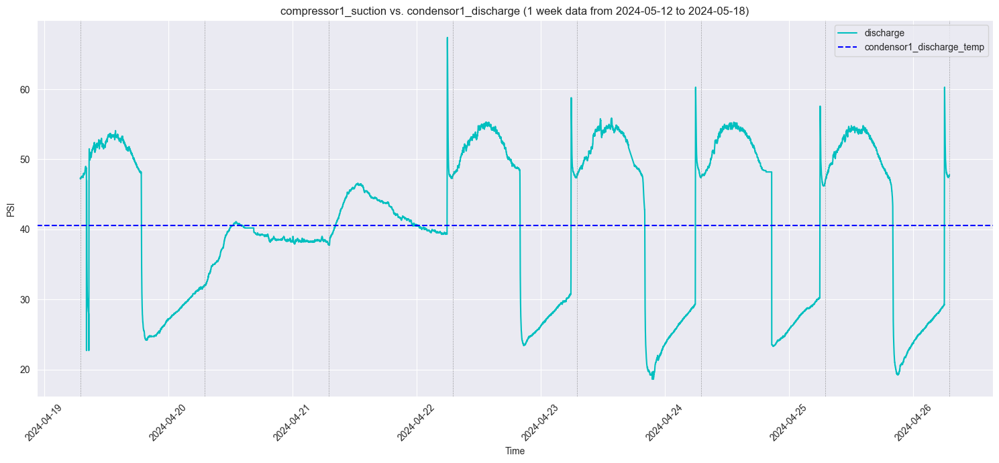

In [28]:
# Convert the start_date to match the timezone of "time" column
start_date = pd.to_datetime('2024-04-19', utc=True).tz_convert('UTC+07:00')
end_date = pd.to_datetime('2024-04-26', utc=True).tz_convert('UTC+07:00')  # Includes data up to midnight

df_filtered = df[(df['time'] >= start_date) & (df['time'] < end_date)]

# Create the figure
plt.figure(figsize=(15, 7))

""" Plot the time series data as lines """
plt.plot(df_filtered["time"], df_filtered["condensor1_discharge_temp"], color="c", label="discharge") 

# Calculate daily boundaries for vertical lines
daily_boundaries = pd.date_range(start_date, end_date, freq='D')

# Add vertical lines at the beginning of each day
for day in daily_boundaries:
    plt.axvline(x=day, color='gray', linestyle='--', alpha=0.7, linewidth=0.5) 
    
# Plot mean values for filtered data
plt.axhline(y=df_filtered["condensor1_discharge_temp"].mean(), color='b', linestyle='--', label="condensor1_discharge_temp")


# Add informative title, labels, and legend
plt.title("compressor1_suction vs. condensor1_discharge (1 week data from 2024-05-12 to 2024-05-18)")
plt.xlabel("Time")
plt.ylabel("PSI")
plt.legend()

# Rotate x-axis labels for better readability with frequent data points
plt.xticks(rotation=45)

# Display the plot
plt.grid(True)
plt.tight_layout()
plt.show()

# - Discharge Temp <90 C
# - Suction Temp <20 C

## Univariate Analysis

In [29]:
# from ydata_profiling import ProfileReport

# profile = ProfileReport(df, title="Profiling Report")
# profile.to_notebook_iframe()

# Explore Data analyst

## Date Time Handling

### Date Time Formatting

In [30]:
df.time = df.time.astype(str)
df.time = df.time.str[:-6]
df.time.head(1)

0    2024-01-16 13:13:00
Name: time, dtype: object

In [31]:
df.time = pd.to_datetime(df.time, format='%Y-%m-%d %H:%M:%S')
df.time.info()

<class 'pandas.core.series.Series'>
RangeIndex: 194607 entries, 0 to 194606
Series name: time
Non-Null Count   Dtype         
--------------   -----         
194607 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 1.5 MB


In [32]:
def create_date_features(source_df, # containing the datetime column.
                         target_df, # where the new features will be added
                         feature_name # name of the column in source_df
                         ):
    '''
    Create new features related to dates.
    source_df : DataFrame consisting of the timestamp related feature
    target_df : DataFrame where new features will be added
    feature_name : Name of the feature of date type which needs to be decomposed.
    '''
    
    # Extarct column and turn into new column
    target_df.loc[:, 'year'] = source_df.loc[:, feature_name].dt.year.astype('uint16')
    target_df.loc[:, 'month'] = source_df.loc[:, feature_name].dt.month.astype('uint8')
    target_df.loc[:, 'hour'] = source_df.loc[:, feature_name].dt.hour.astype('uint8')
    target_df.loc[:, 'day'] = source_df.loc[:, feature_name].dt.day.astype('uint8')
    target_df.loc[:, 'day_name'] = source_df.loc[:, feature_name].dt.day_name()
    target_df.loc[:, 'month_year'] = source_df.loc[:, feature_name].dt.to_period('M')

    return target_df

In [33]:
df = create_date_features(df, df, "time")
df.head()

,time,evaporator_airflow,evaporator_motorfcu,evaporator_eqv_current_indoor,evaporator_supplyair,ambient_temp_indoor,evaporator_eqv_volt_indoor,evaporator_return_temp,ambient_humid_indoor,condensor1_eqv_current_outdoor,...,condensor2_discharge_pressure,condensor2_liquid,condensor2_discharge_temp,compressor2_suction_temp,year,month,hour,day,day_name,month_year
0,2024-01-16 13:13:00,5.3,88.1,3.33,16.0,24.1,388.70,26.8,40.8,5.38,...,315.41,39.6,79.5,17.6,2024,1,13,16,Tuesday,2024-01
1,2024-01-16 13:13:30,5.5,88.0,3.33,16.0,24.1,388.70,26.9,40.9,5.35,...,317.61,39.7,79.5,17.6,2024,1,13,16,Tuesday,2024-01
2,2024-01-16 13:14:30,5.5,87.6,3.34,16.1,24.1,389.31,26.9,41.0,5.41,...,317.48,40.0,79.8,17.8,2024,1,13,16,Tuesday,2024-01
3,2024-01-16 13:15:30,5.3,88.0,3.34,16.3,24.1,388.90,27.0,41.1,5.35,...,318.91,39.9,80.1,18.1,2024,1,13,16,Tuesday,2024-01
4,2024-01-16 13:16:30,5.6,88.0,3.28,16.3,24.2,386.41,27.0,41.3,5.29,...,320.59,40.3,80.4,18.3,2024,1,13,16,Tuesday,2024-01


### Check Datetime Interval

In [34]:
# Select all row and create the new column name datetime-diff that will contains diff time from present compare to previous
df.loc[:, ['datetime-diff']] = df['time'].diff()

# Converts the time differences to a pandas Timedelta object, specifying the unit as minute
df['datetime-diff'] = pd.to_timedelta(df['datetime-diff'], unit='m')

# Filter out the row that not in 1 minute interval
idx = df[(df['datetime-diff'] != '0 days 00:01:00')].index
df.drop(index=idx, inplace=True)

In [35]:
df.head()

,time,evaporator_airflow,evaporator_motorfcu,evaporator_eqv_current_indoor,evaporator_supplyair,ambient_temp_indoor,evaporator_eqv_volt_indoor,evaporator_return_temp,ambient_humid_indoor,condensor1_eqv_current_outdoor,...,condensor2_liquid,condensor2_discharge_temp,compressor2_suction_temp,year,month,hour,day,day_name,month_year,datetime-diff
2,2024-01-16 13:14:30,5.5,87.6,3.34,16.1,24.1,389.31,26.9,41.0,5.41,...,40.0,79.8,17.8,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00
3,2024-01-16 13:15:30,5.3,88.0,3.34,16.3,24.1,388.90,27.0,41.1,5.35,...,39.9,80.1,18.1,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00
4,2024-01-16 13:16:30,5.6,88.0,3.28,16.3,24.2,386.41,27.0,41.3,5.29,...,40.3,80.4,18.3,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00
5,2024-01-16 13:17:30,5.6,87.8,3.30,16.5,24.2,387.51,27.0,41.3,5.35,...,40.6,80.6,18.4,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00
6,2024-01-16 13:18:30,5.7,87.8,3.30,16.5,24.2,387.35,27.0,41.5,5.32,...,41.0,80.8,18.6,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00


### Business hour features

Define new features
```python
"is_business_hours" between 7:00 - 18:00  
"is_dayoff" include both of weekend and holiday
```

In [36]:
df.loc[(df.hour >= 7) & (df.hour <= 17), 'is_business_hours'] = 1
df.loc[(df.hour < 7) | (df.hour > 17), 'is_business_hours'] = 0
df['is_business_hours'].value_counts()

is_business_hours
0.0    105364
1.0     88141
Name: count, dtype: int64

In [37]:
df.head()

,time,evaporator_airflow,evaporator_motorfcu,evaporator_eqv_current_indoor,evaporator_supplyair,ambient_temp_indoor,evaporator_eqv_volt_indoor,evaporator_return_temp,ambient_humid_indoor,condensor1_eqv_current_outdoor,...,condensor2_discharge_temp,compressor2_suction_temp,year,month,hour,day,day_name,month_year,datetime-diff,is_business_hours
2,2024-01-16 13:14:30,5.5,87.6,3.34,16.1,24.1,389.31,26.9,41.0,5.41,...,79.8,17.8,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0
3,2024-01-16 13:15:30,5.3,88.0,3.34,16.3,24.1,388.90,27.0,41.1,5.35,...,80.1,18.1,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0
4,2024-01-16 13:16:30,5.6,88.0,3.28,16.3,24.2,386.41,27.0,41.3,5.29,...,80.4,18.3,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0
5,2024-01-16 13:17:30,5.6,87.8,3.30,16.5,24.2,387.51,27.0,41.3,5.35,...,80.6,18.4,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0
6,2024-01-16 13:18:30,5.7,87.8,3.30,16.5,24.2,387.35,27.0,41.5,5.32,...,80.8,18.6,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0


### Holidays column

In [38]:
import holidays

th_holidays = holidays.country_holidays('TH')

# If time column are on monday-friday and thai holidays then set to 1
df['is_dayoff'] = df['time'].apply(lambda x: 1 if (x.weekday() >= 5 or 
                                                   x in th_holidays) else 0)
df.head()

,time,evaporator_airflow,evaporator_motorfcu,evaporator_eqv_current_indoor,evaporator_supplyair,ambient_temp_indoor,evaporator_eqv_volt_indoor,evaporator_return_temp,ambient_humid_indoor,condensor1_eqv_current_outdoor,...,compressor2_suction_temp,year,month,hour,day,day_name,month_year,datetime-diff,is_business_hours,is_dayoff
2,2024-01-16 13:14:30,5.5,87.6,3.34,16.1,24.1,389.31,26.9,41.0,5.41,...,17.8,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0,0
3,2024-01-16 13:15:30,5.3,88.0,3.34,16.3,24.1,388.90,27.0,41.1,5.35,...,18.1,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0,0
4,2024-01-16 13:16:30,5.6,88.0,3.28,16.3,24.2,386.41,27.0,41.3,5.29,...,18.3,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0,0
5,2024-01-16 13:17:30,5.6,87.8,3.30,16.5,24.2,387.51,27.0,41.3,5.35,...,18.4,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0,0
6,2024-01-16 13:18:30,5.7,87.8,3.30,16.5,24.2,387.35,27.0,41.5,5.32,...,18.6,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0,0


# Create Helpers Function

In [39]:
def plot_useful_info(df, features, title, figsize):
    features.append('time')

    # time series
    df.loc[:, features].set_index('time').plot(title=title, 
                                               figsize=figsize)

    # distribution
    plt.figure(figsize=figsize)
    plt.title(f'{title} distribution')
    sns.histplot(data=df[features[0:2]], 
                 kde=True, 
                 common_norm=True, 
                 stat='density', 
                 bins=50)

    # violin plot
    plt.figure(figsize=figsize)
    plt.title(f'{title} Violin plot')
    sns.violinplot(data=df[features[0:2]])

    # Boxplot
    df.loc[:, features].plot(title=f'{title} boxplot', 
                             kind='box', 
                             figsize=figsize, rot=0)

In [40]:
def remove_outlier(df, threshold, feature, condition:str):
    
    # Applying the condition    
    if condition == '>' :
        df.loc[(df[feature] > threshold, feature)] = np.nan
        df[feature].ffill(inplace=True)
        print("ffill apply")
        
    elif condition == '<':
        df.loc[(df[feature] < threshold, feature)] = np.nan
        df[feature].ffill(inplace=True)
        print("bfill apply")
        
    else:
        raise ValueError("Invalid condition. Please use '>' or '<'.")
    
    if df[feature].isnull().sum() != 0:
        df[feature].bfill(inplace=True)
        print('df[feature].isnull().sum() != 0, do bfill')

# Clean Outlier

## Ambient

### Indoor Temp

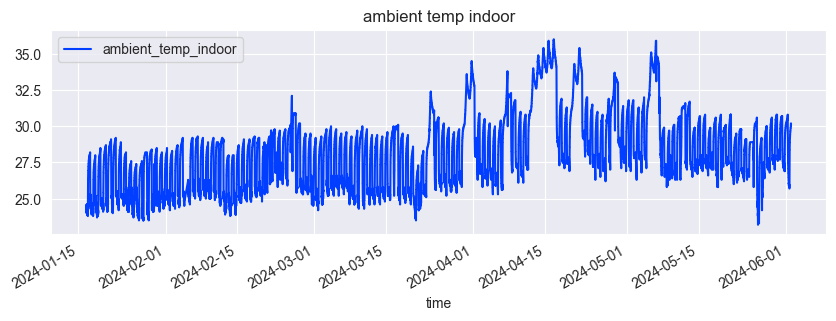

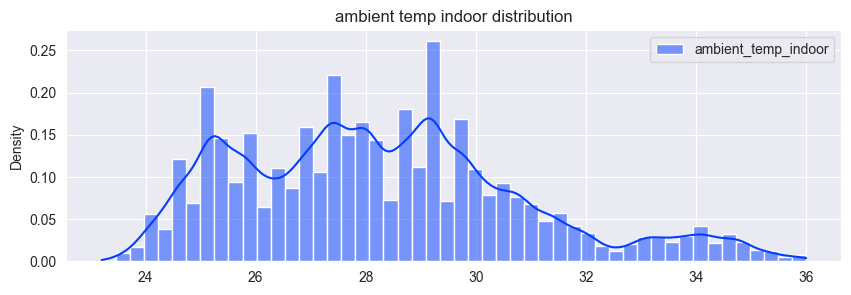

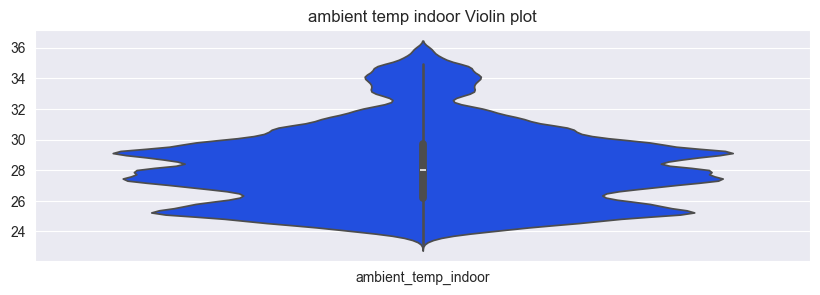

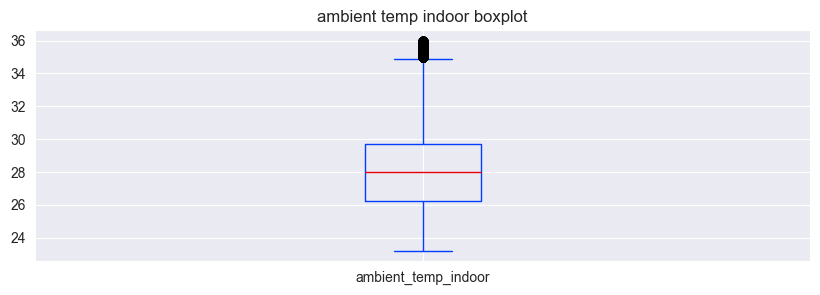

In [41]:
features = ['ambient_temp_indoor']
title = 'ambient temp indoor'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

### Indoor Humid

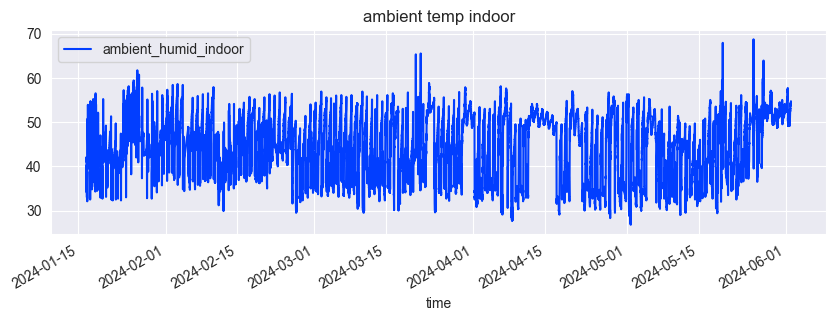

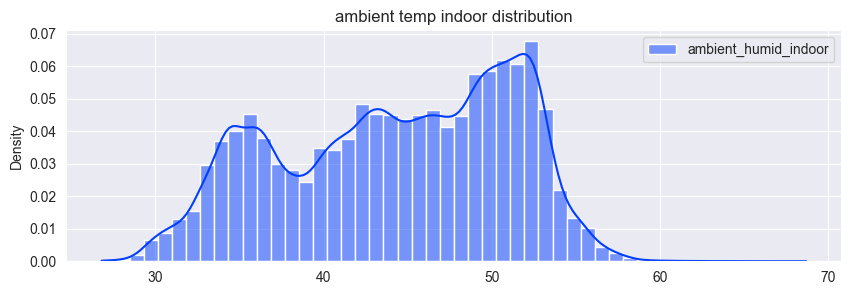

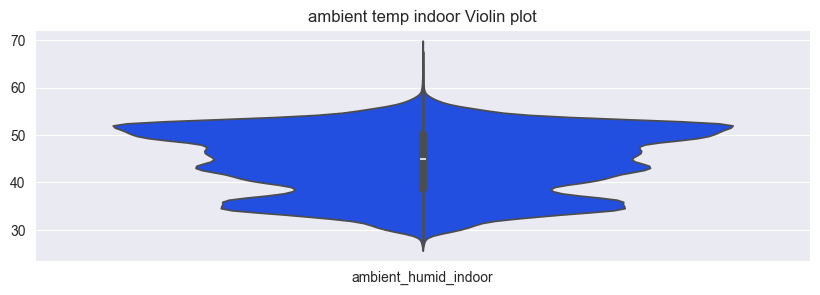

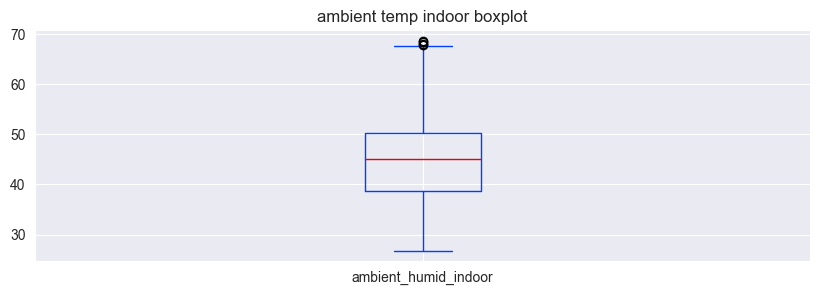

In [42]:
features = ['ambient_humid_indoor']
title = 'ambient temp indoor'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

### Outdoor Temp

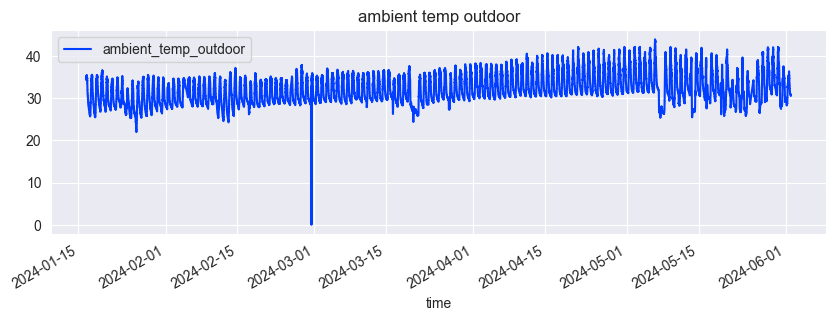

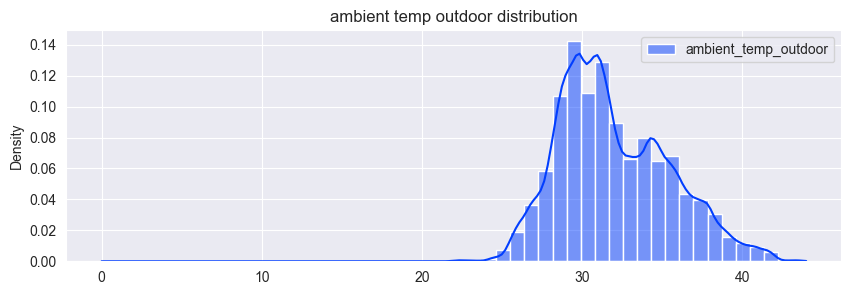

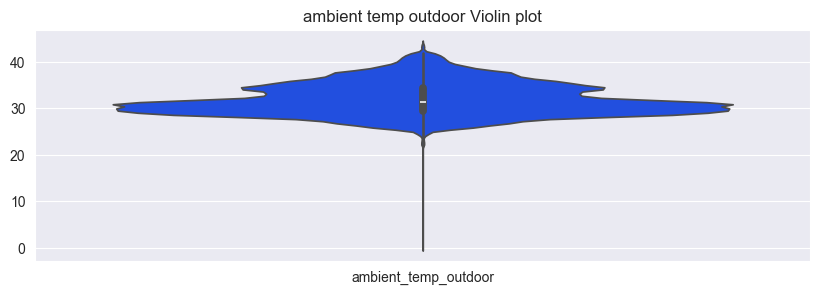

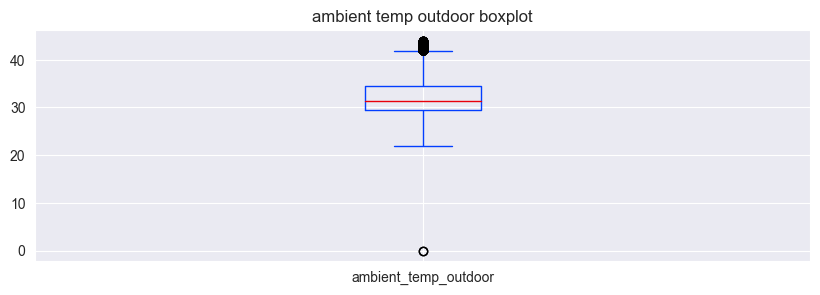

In [43]:
features = ['ambient_temp_outdoor']
title = 'ambient temp outdoor'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

#### Remove Outlier

bfill apply


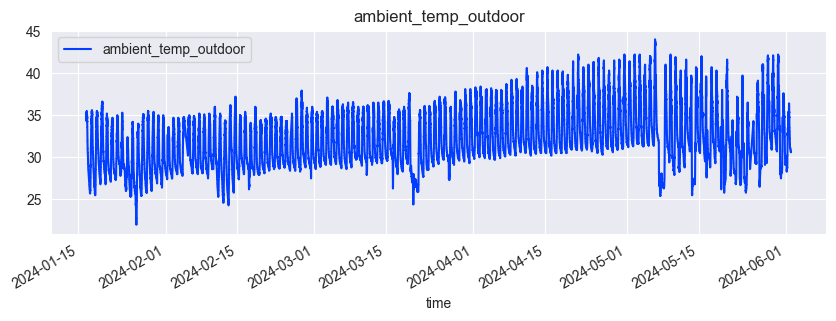

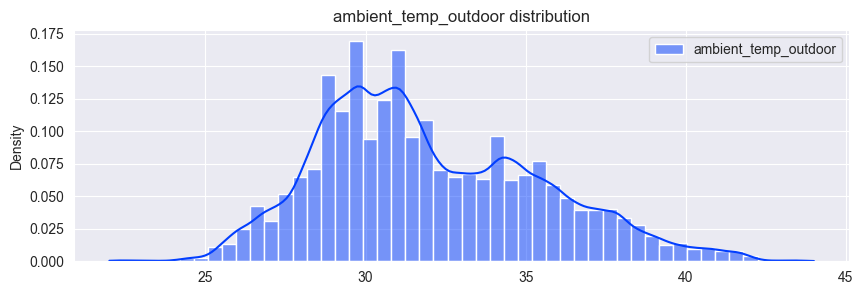

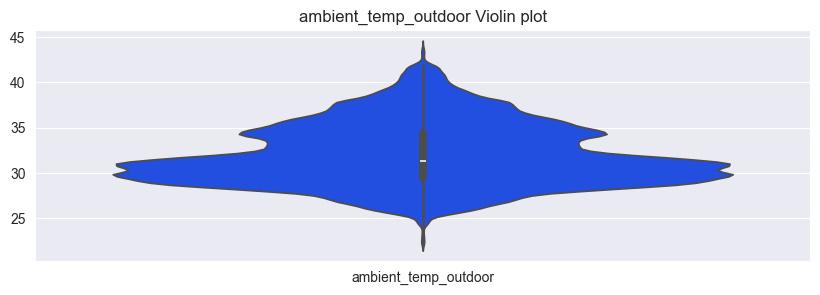

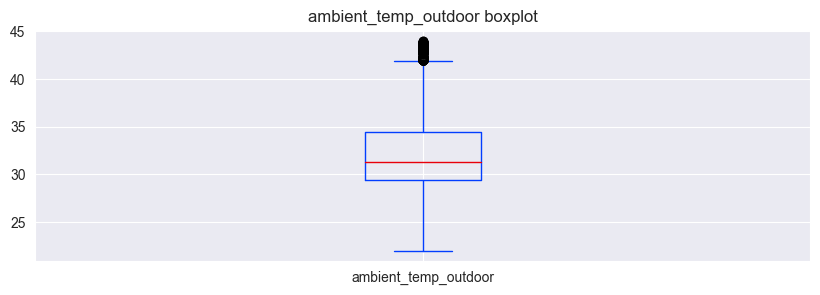

In [44]:
features = ['ambient_temp_outdoor']

# Remove outlier
for feat in features:
    remove_outlier(df=df, threshold=20, feature=feat, condition='<')
    # remove_outlier(df=df, threshold=10, feature=feat, condition='<')
    
# Visualize
title = 'ambient_temp_outdoor'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

### Outdoor Humid

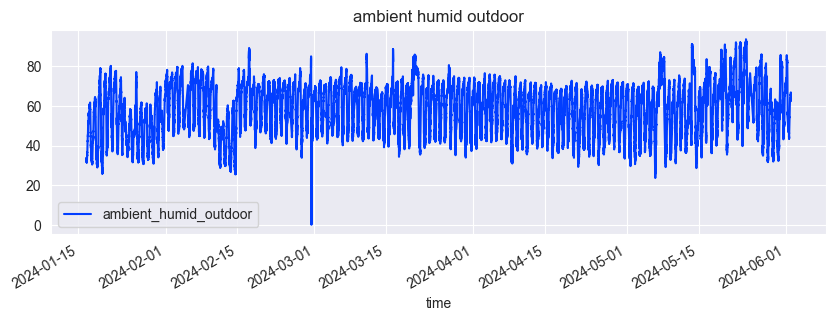

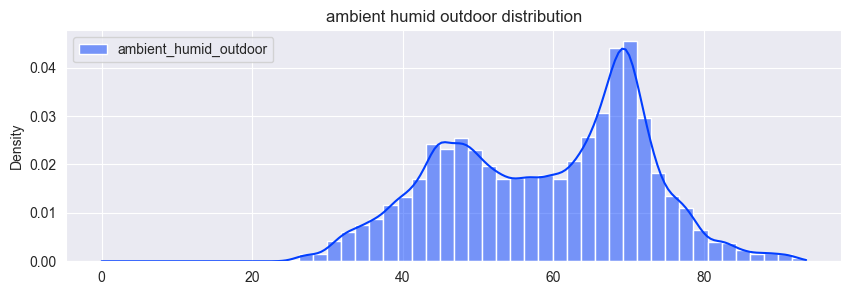

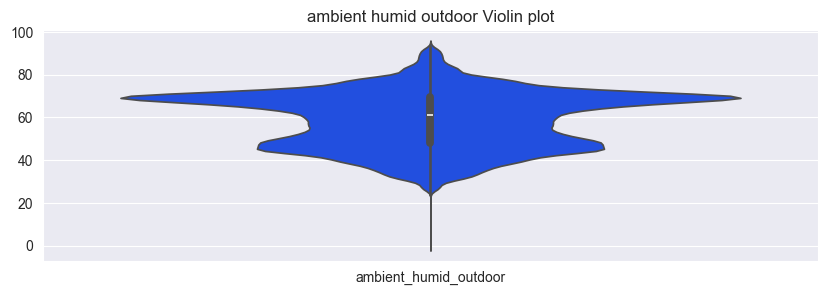

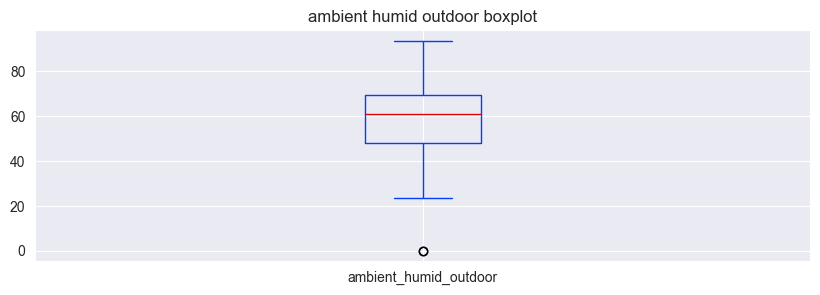

In [45]:
features = ['ambient_humid_outdoor']
title = 'ambient humid outdoor'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

#### Remove outlier

bfill apply


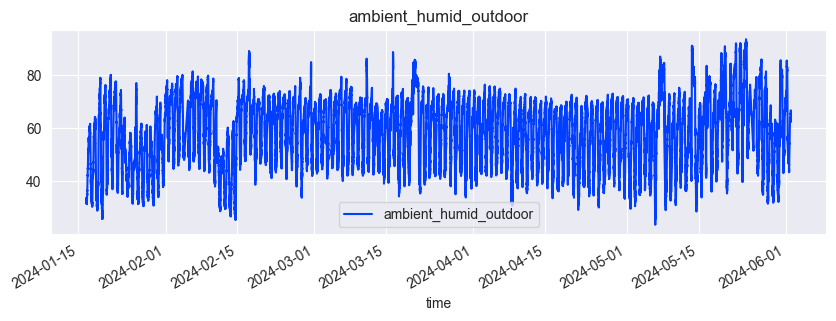

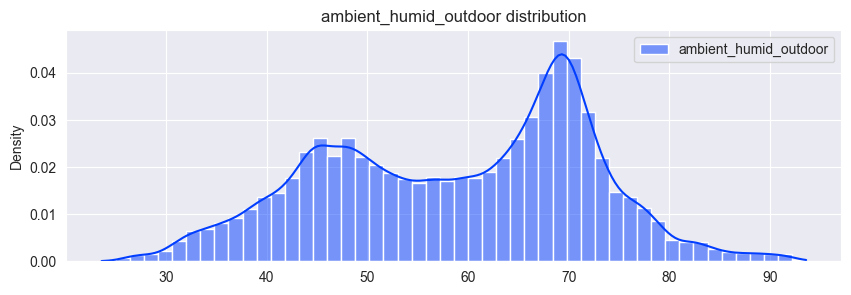

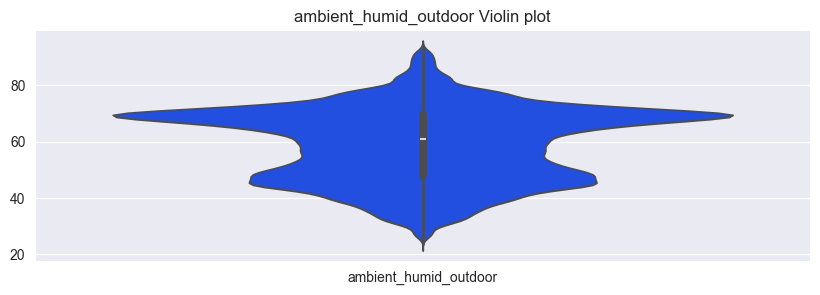

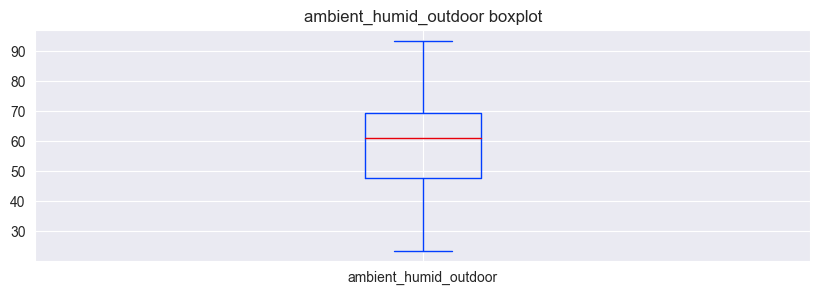

In [46]:
features = ['ambient_humid_outdoor']

# Remove outlier
for feat in features:
    remove_outlier(df=df, threshold=20, feature=feat, condition='<')
    # remove_outlier(df=df, threshold=10, feature=feat, condition='<')
    
# Visualize
title = 'ambient_humid_outdoor'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

## Evaporator

### Air Flow

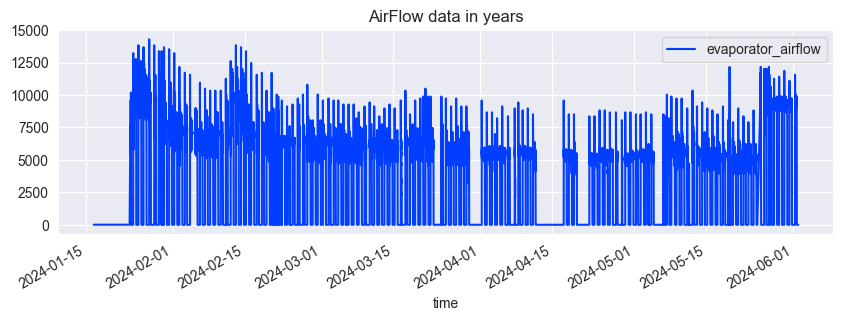

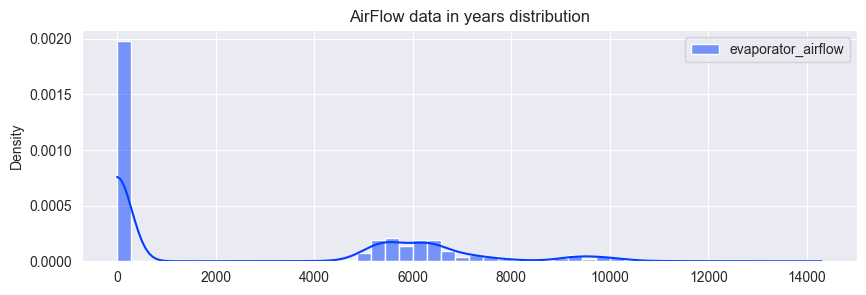

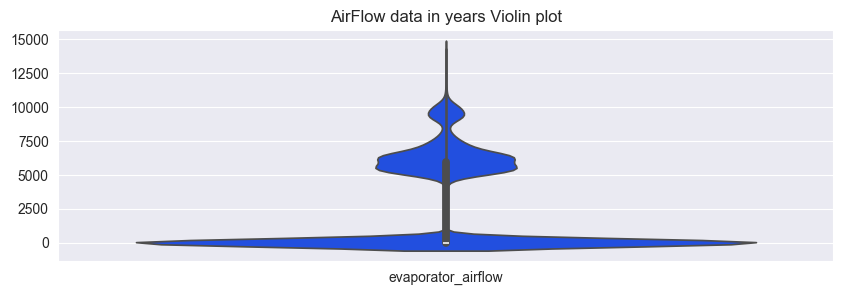

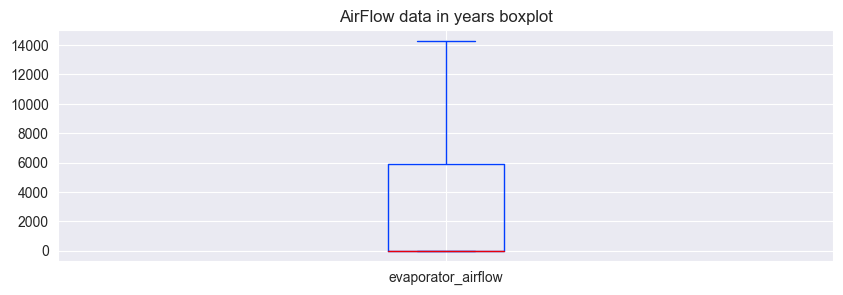

In [47]:
features = ["evaporator_airflow"]
title = "AirFlow data in years"
figsize = (10,3)

plot_useful_info(df=df, features=features, title=title, figsize=figsize)

### Motor FCU

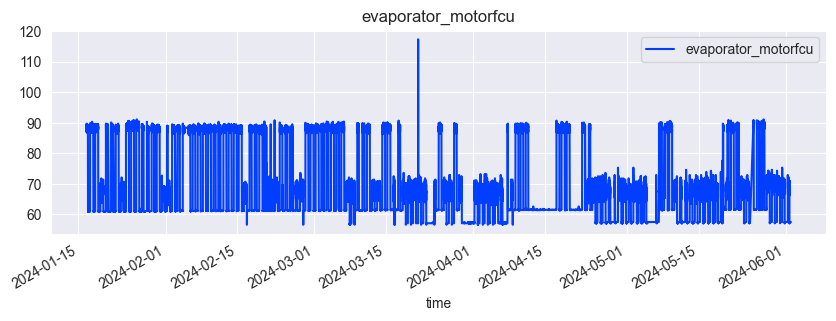

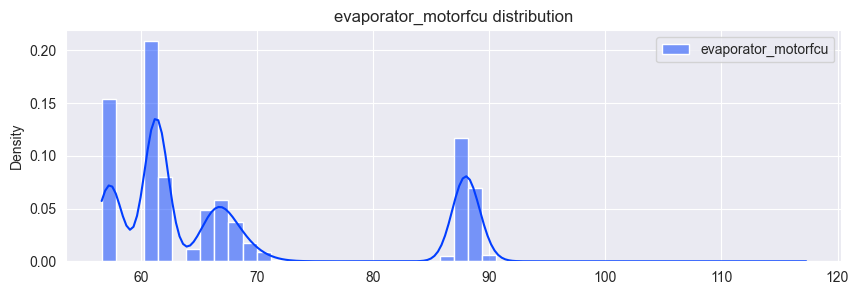

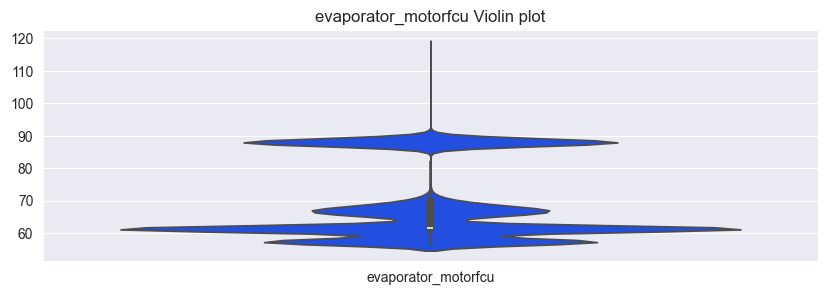

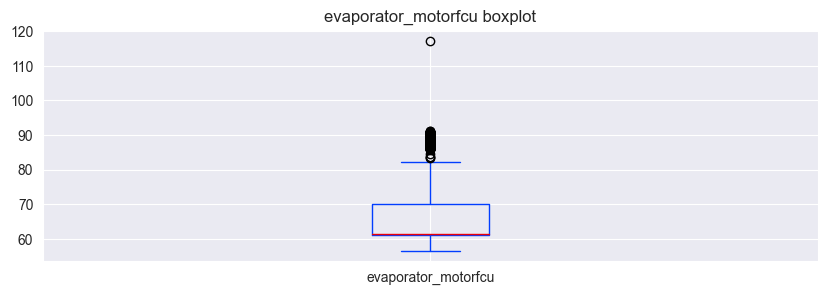

In [48]:
features = ["evaporator_motorfcu"]
title = "evaporator_motorfcu"
figsize = (10,3)

plot_useful_info(df=df, features=features, title=title, figsize=figsize)

#### Remove Outlier

ffill apply


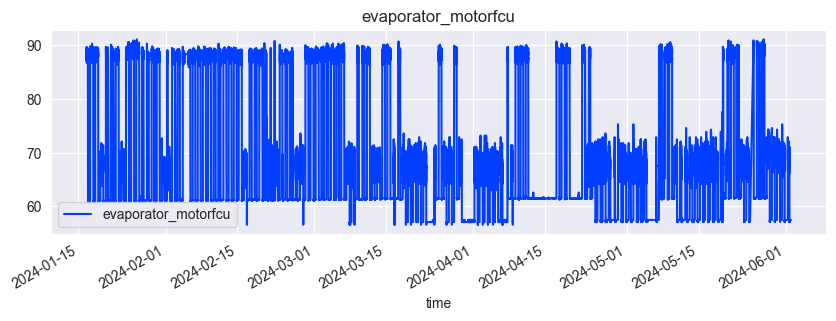

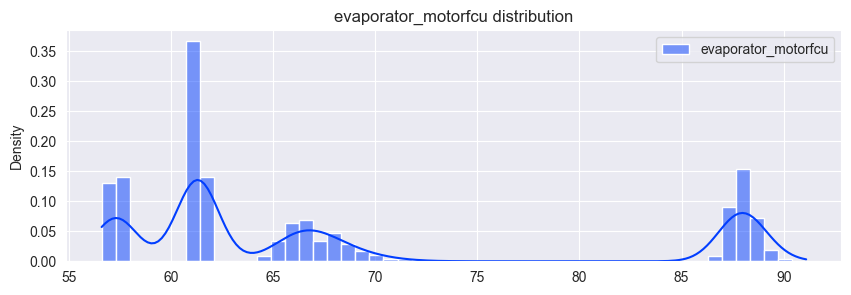

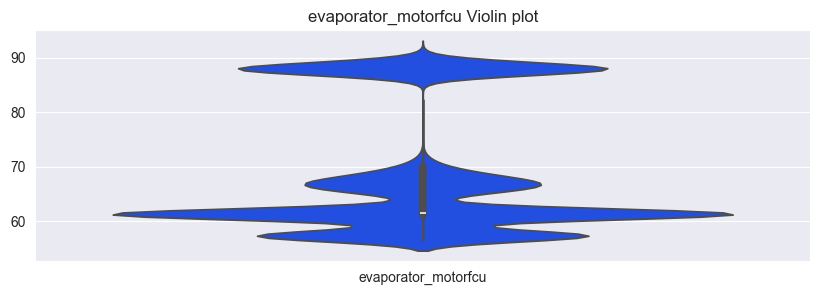

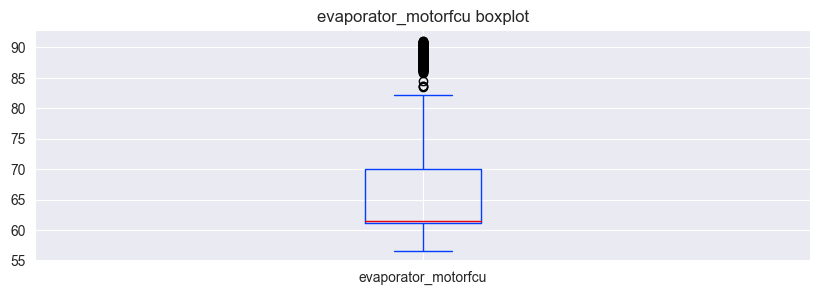

In [49]:
features = ['evaporator_motorfcu']

# Remove outlier
for feat in features:
    remove_outlier(df=df, threshold=100, feature=feat, condition='>')
    
# Visualize
title = 'evaporator_motorfcu'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

### Supply Air Temperature

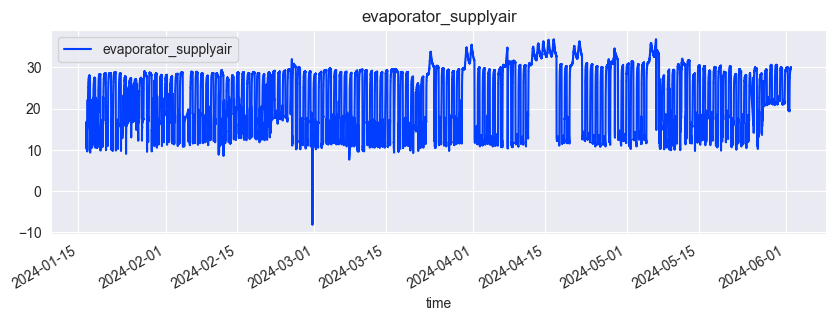

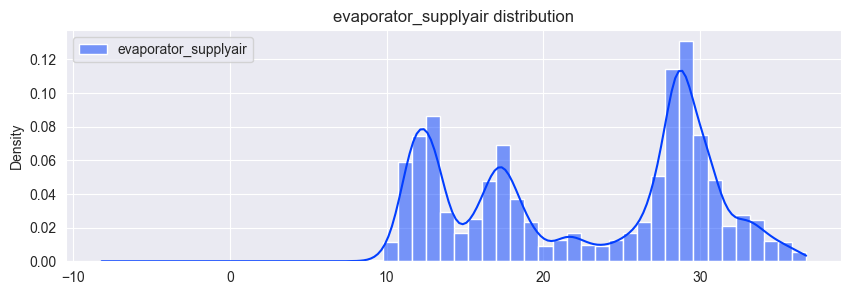

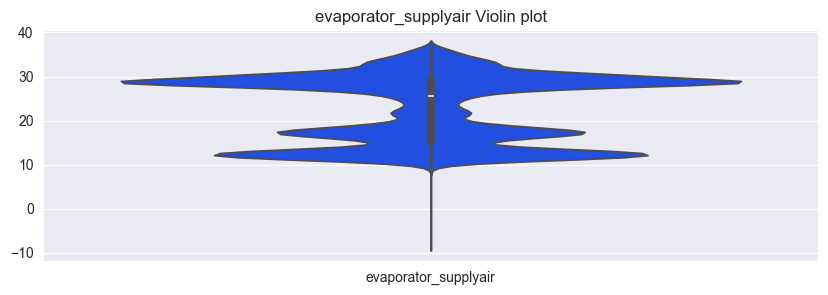

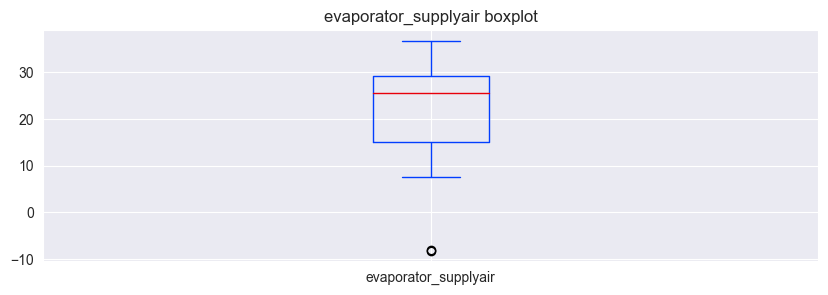

In [50]:
features = ["evaporator_supplyair"]
title = "evaporator_supplyair"
figsize = (10,3)

plot_useful_info(df=df, features=features, title=title, figsize=figsize)

##### Remove Outlier

bfill apply


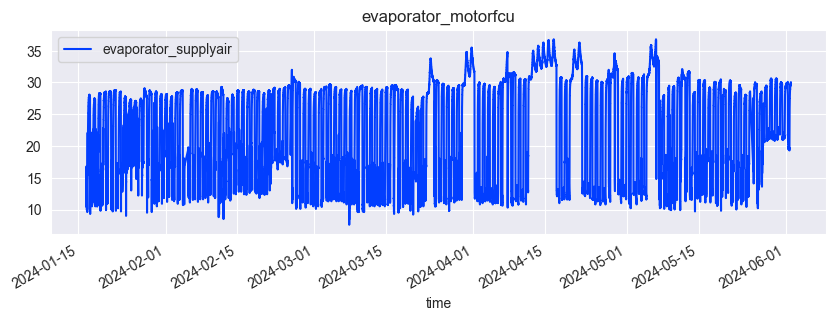

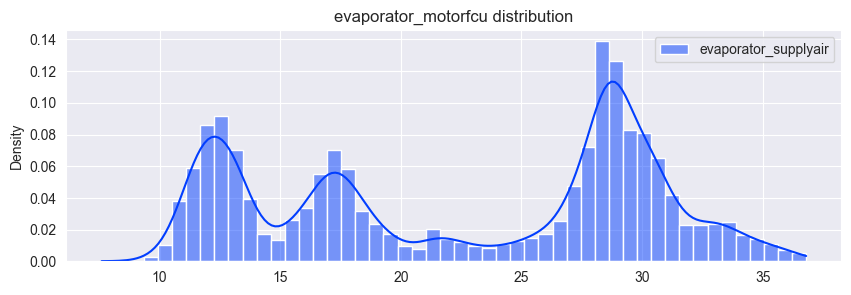

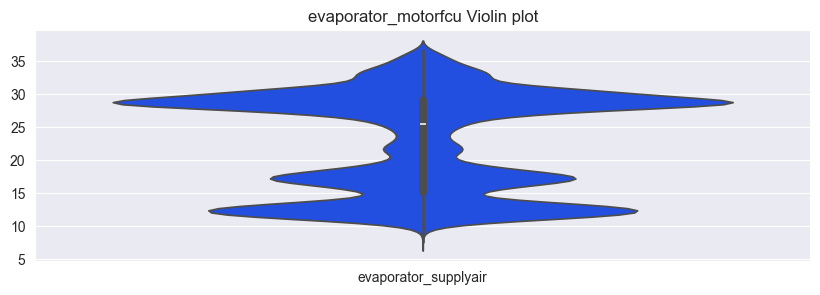

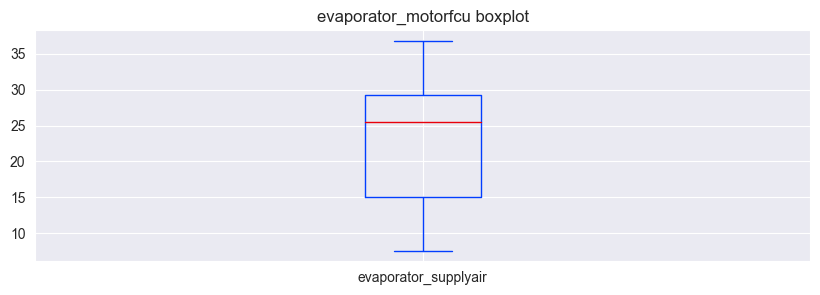

In [51]:
features = ['evaporator_supplyair']

# Remove outlier
for feat in features:
    remove_outlier(df=df, threshold=0, feature=feat, condition='<')
    
# Visualize
title = 'evaporator_motorfcu'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

### Return Temperature

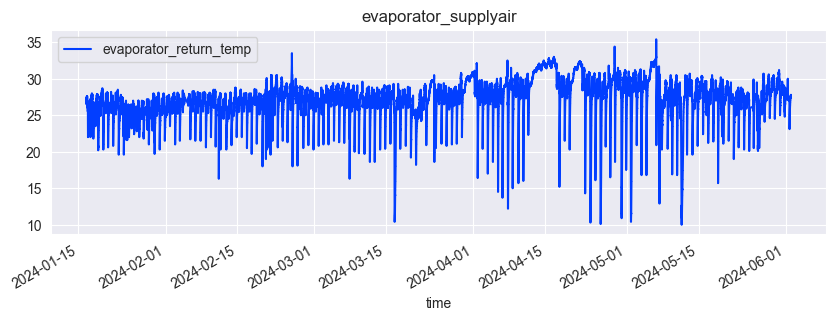

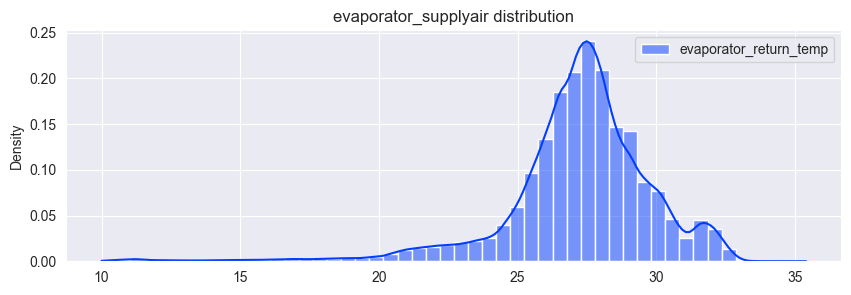

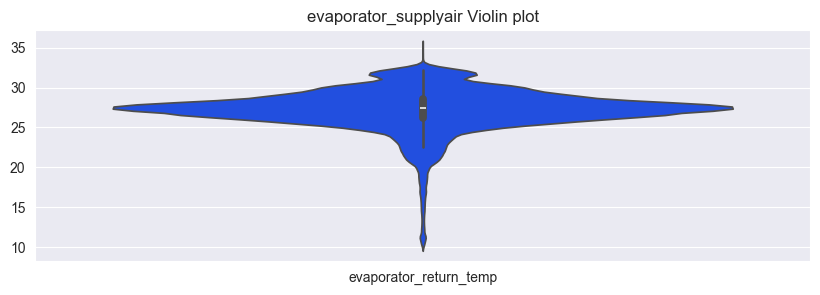

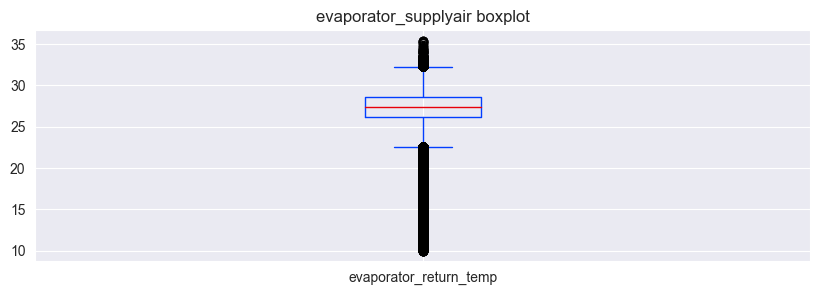

In [52]:
features = ["evaporator_return_temp"]
title = "evaporator_supplyair"
figsize = (10,3)

plot_useful_info(df=df, features=features, title=title, figsize=figsize)

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 193505 entries, 2 to 194606
Data columns (total 34 columns):
 #   Column                          Non-Null Count   Dtype          
---  ------                          --------------   -----          
 0   time                            193505 non-null  datetime64[ns] 
 1   evaporator_airflow              193505 non-null  float64        
 2   evaporator_motorfcu             193505 non-null  float64        
 3   evaporator_eqv_current_indoor   193505 non-null  float64        
 4   evaporator_supplyair            193505 non-null  float64        
 5   ambient_temp_indoor             193505 non-null  float64        
 6   evaporator_eqv_volt_indoor      193505 non-null  float64        
 7   evaporator_return_temp          193505 non-null  float64        
 8   ambient_humid_indoor            193505 non-null  float64        
 9   condensor1_eqv_current_outdoor  193505 non-null  float64        
 10  condensor2_eqv_current_outdoor  193505 non-null  

### Equivalent Voltage Indoor

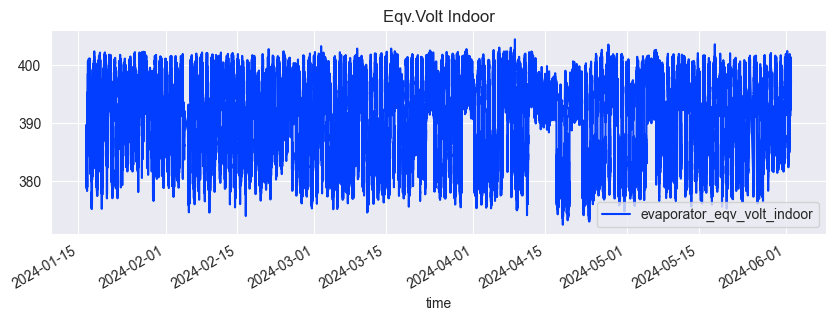

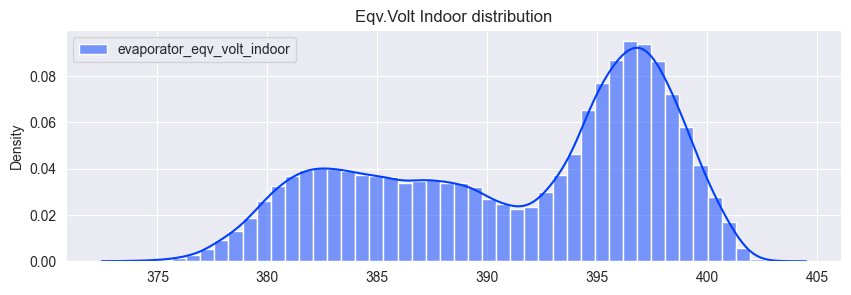

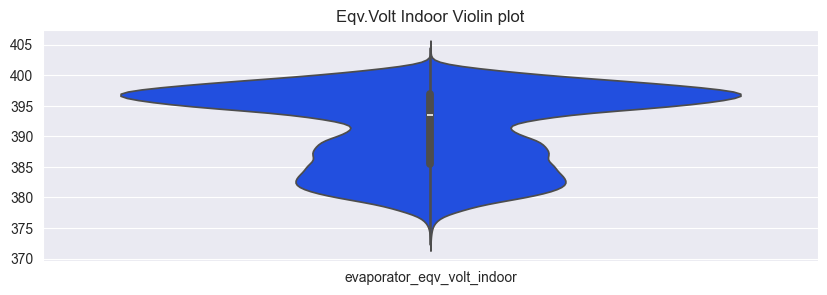

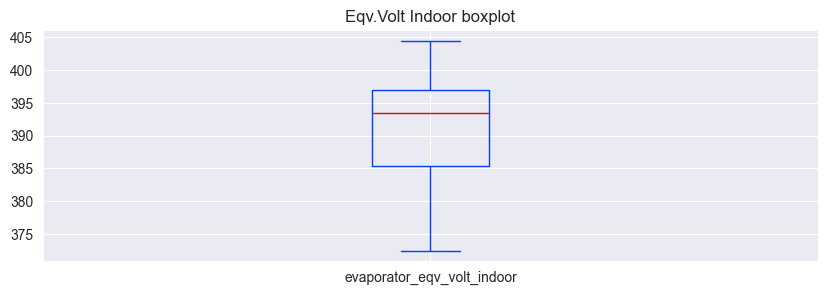

In [54]:
features = ['evaporator_eqv_volt_indoor']
title = 'Eqv.Volt Indoor'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

### Equivalent Current Indoor

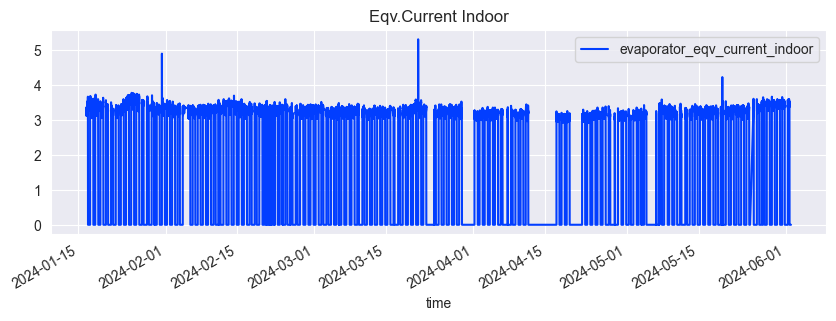

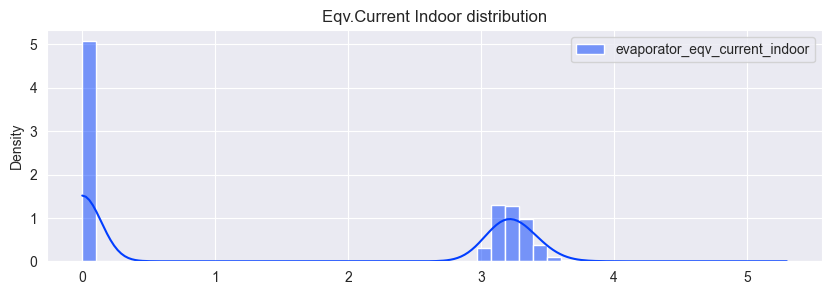

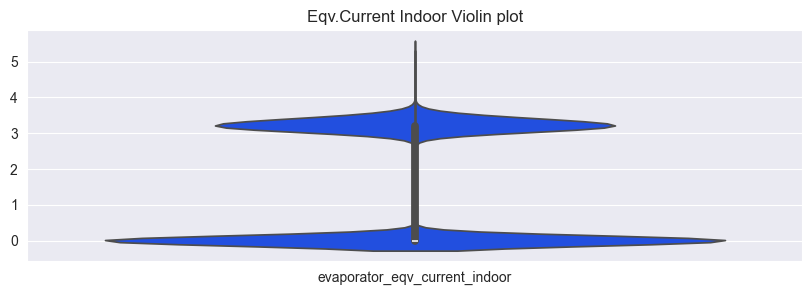

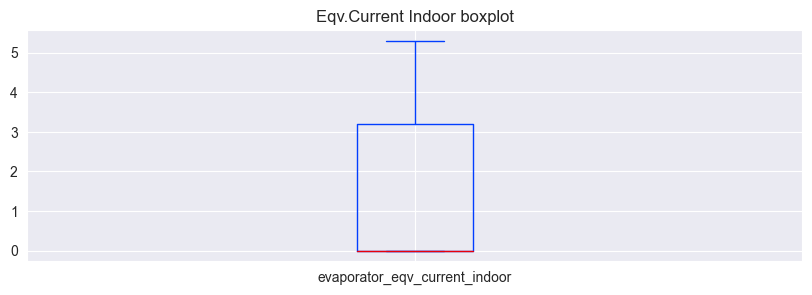

In [55]:
features = ['evaporator_eqv_current_indoor']
title = 'Eqv.Current Indoor'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

## Compressor

### Suction Line Temp

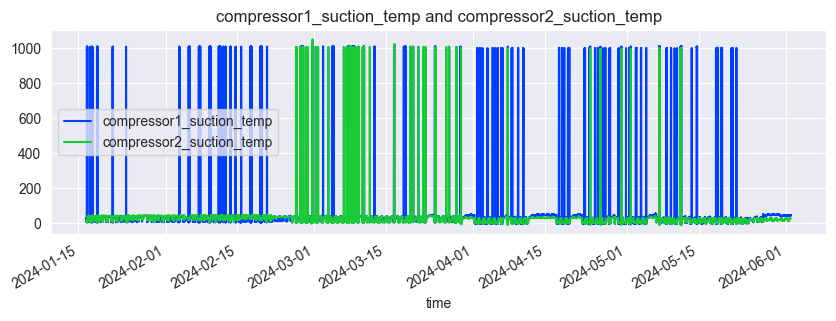

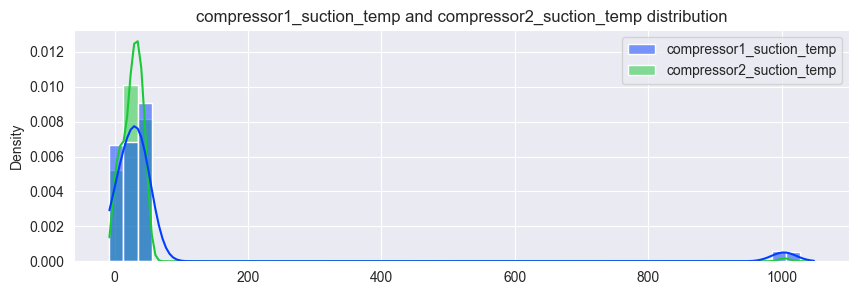

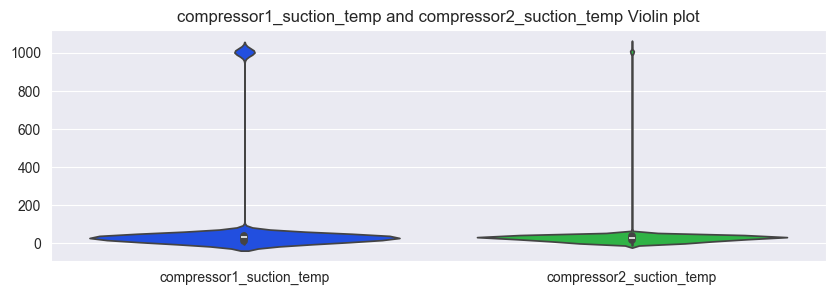

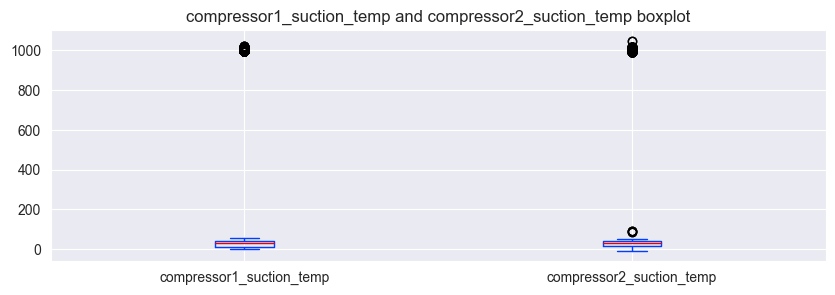

In [56]:
features = ['compressor1_suction_temp', 
            'compressor2_suction_temp']
title = 'compressor1_suction_temp and compressor2_suction_temp'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

#### Remove Outlier

**Suction line temp** should be lower temperature than **Ambient indoor temperature** and will be never higher than ambient indoor temp

In [57]:
df.ambient_temp_indoor.min()

23.2

ffill apply
ffill apply


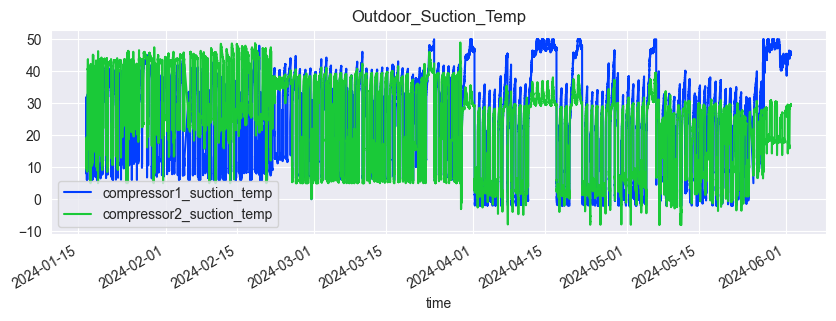

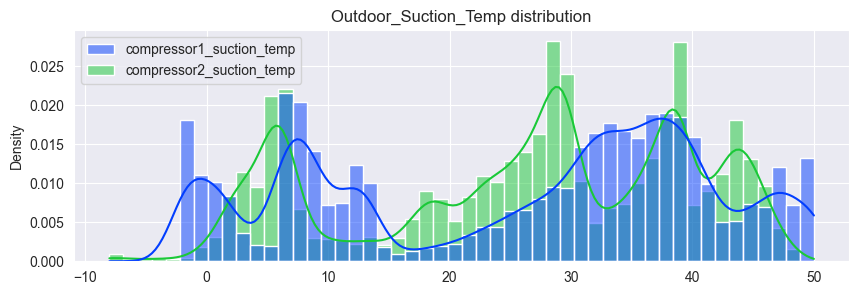

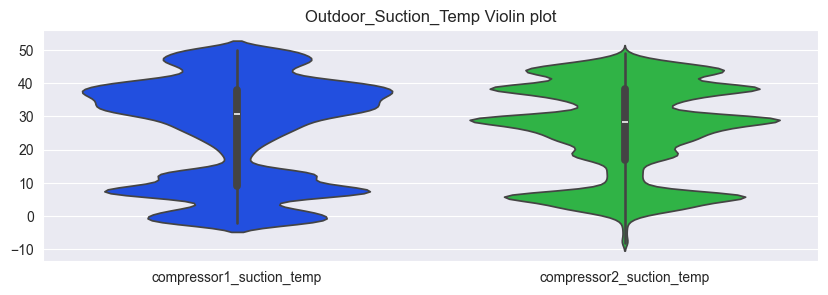

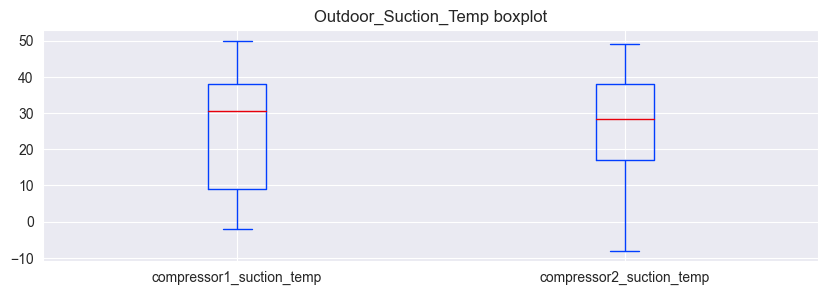

In [58]:
features = ['compressor1_suction_temp', 
            'compressor2_suction_temp']

# Remove outlier
for feat in features:
    remove_outlier(df=df, threshold=50, feature=feat, condition='>')
    # remove_outlier(df=df, threshold=10, feature=feat, condition='<')
    
# Visualize
title = 'Outdoor_Suction_Temp'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

### Suction Line Pressure

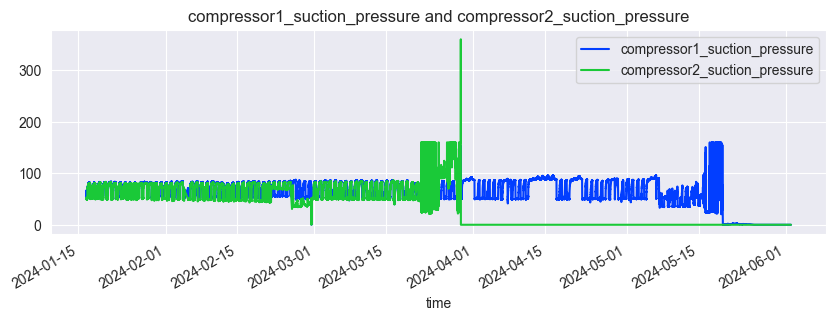

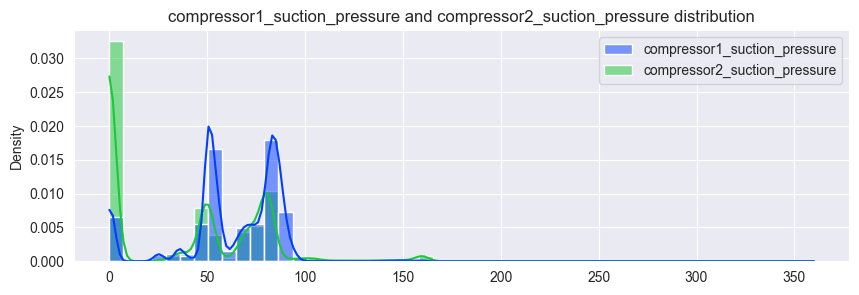

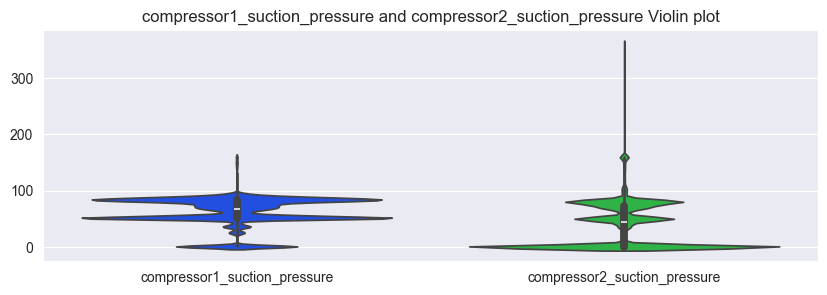

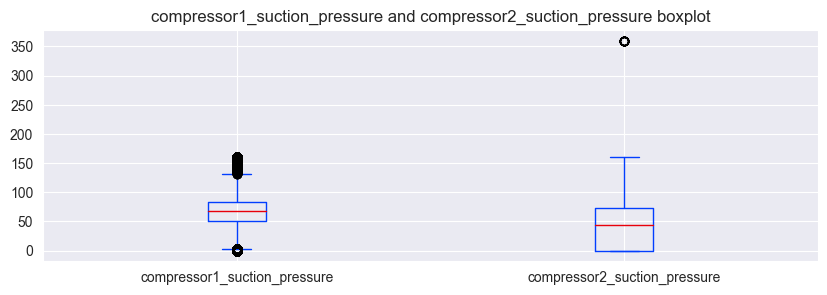

In [59]:
features = ['compressor1_suction_pressure', 
            'compressor2_suction_pressure']
title = 'compressor1_suction_pressure and compressor2_suction_pressure'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

#### Remove Outlier

suction line pressure should **NOT** be higher pressure than discharge line pressure

ffill apply
bfill apply
ffill apply
bfill apply


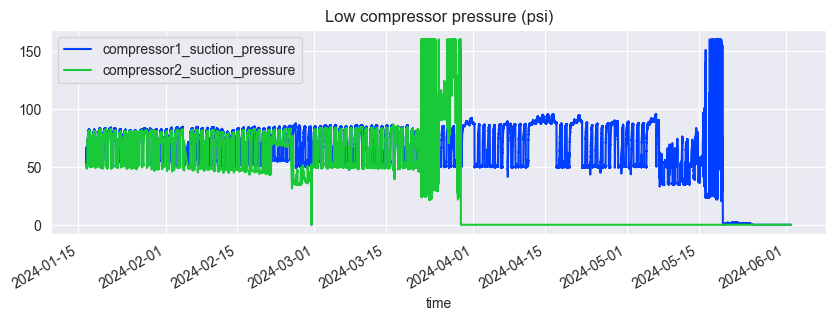

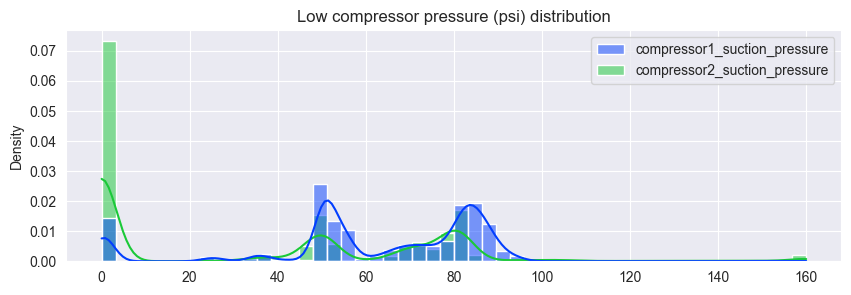

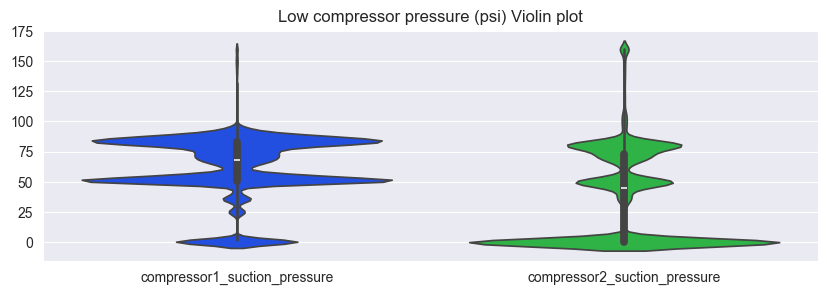

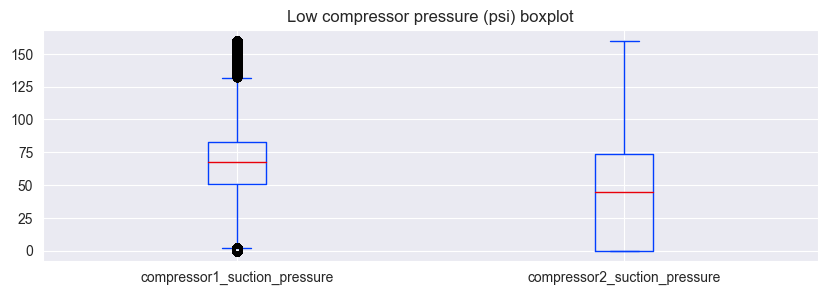

In [60]:
features = ['compressor1_suction_pressure', 
            'compressor2_suction_pressure']

# Remove outlier
for feat in features:
    remove_outlier(df=df, threshold=200, feature=feat, condition='>')
    remove_outlier(df=df, threshold=0, feature=feat, condition='<')
    
# Visualize
title = 'Low compressor pressure (psi)'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

### Drop compressor2 / condensor2 column

From this we will markdown that compressor2 suction line pressure is broken down from sensor data so we will drop compressor2

In [61]:
df.columns

Index(['time', 'evaporator_airflow', 'evaporator_motorfcu',
       'evaporator_eqv_current_indoor', 'evaporator_supplyair',
       'ambient_temp_indoor', 'evaporator_eqv_volt_indoor',
       'evaporator_return_temp', 'ambient_humid_indoor',
       'condensor1_eqv_current_outdoor', 'condensor2_eqv_current_outdoor',
       'compressor1_suction_pressure', 'condensor1_liquid',
       'ambient_temp_outdoor', 'condensor1_eqv_volt_outdoor',
       'condensor2_eqv_volt_outdoor', 'condensor1_discharge_pressure',
       'compressor1_suction_temp', 'ambient_humid_outdoor',
       'compressor2_suction_pressure', 'condensor1_discharge_temp',
       'condensor2_discharge_pressure', 'condensor2_liquid',
       'condensor2_discharge_temp', 'compressor2_suction_temp', 'year',
       'month', 'hour', 'day', 'day_name', 'month_year', 'datetime-diff',
       'is_business_hours', 'is_dayoff'],
      dtype='object')

In [62]:
drop_column = ["compressor2_suction_temp",
               "compressor2_suction_pressure", 
               "condensor2_discharge_temp",
               "condensor2_discharge_pressure",
               "condensor2_liquid",
               "condensor2_eqv_current_outdoor",
               "condensor2_eqv_volt_outdoor"]
df.drop(columns=drop_column, inplace=True)

In [63]:
df.columns

Index(['time', 'evaporator_airflow', 'evaporator_motorfcu',
       'evaporator_eqv_current_indoor', 'evaporator_supplyair',
       'ambient_temp_indoor', 'evaporator_eqv_volt_indoor',
       'evaporator_return_temp', 'ambient_humid_indoor',
       'condensor1_eqv_current_outdoor', 'compressor1_suction_pressure',
       'condensor1_liquid', 'ambient_temp_outdoor',
       'condensor1_eqv_volt_outdoor', 'condensor1_discharge_pressure',
       'compressor1_suction_temp', 'ambient_humid_outdoor',
       'condensor1_discharge_temp', 'year', 'month', 'hour', 'day', 'day_name',
       'month_year', 'datetime-diff', 'is_business_hours', 'is_dayoff'],
      dtype='object')

## Condensor

### Discharge Line Temp

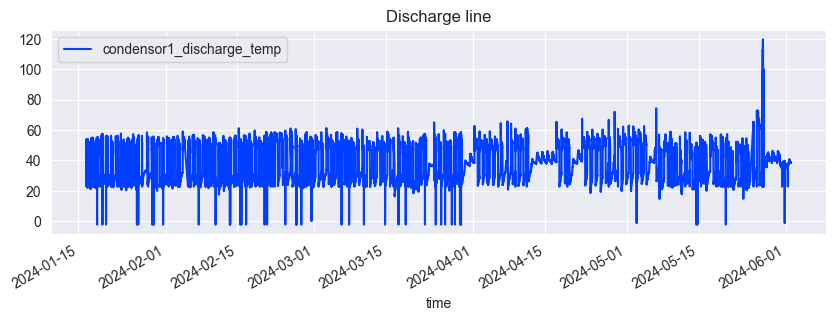

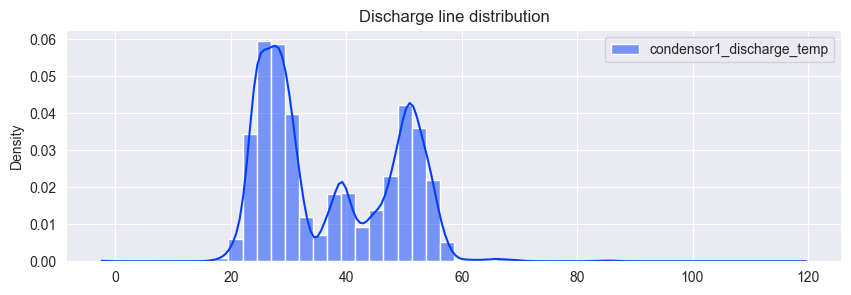

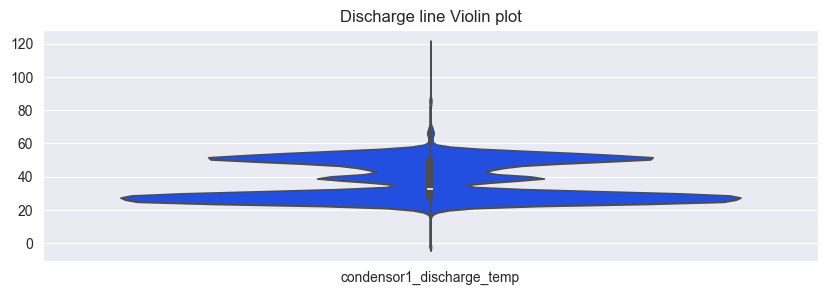

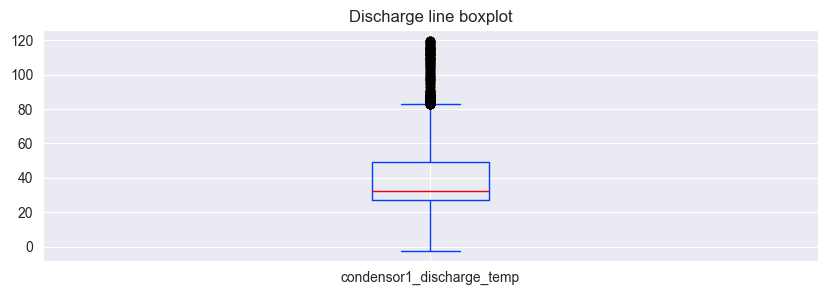

In [64]:
features = ["condensor1_discharge_temp"]
title = "Discharge line"
figsize = (10,3)

plot_useful_info(df=df, features=features, title=title, figsize=figsize)

##### Remove outlier

ffill apply
bfill apply


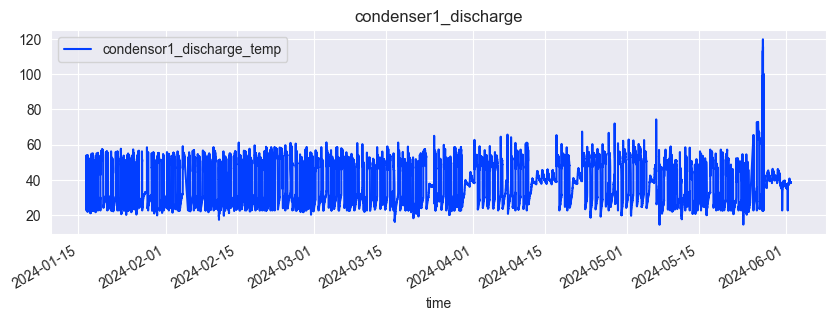

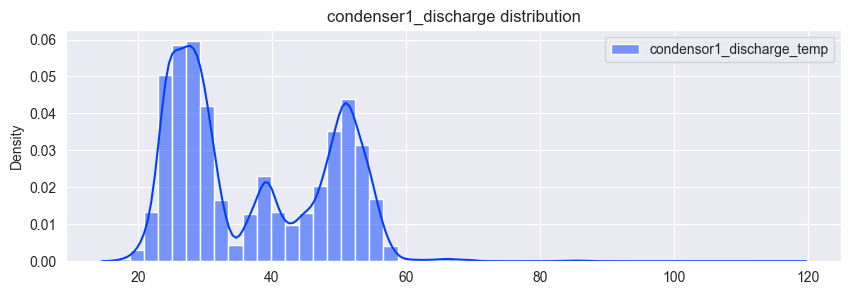

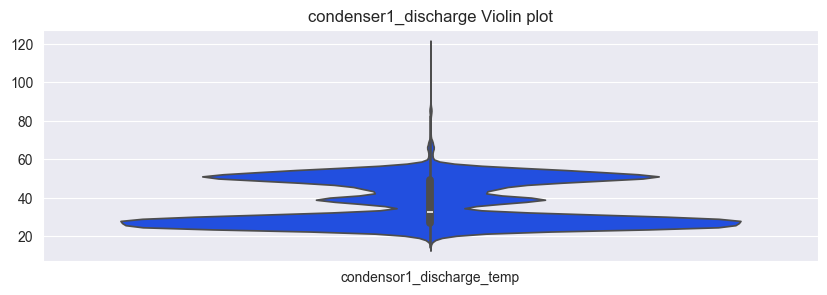

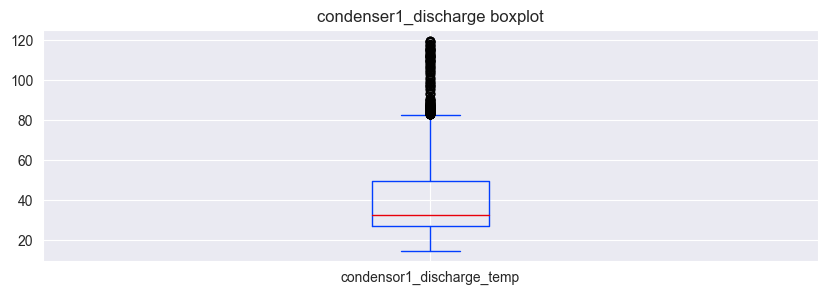

In [65]:
features = ['condensor1_discharge_temp']

# Remove outlier
for feat in features:
    remove_outlier(df=df, threshold=150, feature=feat, condition='>')
    remove_outlier(df=df, threshold=10, feature=feat, condition='<')
    

title = 'condenser1_discharge'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

### Discharge Line Pressure

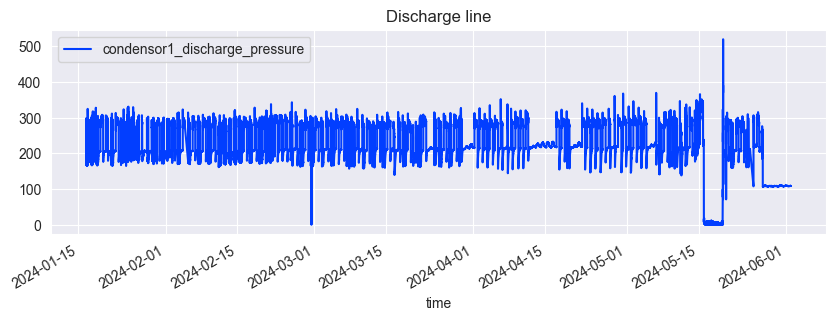

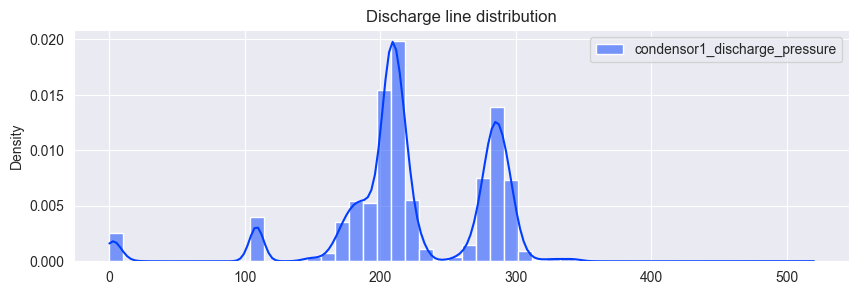

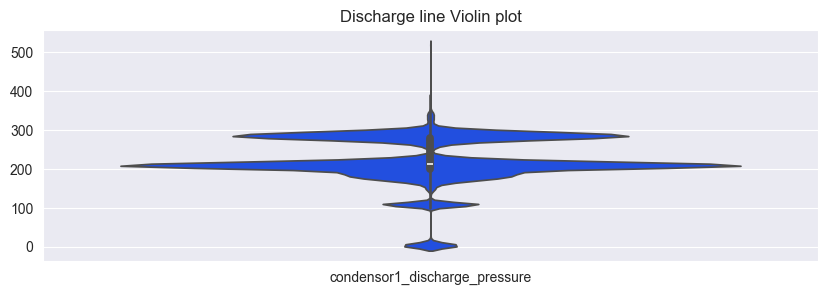

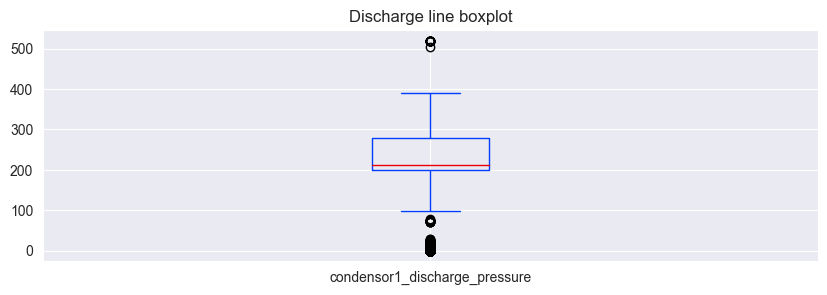

In [66]:
features = ["condensor1_discharge_pressure"]
title = "Discharge line"
figsize = (10,3)

plot_useful_info(df=df, features=features, title=title, figsize=figsize)

##### Remove Outlier

Low compressor or liquid pressure. is mersured at outline of Condensor

So, they must have pressure lower than 'high-pressure' 

and from the R22 spec sheet it have 

```python
'Critical Tempersture' = 96.15 celcius
'Critical Pressure' = 725.189 psi
```

and never higher than High-compressor

In [67]:
df.condensor1_discharge_pressure.min()

0.0

ffill apply
bfill apply


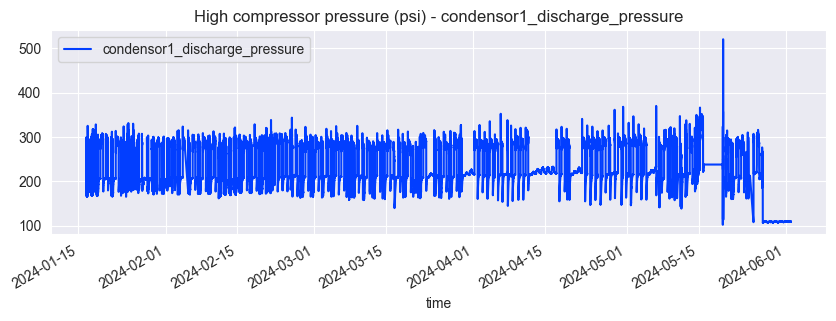

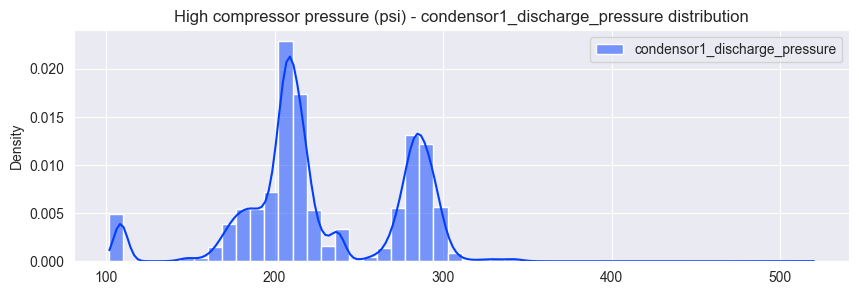

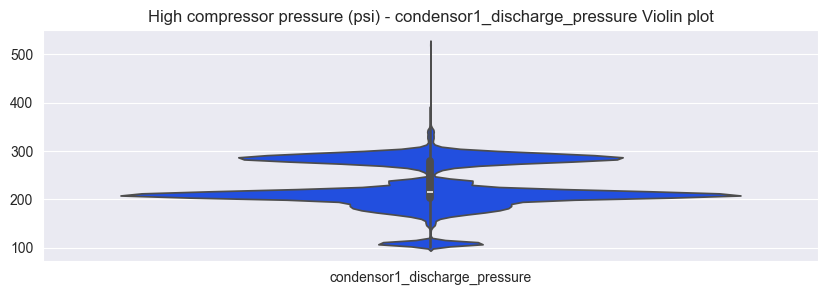

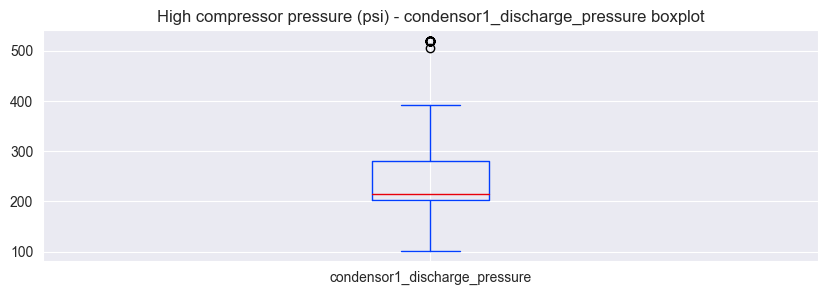

In [68]:
features = ["condensor1_discharge_pressure"]

# Remove outlier
for feat in features:
    remove_outlier(df=df, threshold=800, feature=feat, condition='>')
    remove_outlier(df=df, threshold=100, feature=feat, condition='<')
    
# Visualize
title = 'High compressor pressure (psi) - condensor1_discharge_pressure'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

### Liquid

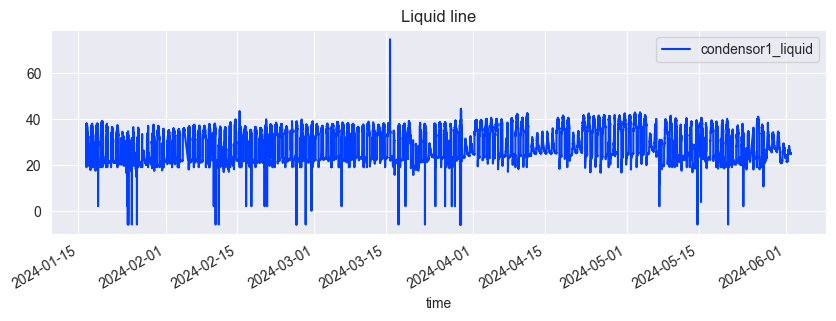

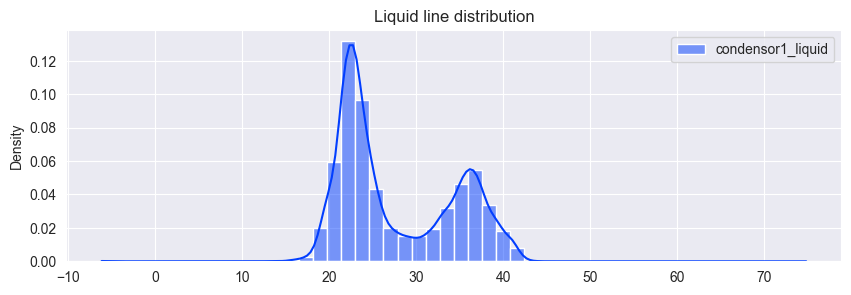

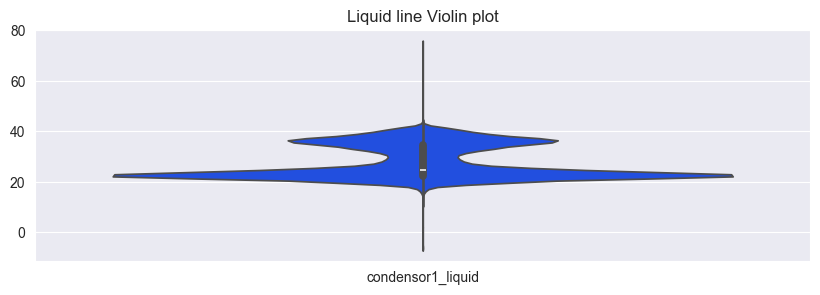

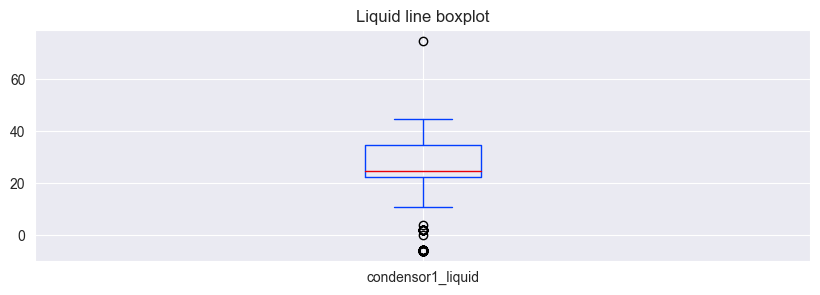

In [69]:
features = ["condensor1_liquid"]
title = "Liquid line"
figsize = (10,3)

plot_useful_info(df=df, features=features, title=title, figsize=figsize)

##### Remove Outlier

liquid temp. is mersured at outline of Condensor they must have temperature lower than 'Discharge temp.' 

ffill apply
bfill apply


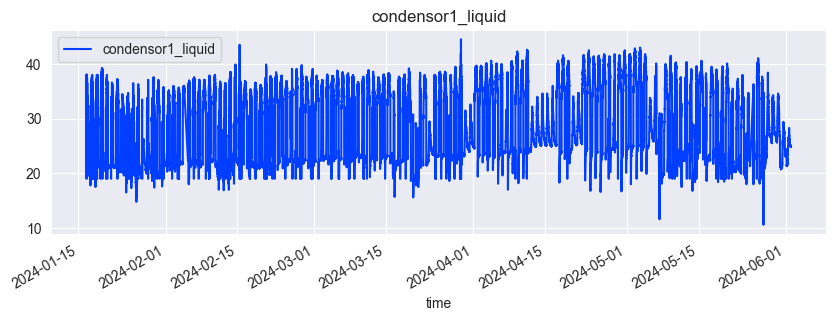

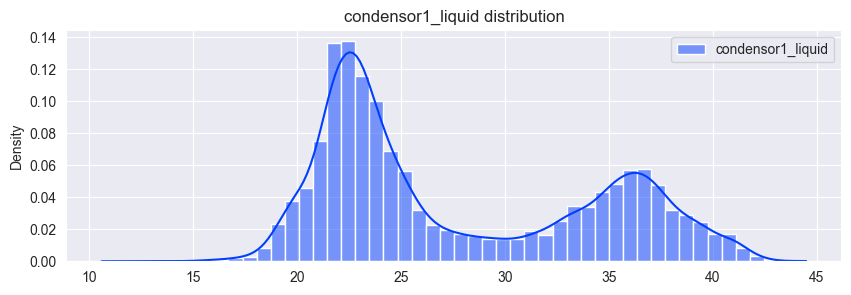

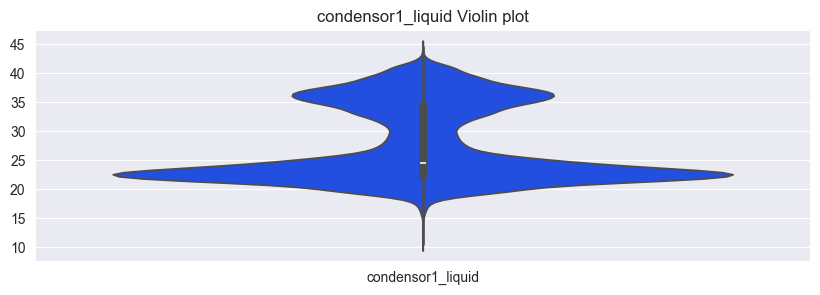

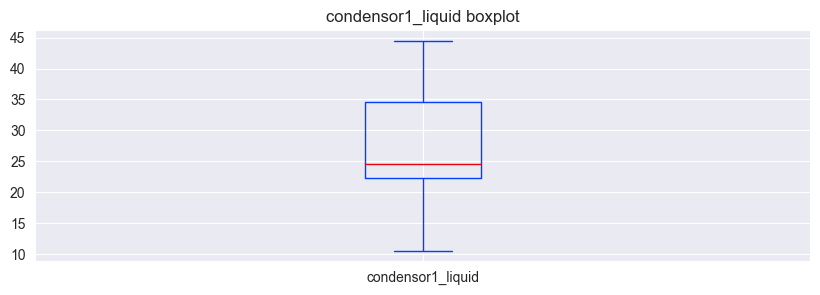

In [70]:
features = ['condensor1_liquid']

# Remove higher outlier
for feat in features:
    remove_outlier(df=df, threshold=60, feature=feat, condition='>')
    
# Remove lower outlier
for feat in features:
    remove_outlier(df=df, threshold=10, feature=feat, condition='<')   
     
# Visualize
title = 'condensor1_liquid'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

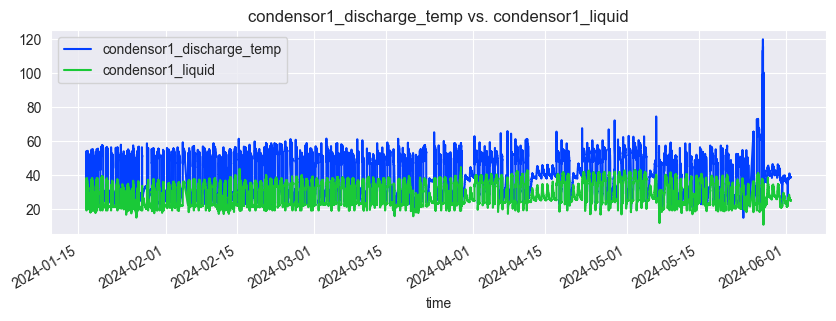

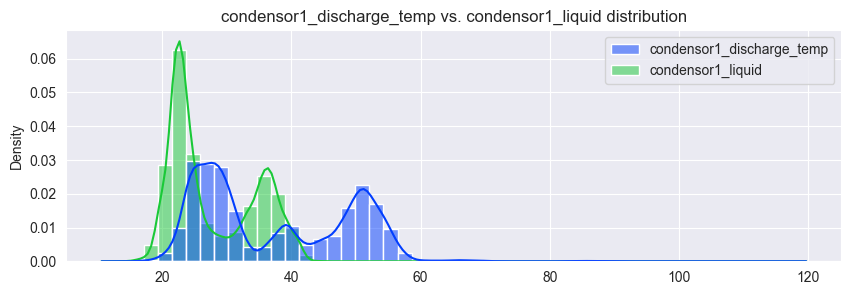

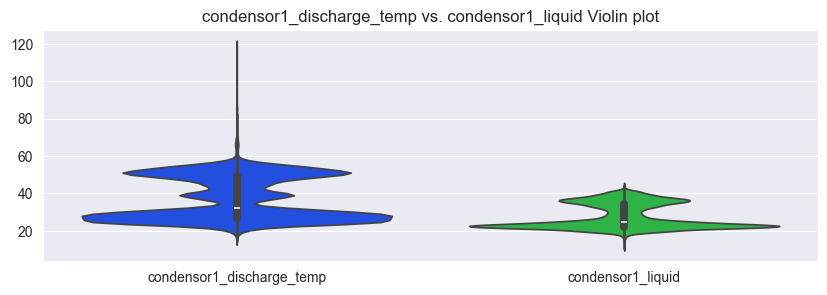

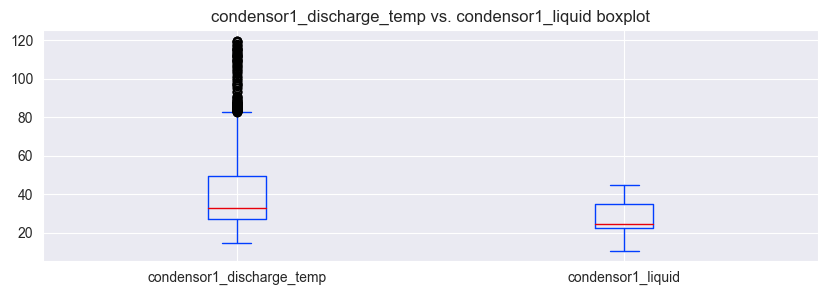

In [71]:
# Compare liquid value to discharge
features = ['condensor1_discharge_temp', 
            'condensor1_liquid']

title = 'condensor1_discharge_temp vs. condensor1_liquid'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

### Equivalent Voltage Outdoor

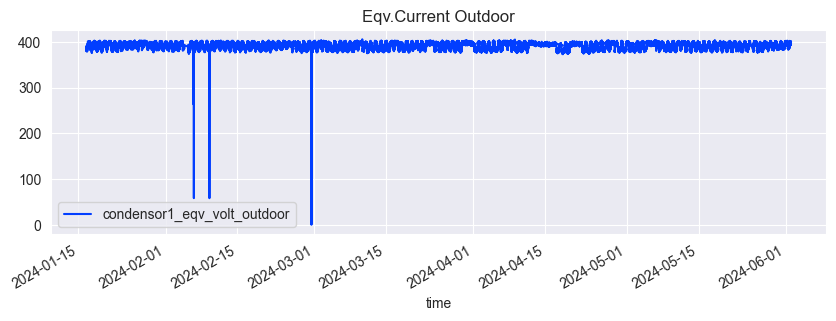

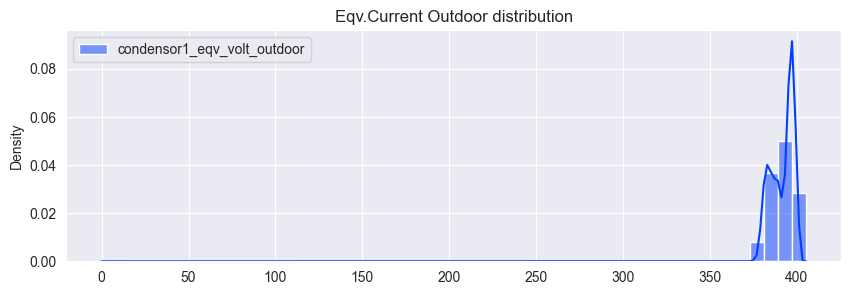

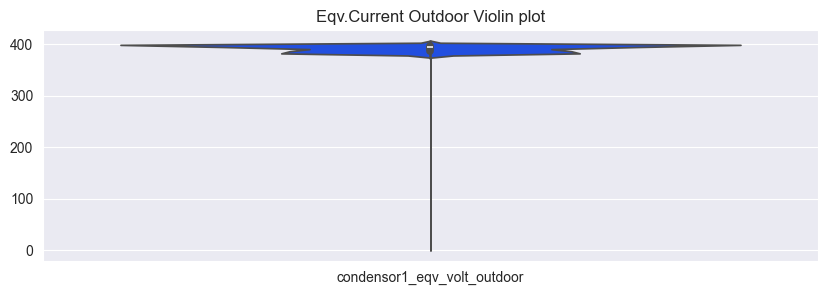

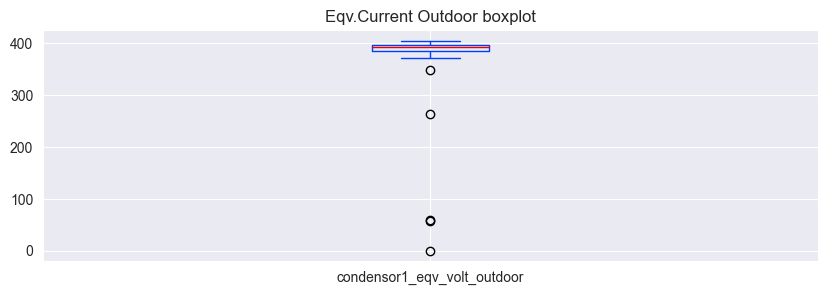

In [72]:
features = ['condensor1_eqv_volt_outdoor']
title = 'Eqv.Current Outdoor'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

##### Remove Outlier

bfill apply


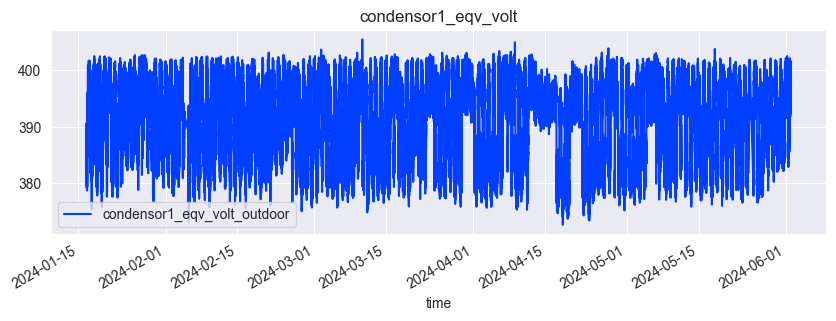

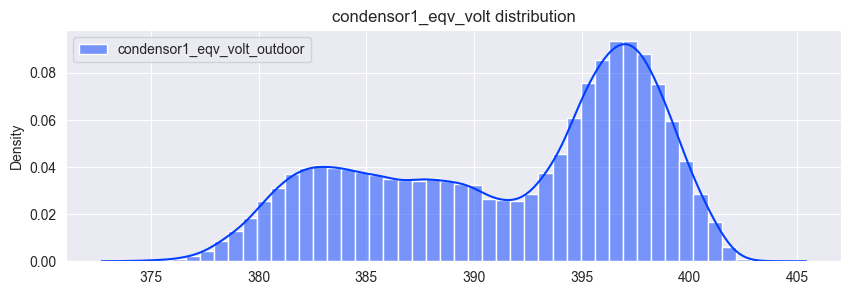

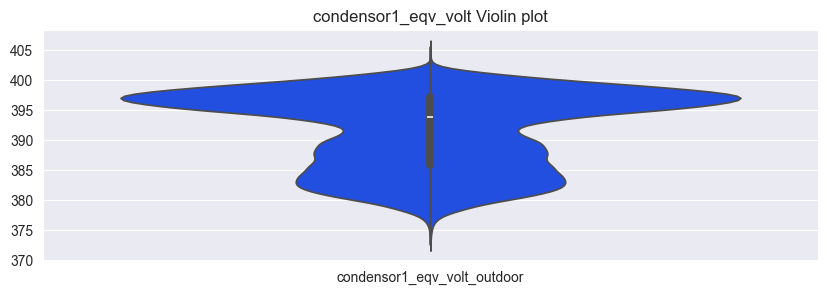

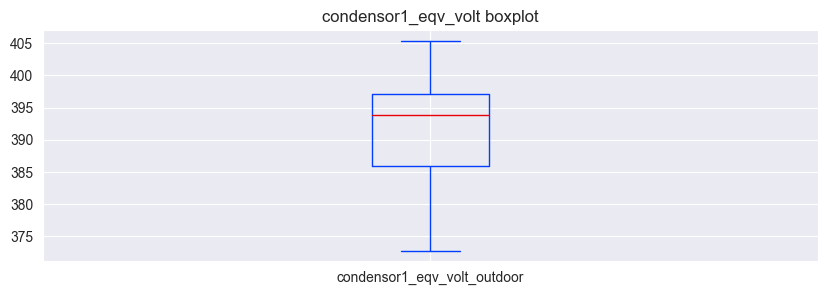

In [73]:
features = ['condensor1_eqv_volt_outdoor']

# Remove higher outlier
for feat in features:
    remove_outlier(df=df, threshold=350, feature=feat, condition='<')
     
# Visualize
title = 'condensor1_eqv_volt'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

### Equivalent Current Outdoor

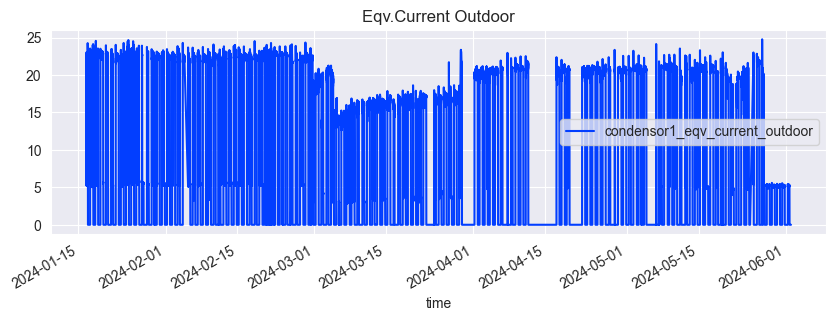

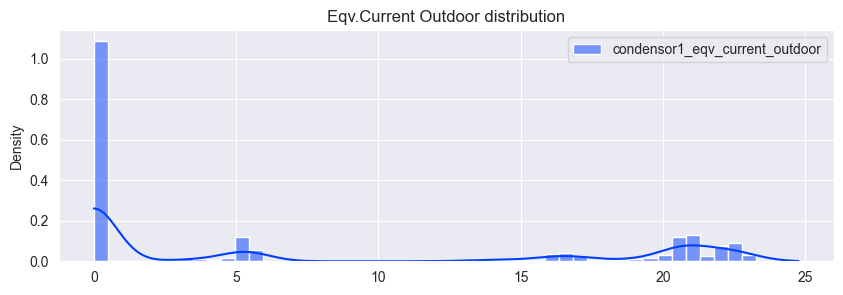

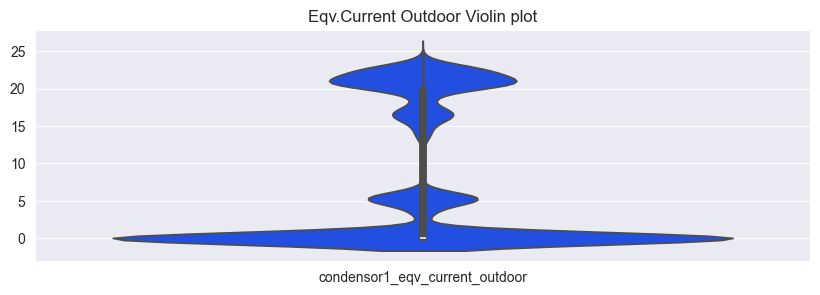

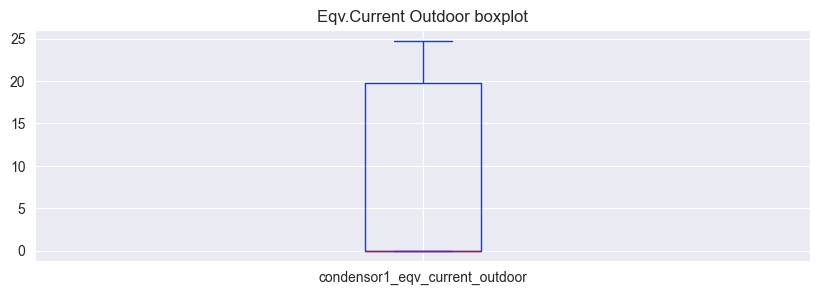

In [74]:
features = ['condensor1_eqv_current_outdoor']
title = 'Eqv.Current Outdoor'
figsize = (10,3)
plot_useful_info(df=df, features=features, title=title, figsize=figsize)

## Dropout Error sensor

In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 193505 entries, 2 to 194606
Data columns (total 27 columns):
 #   Column                          Non-Null Count   Dtype          
---  ------                          --------------   -----          
 0   time                            193505 non-null  datetime64[ns] 
 1   evaporator_airflow              193505 non-null  float64        
 2   evaporator_motorfcu             193505 non-null  float64        
 3   evaporator_eqv_current_indoor   193505 non-null  float64        
 4   evaporator_supplyair            193505 non-null  float64        
 5   ambient_temp_indoor             193505 non-null  float64        
 6   evaporator_eqv_volt_indoor      193505 non-null  float64        
 7   evaporator_return_temp          193505 non-null  float64        
 8   ambient_humid_indoor            193505 non-null  float64        
 9   condensor1_eqv_current_outdoor  193505 non-null  float64        
 10  compressor1_suction_pressure    193505 non-null  

In [76]:
df.head(3)

,time,evaporator_airflow,evaporator_motorfcu,evaporator_eqv_current_indoor,evaporator_supplyair,ambient_temp_indoor,evaporator_eqv_volt_indoor,evaporator_return_temp,ambient_humid_indoor,condensor1_eqv_current_outdoor,...,condensor1_discharge_temp,year,month,hour,day,day_name,month_year,datetime-diff,is_business_hours,is_dayoff
2,2024-01-16 13:14:30,5.5,87.6,3.34,16.1,24.1,389.31,26.9,41.0,5.41,...,29.6,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0,0
3,2024-01-16 13:15:30,5.3,88.0,3.34,16.3,24.1,388.90,27.0,41.1,5.35,...,29.3,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0,0
4,2024-01-16 13:16:30,5.6,88.0,3.28,16.3,24.2,386.41,27.0,41.3,5.29,...,29.1,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0,0


In [77]:
df.reset_index(drop=True, inplace=True)
df

,time,evaporator_airflow,evaporator_motorfcu,evaporator_eqv_current_indoor,evaporator_supplyair,ambient_temp_indoor,evaporator_eqv_volt_indoor,evaporator_return_temp,ambient_humid_indoor,condensor1_eqv_current_outdoor,...,condensor1_discharge_temp,year,month,hour,day,day_name,month_year,datetime-diff,is_business_hours,is_dayoff
0,2024-01-16 13:14:30,5.5,87.6,3.34,16.1,24.1,389.31,26.9,41.0,5.41,...,29.6,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0,0
1,2024-01-16 13:15:30,5.3,88.0,3.34,16.3,24.1,388.90,27.0,41.1,5.35,...,29.3,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0,0
2,2024-01-16 13:16:30,5.6,88.0,3.28,16.3,24.2,386.41,27.0,41.3,5.29,...,29.1,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0,0
3,2024-01-16 13:17:30,5.6,87.8,3.30,16.5,24.2,387.51,27.0,41.3,5.35,...,28.8,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0,0
4,2024-01-16 13:18:30,5.7,87.8,3.30,16.5,24.2,387.35,27.0,41.5,5.32,...,28.7,2024,1,13,16,Tuesday,2024-01,0 days 00:01:00,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193500,2024-06-01 23:55:30,0.0,57.5,0.00,30.0,30.1,396.35,27.8,54.6,0.00,...,38.6,2024,6,23,1,Saturday,2024-06,0 days 00:01:00,0.0,1
193501,2024-06-01 23:56:30,0.0,57.5,0.00,30.0,30.1,396.54,27.8,54.6,0.00,...,38.6,2024,6,23,1,Saturday,2024-06,0 days 00:01:00,0.0,1
193502,2024-06-01 23:57:30,0.0,57.5,0.00,30.0,30.2,397.84,27.8,54.7,0.00,...,38.6,2024,6,23,1,Saturday,2024-06,0 days 00:01:00,0.0,1
193503,2024-06-01 23:58:30,0.0,57.5,0.00,30.0,30.1,398.09,27.8,54.7,0.00,...,38.6,2024,6,23,1,Saturday,2024-06,0 days 00:01:00,0.0,1


In [78]:
df.columns

Index(['time', 'evaporator_airflow', 'evaporator_motorfcu',
       'evaporator_eqv_current_indoor', 'evaporator_supplyair',
       'ambient_temp_indoor', 'evaporator_eqv_volt_indoor',
       'evaporator_return_temp', 'ambient_humid_indoor',
       'condensor1_eqv_current_outdoor', 'compressor1_suction_pressure',
       'condensor1_liquid', 'ambient_temp_outdoor',
       'condensor1_eqv_volt_outdoor', 'condensor1_discharge_pressure',
       'compressor1_suction_temp', 'ambient_humid_outdoor',
       'condensor1_discharge_temp', 'year', 'month', 'hour', 'day', 'day_name',
       'month_year', 'datetime-diff', 'is_business_hours', 'is_dayoff'],
      dtype='object')

## Heat map correlation

In [79]:
# # Plotting the heatmap
# # Used only data sensor features
# df_sensor = df.iloc[:, 1:16]
# df_sensor = df_sensor.astype("float32").corr()

# plt.figure(figsize=(14, 10))
# sns.heatmap(df_sensor, 
#             annot=True, 
#             cmap='coolwarm', 
#             center=0)
# plt.title('Correlation of Dataframe')
# plt.show()

## Plot Time Series data

In [80]:
sensor_clean = ['evaporator_airflow',
 'evaporator_motorfcu',
 'evaporator_eqv_current_indoor',
 'evaporator_supplyair',
 'ambient_temp_indoor',
 'evaporator_eqv_volt_indoor',
 'evaporator_return_temp',
 'ambient_humid_indoor',
 'condensor1_eqv_current_outdoor',
 'compressor1_suction_pressure',
 'condensor1_liquid',
 'ambient_temp_outdoor',
 'condensor1_eqv_volt_outdoor',
 'condensor1_discharge_pressure',
 'compressor1_suction_temp',
 'ambient_humid_outdoor',
 'condensor1_discharge_temp']

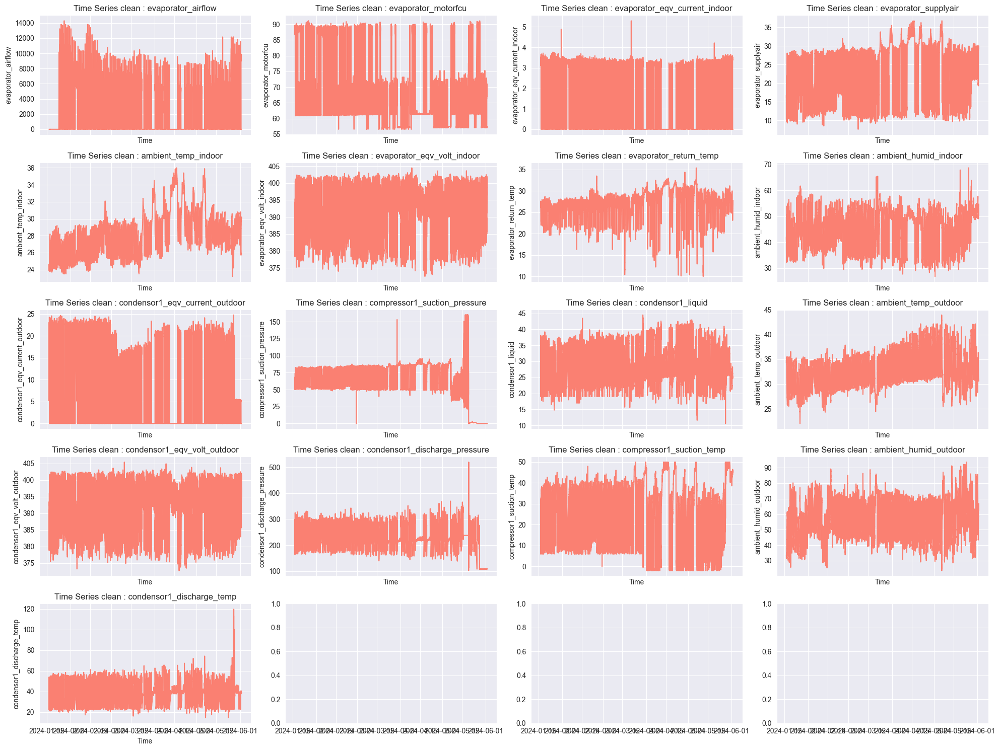

In [81]:
# Set up the matplotlib figure with 4 columns and 6 rows
fig, axes = plt.subplots(5, 4, figsize=(20, 15), sharex=True)  # 6 rows, 4 columns

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each feature as a time series plot
for i, column in enumerate(sensor_clean):
    axes[i].plot(df['time'], df[column], color="salmon")
    axes[i].set_title(f'Time Series clean : {column}')
    axes[i].set_xlabel('Time')
    axes[i].set_ylabel(column)

# Hide any empty subplots if there are less than 24 features
for j in range(len(sensor_clean), 17):
    fig.delaxes(axes[j])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

## Plot Boxplot

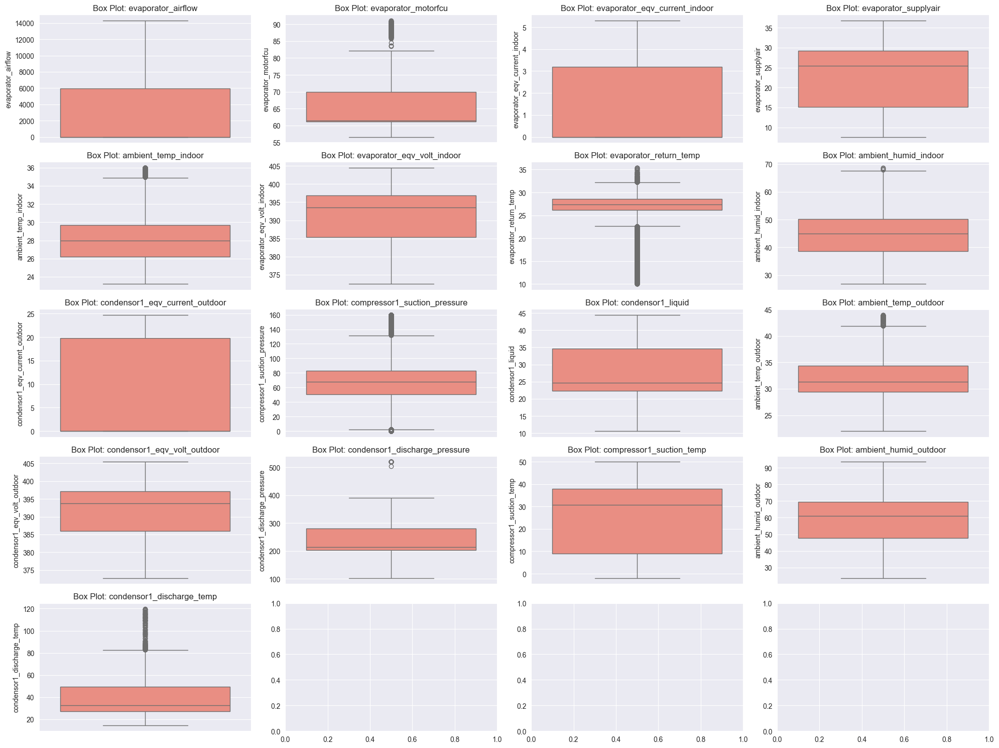

In [82]:
# Set up the matplotlib figure with 4 columns and 6 rows
fig, axes = plt.subplots(5, 4, figsize=(20, 15))  # 6 rows, 4 columns

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each feature's boxplot
for i, column in enumerate(sensor_clean):
    sns.boxplot(data=df, y=column, ax=axes[i], color="salmon")
    axes[i].set_title(f'Box Plot: {column}')
    axes[i].set_xlabel('')
    axes[i].set_ylabel(column)

# Hide any empty subplots if there are less than 24 features
for j in range(len(sensor_clean), 17):
    fig.delaxes(axes[j])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


## Pearson Correlation using scipy

In [83]:
# from scipy import stats

### Profile Report

In [84]:
# profile = ProfileReport(df, title="Profiling Report")
# profile.to_notebook_iframe()

# Feature Engineering

In [85]:
df.keys()

Index(['time', 'evaporator_airflow', 'evaporator_motorfcu',
       'evaporator_eqv_current_indoor', 'evaporator_supplyair',
       'ambient_temp_indoor', 'evaporator_eqv_volt_indoor',
       'evaporator_return_temp', 'ambient_humid_indoor',
       'condensor1_eqv_current_outdoor', 'compressor1_suction_pressure',
       'condensor1_liquid', 'ambient_temp_outdoor',
       'condensor1_eqv_volt_outdoor', 'condensor1_discharge_pressure',
       'compressor1_suction_temp', 'ambient_humid_outdoor',
       'condensor1_discharge_temp', 'year', 'month', 'hour', 'day', 'day_name',
       'month_year', 'datetime-diff', 'is_business_hours', 'is_dayoff'],
      dtype='object')

## Diff. Pressure

In [86]:
# High side pressure : df.compressore1_suction_pressure
# Low side presssure : df.condensor1_discharge_pressure
df["diff_pressure"] = np.abs( df.compressor1_suction_pressure - df.condensor1_discharge_pressure)
df.diff_pressure

0         105.68
1         105.82
2         106.63
3         106.85
4         106.58
           ...  
193500    108.95
193501    108.83
193502    108.83
193503    108.95
193504    108.95
Name: diff_pressure, Length: 193505, dtype: float64

## Diff. Compressor Temp

In [87]:
# High side temperature : df.compressor1_suction_temp
# Low side temperature : df.condensor1_discharge_temp
df["diff_temp_compressor"] = np.abs( df.compressor1_suction_temp - df.condensor1_discharge_temp)
df.diff_temp_compressor

0         1.2
1         1.7
2         2.1
3         2.5
4         2.9
         ... 
193500    6.8
193501    6.5
193502    7.0
193503    7.3
193504    7.1
Name: diff_temp_compressor, Length: 193505, dtype: float64

## Diff. Evaporator Temp

In [88]:
df["diff_temp_evaporator"] = np.abs( df.evaporator_return_temp - df.evaporator_supplyair)
df.diff_temp_evaporator

0         10.8
1         10.7
2         10.7
3         10.5
4         10.5
          ... 
193500     2.2
193501     2.2
193502     2.2
193503     2.2
193504     2.2
Name: diff_temp_evaporator, Length: 193505, dtype: float64

In [89]:
df.keys()

Index(['time', 'evaporator_airflow', 'evaporator_motorfcu',
       'evaporator_eqv_current_indoor', 'evaporator_supplyair',
       'ambient_temp_indoor', 'evaporator_eqv_volt_indoor',
       'evaporator_return_temp', 'ambient_humid_indoor',
       'condensor1_eqv_current_outdoor', 'compressor1_suction_pressure',
       'condensor1_liquid', 'ambient_temp_outdoor',
       'condensor1_eqv_volt_outdoor', 'condensor1_discharge_pressure',
       'compressor1_suction_temp', 'ambient_humid_outdoor',
       'condensor1_discharge_temp', 'year', 'month', 'hour', 'day', 'day_name',
       'month_year', 'datetime-diff', 'is_business_hours', 'is_dayoff',
       'diff_pressure', 'diff_temp_compressor', 'diff_temp_evaporator'],
      dtype='object')

## Rolling Features (Simple Moving Average & Exponential Moving Average)

In [90]:
sensor_features = [feat for feat in list(df.keys()) if feat not in ['time',
                                                                    'hour',
                                                                    'is_business_hours',
                                                                    'is_dayoff',
                                                                    'year',
                                                                    'month',
                                                                    'day',
                                                                    'day_name',
                                                                    'month_year',
                                                                    'datetime-diff',
                                                                    ]]
sensor_features

['evaporator_airflow',
 'evaporator_motorfcu',
 'evaporator_eqv_current_indoor',
 'evaporator_supplyair',
 'ambient_temp_indoor',
 'evaporator_eqv_volt_indoor',
 'evaporator_return_temp',
 'ambient_humid_indoor',
 'condensor1_eqv_current_outdoor',
 'compressor1_suction_pressure',
 'condensor1_liquid',
 'ambient_temp_outdoor',
 'condensor1_eqv_volt_outdoor',
 'condensor1_discharge_pressure',
 'compressor1_suction_temp',
 'ambient_humid_outdoor',
 'condensor1_discharge_temp',
 'diff_pressure',
 'diff_temp_compressor',
 'diff_temp_evaporator']

In [91]:
len(sensor_features)

20

In [92]:
def rolling_features(df_input, 
                     df_target, 
                     features:list, 
                     n_windows=1440, # n windows is trailling moving average
                     field_name="Roll-mean", 
                     method="sma"):
    
    # Simple Moving Average -> calculated by dividing the sum of a set of prices by the total number of prices found in the series
    if method == "sma":
        for feat in features:
            df_target[f"{field_name}-{feat}"] = df_input[feat].rolling(window = n_windows).mean()
    
    # Expopnential Moving Average -> places a higher weight on recent data than on older data, they are more reactive to the latest price changes than SMA
    elif method == "ema":
        for feat in features:
            df_target[f"{field_name}-{feat}"] = df_input[feat].ewm(span=n_windows, adjust=False).mean()
            
    else :
        print("choose ema or ma")
        return False
    
    return df_target

In [93]:
rolling_df = df.copy()


# Using Moving Average
rolling_df = rolling_features(df_input=df, 
                              df_target=rolling_df, 
                              features=sensor_features, 
                              n_windows=60, 
                              field_name='SMA',
                              method='sma')

rolling_df.keys()

Index(['time', 'evaporator_airflow', 'evaporator_motorfcu',
       'evaporator_eqv_current_indoor', 'evaporator_supplyair',
       'ambient_temp_indoor', 'evaporator_eqv_volt_indoor',
       'evaporator_return_temp', 'ambient_humid_indoor',
       'condensor1_eqv_current_outdoor', 'compressor1_suction_pressure',
       'condensor1_liquid', 'ambient_temp_outdoor',
       'condensor1_eqv_volt_outdoor', 'condensor1_discharge_pressure',
       'compressor1_suction_temp', 'ambient_humid_outdoor',
       'condensor1_discharge_temp', 'year', 'month', 'hour', 'day', 'day_name',
       'month_year', 'datetime-diff', 'is_business_hours', 'is_dayoff',
       'diff_pressure', 'diff_temp_compressor', 'diff_temp_evaporator',
       'SMA-evaporator_airflow', 'SMA-evaporator_motorfcu',
       'SMA-evaporator_eqv_current_indoor', 'SMA-evaporator_supplyair',
       'SMA-ambient_temp_indoor', 'SMA-evaporator_eqv_volt_indoor',
       'SMA-evaporator_return_temp', 'SMA-ambient_humid_indoor',
       'SMA-co

In [94]:
len(rolling_df.columns)

50

Get the column start with SMA-

In [95]:
sma_columns = [col for col in list(rolling_df.keys()) if col.startswith("SMA-")]

Plot SMA compare with Cleaned data

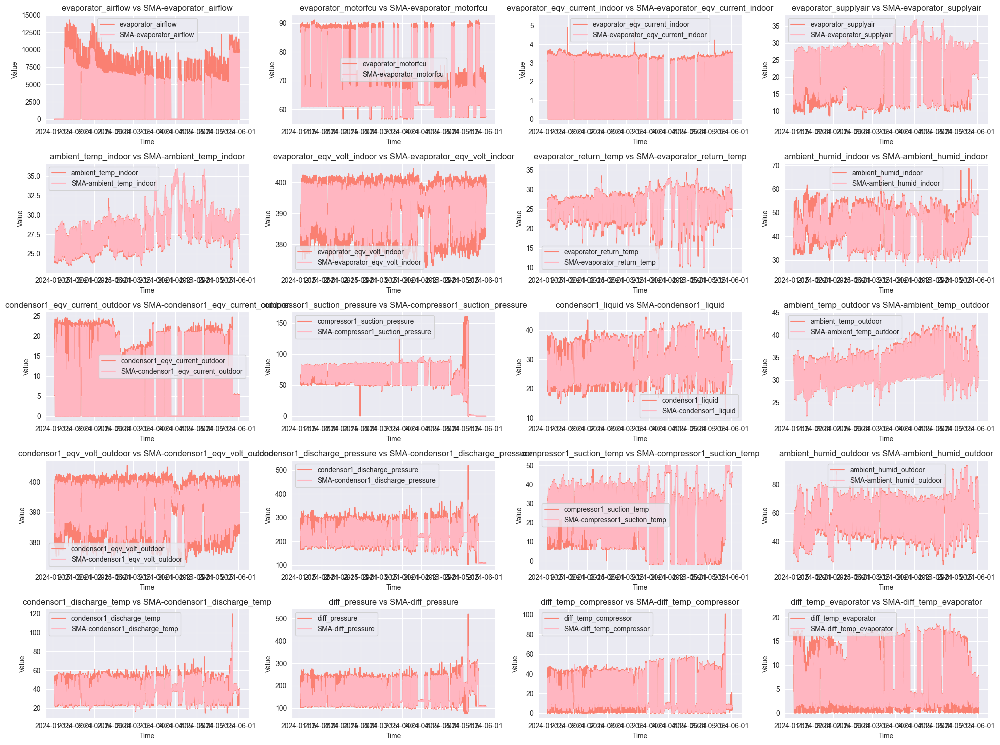

In [96]:
import matplotlib.pyplot as plt

# List of original sensor columns and their corresponding SMA columns
sensor_columns = [
    'evaporator_airflow', 'evaporator_motorfcu', 'evaporator_eqv_current_indoor', 'evaporator_supplyair',
    'ambient_temp_indoor', 'evaporator_eqv_volt_indoor', 'evaporator_return_temp', 'ambient_humid_indoor',
    'condensor1_eqv_current_outdoor', 'compressor1_suction_pressure', 'condensor1_liquid', 'ambient_temp_outdoor',
    'condensor1_eqv_volt_outdoor', 'condensor1_discharge_pressure', 'compressor1_suction_temp', 'ambient_humid_outdoor',
    'condensor1_discharge_temp', 'diff_pressure', 'diff_temp_compressor', 'diff_temp_evaporator'
]

sma_columns = [f'SMA-{col}' for col in sensor_columns]

# Set up the matplotlib figure with 4 columns and 5 rows
fig, axes = plt.subplots(5, 4, figsize=(20, 15))  # 5 rows, 4 columns

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each pair of normal sensor data and SMA data
for i, (sensor_col, sma_col) in enumerate(zip(sensor_columns, sma_columns)):
    if sensor_col in rolling_df.columns and sma_col in rolling_df.columns:
        axes[i].plot(rolling_df['time'], rolling_df[sensor_col], label=sensor_col, color='salmon')
        axes[i].plot(rolling_df['time'], rolling_df[sma_col], label=sma_col, color='lightpink')
        axes[i].set_title(f'{sensor_col} vs {sma_col}')
        axes[i].set_xlabel('Time')
        axes[i].set_ylabel('Value')
        axes[i].legend()

# Hide any extra subplots if there are less than 20 pairs
for j in range(len(sensor_columns), 20):
    fig.delaxes(axes[j])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


## Lag Features

1. Capturing Temporal Dependencies: Time series data often exhibit patterns over time. For example, the value of a variable today might depend on its value from the previous day or week. Lag features help capture these dependencies.

2. Improving Predictive Power: By including past values as features, the model can learn from historical data to make better predictions about future values.

3. Handling Autocorrelation: Many time series exhibit autocorrelation, where past values influence current values. Lag features help the model account for this autocorrelation.

4. Feature Enrichment: Adding lagged values can create a richer set of features for the model to learn from, potentially improving its performance.

In [97]:
def lag_features(df_input, 
                 df_target, 
                 features:list, 
                 lag:int, 
                 dropna:bool=False, 
                 method="ffill") :
    """
    Lag features help models learn from past data, 
    capturing temporal patterns and improving predictive performance. 
    """
    
    if method == "bfill" :
        for feat in features:
            df_target[f"Lag-{feat}"] = df_input[feat].shift(lag)
            df_target[f"Lag-{feat}"].bfill(inplace=True)
            
    elif method == "ffill" :
        for feat in features :
            df_target[f"Lag-{feat}"] = df_input[feat].shift(lag)
            df_target[f"Lag-{feat}"].ffill(inplace=True)
    else :
        print("method not defined correctly")
        return False
    
    # Drop rows with NaN values after shifting
    if dropna:
        df_target.dropna(inplace=True)
    
    return df_target

In [98]:
lag_df = rolling_df.copy()
lag_df = lag_features(df_input=rolling_df, 
                      df_target=lag_df, 
                      features=sma_columns, 
                      lag=1440,
                      dropna=True, 
                      method="ffill")
lag_df.keys()

Index(['time', 'evaporator_airflow', 'evaporator_motorfcu',
       'evaporator_eqv_current_indoor', 'evaporator_supplyair',
       'ambient_temp_indoor', 'evaporator_eqv_volt_indoor',
       'evaporator_return_temp', 'ambient_humid_indoor',
       'condensor1_eqv_current_outdoor', 'compressor1_suction_pressure',
       'condensor1_liquid', 'ambient_temp_outdoor',
       'condensor1_eqv_volt_outdoor', 'condensor1_discharge_pressure',
       'compressor1_suction_temp', 'ambient_humid_outdoor',
       'condensor1_discharge_temp', 'year', 'month', 'hour', 'day', 'day_name',
       'month_year', 'datetime-diff', 'is_business_hours', 'is_dayoff',
       'diff_pressure', 'diff_temp_compressor', 'diff_temp_evaporator',
       'SMA-evaporator_airflow', 'SMA-evaporator_motorfcu',
       'SMA-evaporator_eqv_current_indoor', 'SMA-evaporator_supplyair',
       'SMA-ambient_temp_indoor', 'SMA-evaporator_eqv_volt_indoor',
       'SMA-evaporator_return_temp', 'SMA-ambient_humid_indoor',
       'SMA-co

In [99]:
len(lag_df.columns)

70

In [100]:
lag_df.head()

,time,evaporator_airflow,evaporator_motorfcu,evaporator_eqv_current_indoor,evaporator_supplyair,ambient_temp_indoor,evaporator_eqv_volt_indoor,evaporator_return_temp,ambient_humid_indoor,condensor1_eqv_current_outdoor,...,Lag-SMA-condensor1_liquid,Lag-SMA-ambient_temp_outdoor,Lag-SMA-condensor1_eqv_volt_outdoor,Lag-SMA-condensor1_discharge_pressure,Lag-SMA-compressor1_suction_temp,Lag-SMA-ambient_humid_outdoor,Lag-SMA-condensor1_discharge_temp,Lag-SMA-diff_pressure,Lag-SMA-diff_temp_compressor,Lag-SMA-diff_temp_evaporator
1499,2024-01-17 14:17:30,5.1,87.5,3.22,15.5,24.1,383.69,27.3,39.2,5.18,...,27.936667,34.896667,385.807167,203.686833,24.315000,32.888333,36.048333,142.293667,15.080000,12.185000
1500,2024-01-17 14:18:30,5.2,88.6,3.22,15.6,24.1,383.62,27.3,39.4,5.17,...,27.931667,34.905000,385.758333,203.688833,24.326667,32.866667,36.013333,142.297000,15.126667,12.188333
1501,2024-01-17 14:19:30,5.2,88.3,3.21,15.7,24.1,383.07,27.3,39.7,5.15,...,27.946667,34.910000,385.620333,205.737500,24.226667,32.843333,36.073333,144.597000,15.230000,12.193333
1502,2024-01-17 14:20:30,5.0,87.1,3.22,15.8,24.1,383.54,27.5,39.9,5.16,...,28.041667,34.913333,385.517167,207.824333,23.998333,32.831667,36.346667,146.883000,15.661667,12.228333
1503,2024-01-17 14:21:30,5.2,87.7,3.21,15.9,24.2,382.43,27.5,40.0,5.14,...,28.193333,34.915000,385.392000,209.881500,23.713333,32.821667,36.708333,149.159000,16.225000,12.291667


<Axes: xlabel='time'>

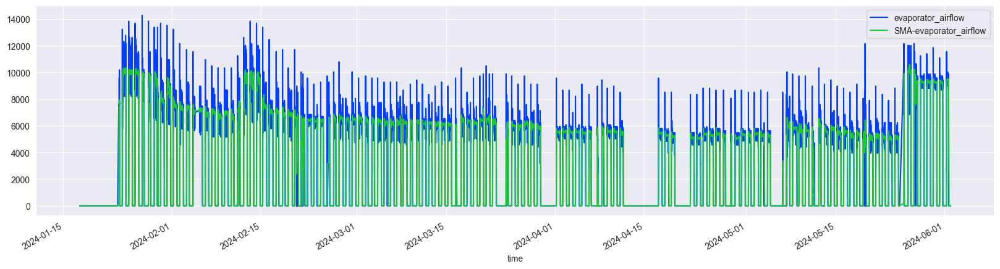

In [101]:
(lag_df.loc[:, ['time', 
                'evaporator_airflow',
                'SMA-evaporator_airflow',]]
    .set_index('time')
    .plot(figsize=(20,5)))

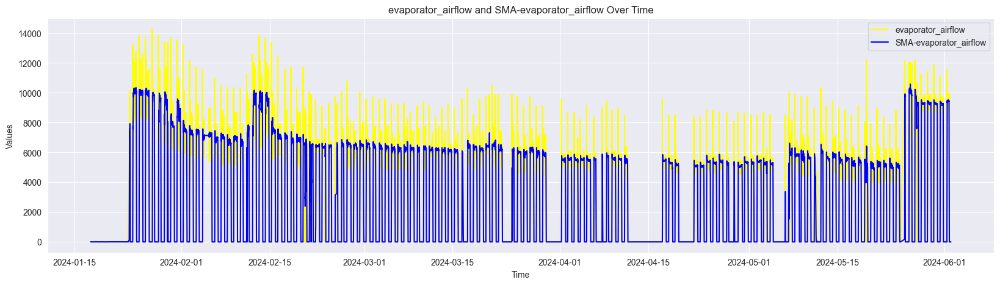

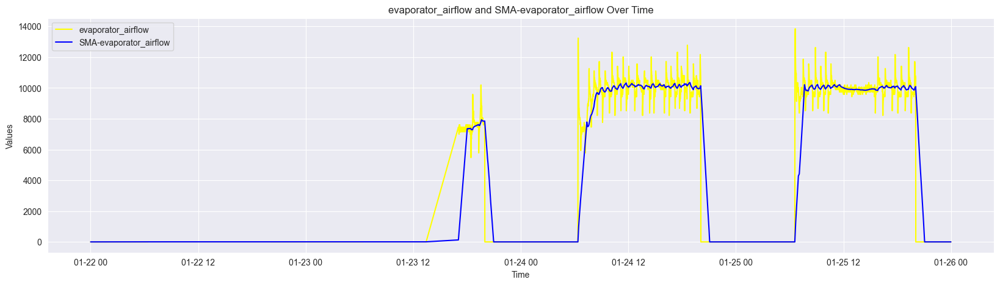

In [102]:
def plot_with_colors(df, 
                     color_normal_value='yellow', 
                     color_ma_value='blue', 
                     normal_value='evaporator_airflow', 
                     ma='SMA-evaporator_airflow', 
                     start_time=None, 
                     end_time=None):
    """
    Plots the normal and moving average values with specified colors within the given time range.
    
    Args:
    - df: DataFrame containing the data
    - color_normal_value: color for the normal value line
    - color_ma_value: color for the moving average line
    - normal_value: column name for the normal value
    - ma: column name for the moving average value
    - start_time: start time for the plot (inclusive)
    - end_time: end time for the plot (inclusive)
    
    Returns:
    - A plot with the specified settings
    """
    
    # Filter data within the time range
    if start_time is not None and end_time is not None:
        mask = (df['time'] >= start_time) & (df['time'] <= end_time)
        df_plot = df.loc[mask]
    else:
        df_plot = df
    
    # Plot the data
    plt.figure(figsize=(20, 5))
    
    # Plot normal values
    plt.plot(df_plot['time'], df_plot[normal_value], color=color_normal_value, label=normal_value)
    
    # Plot moving average values
    plt.plot(df_plot['time'], df_plot[ma], color=color_ma_value, label=ma)
    
    # Formatting the plot
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.title(f'{normal_value} and {ma} Over Time')
    plt.legend()
    plt.grid(True)
    plt.show()
    
plot_with_colors(lag_df)
plot_with_colors(lag_df, start_time="2024-01-22", end_time="2024-01-26")

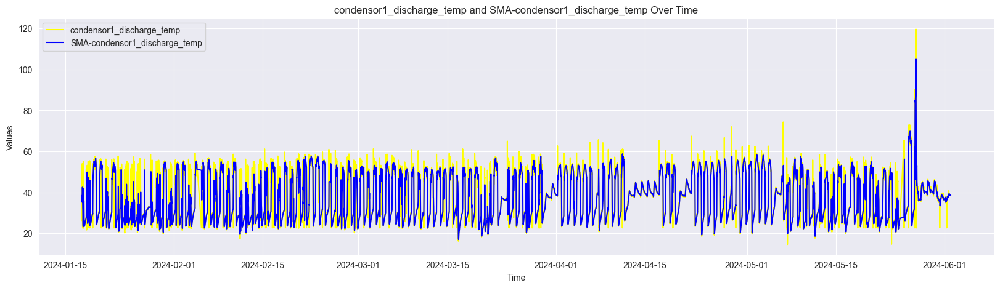

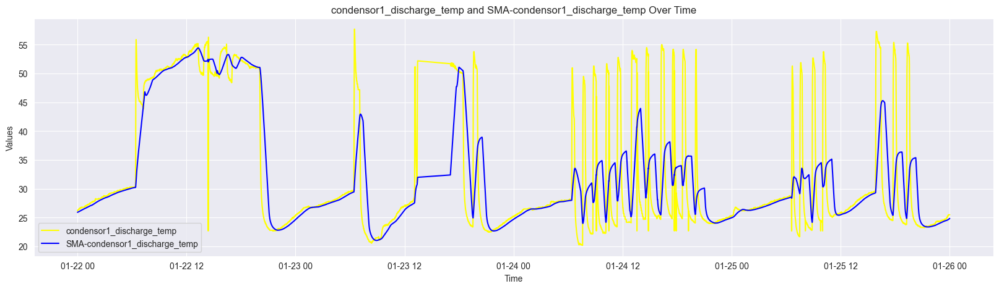

In [103]:
plot_with_colors(lag_df, normal_value="condensor1_discharge_temp", ma="SMA-condensor1_discharge_temp")
plot_with_colors(lag_df, normal_value="condensor1_discharge_temp", ma="SMA-condensor1_discharge_temp", start_time="2024-01-22", end_time="2024-01-26")

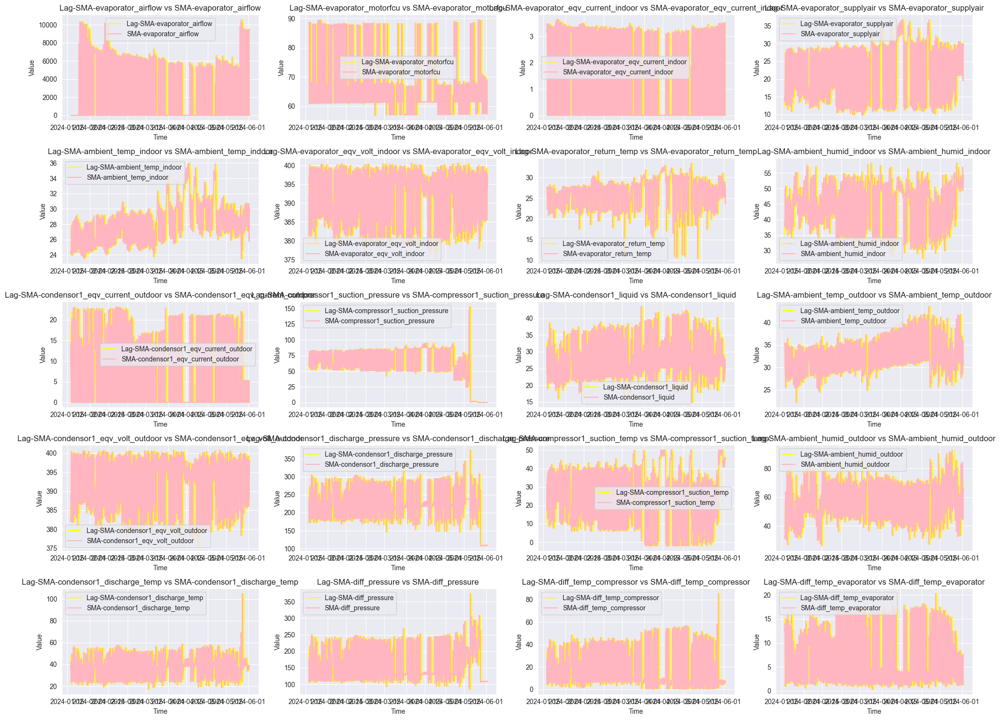

In [104]:
import matplotlib.pyplot as plt

# List of original sensor columns and their corresponding SMA and Lag-SMA columns
sensor_columns = [
    'evaporator_airflow', 'evaporator_motorfcu', 'evaporator_eqv_current_indoor', 'evaporator_supplyair',
    'ambient_temp_indoor', 'evaporator_eqv_volt_indoor', 'evaporator_return_temp', 'ambient_humid_indoor',
    'condensor1_eqv_current_outdoor', 'compressor1_suction_pressure', 'condensor1_liquid', 'ambient_temp_outdoor',
    'condensor1_eqv_volt_outdoor', 'condensor1_discharge_pressure', 'compressor1_suction_temp', 'ambient_humid_outdoor',
    'condensor1_discharge_temp', 'diff_pressure', 'diff_temp_compressor', 'diff_temp_evaporator'
]

sma_columns = [f'SMA-{col}' for col in sensor_columns]
lag_columns = [f'Lag-SMA-{col}' for col in sensor_columns]

# Set up the matplotlib figure with 4 columns and 5 rows
fig, axes = plt.subplots(5, 4, figsize=(20, 15))  # 5 rows, 4 columns

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each pair of Lag-SMA data and SMA data
for i, (lag_col, sma_col) in enumerate(zip(lag_columns, sma_columns)):
    if lag_col in lag_df.columns and sma_col in lag_df.columns:
        axes[i].plot(lag_df['time'], lag_df[lag_col], label=lag_col, color='yellow')
        axes[i].plot(lag_df['time'], lag_df[sma_col], label=sma_col, color='lightpink')
        axes[i].set_title(f'{lag_col} vs {sma_col}')
        axes[i].set_xlabel('Time')
        axes[i].set_ylabel('Value')
        axes[i].legend()

# Hide any extra subplots if there are less than 20 pairs
for j in range(len(sensor_columns), 20):
    fig.delaxes(axes[j])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


## Plotting Distribution

In [105]:
sma_columns = [col for col in lag_df.columns if col.startswith('SMA-')]
sma_columns, len(sma_columns)

(['SMA-evaporator_airflow',
  'SMA-evaporator_motorfcu',
  'SMA-evaporator_eqv_current_indoor',
  'SMA-evaporator_supplyair',
  'SMA-ambient_temp_indoor',
  'SMA-evaporator_eqv_volt_indoor',
  'SMA-evaporator_return_temp',
  'SMA-ambient_humid_indoor',
  'SMA-condensor1_eqv_current_outdoor',
  'SMA-compressor1_suction_pressure',
  'SMA-condensor1_liquid',
  'SMA-ambient_temp_outdoor',
  'SMA-condensor1_eqv_volt_outdoor',
  'SMA-condensor1_discharge_pressure',
  'SMA-compressor1_suction_temp',
  'SMA-ambient_humid_outdoor',
  'SMA-condensor1_discharge_temp',
  'SMA-diff_pressure',
  'SMA-diff_temp_compressor',
  'SMA-diff_temp_evaporator'],
 20)

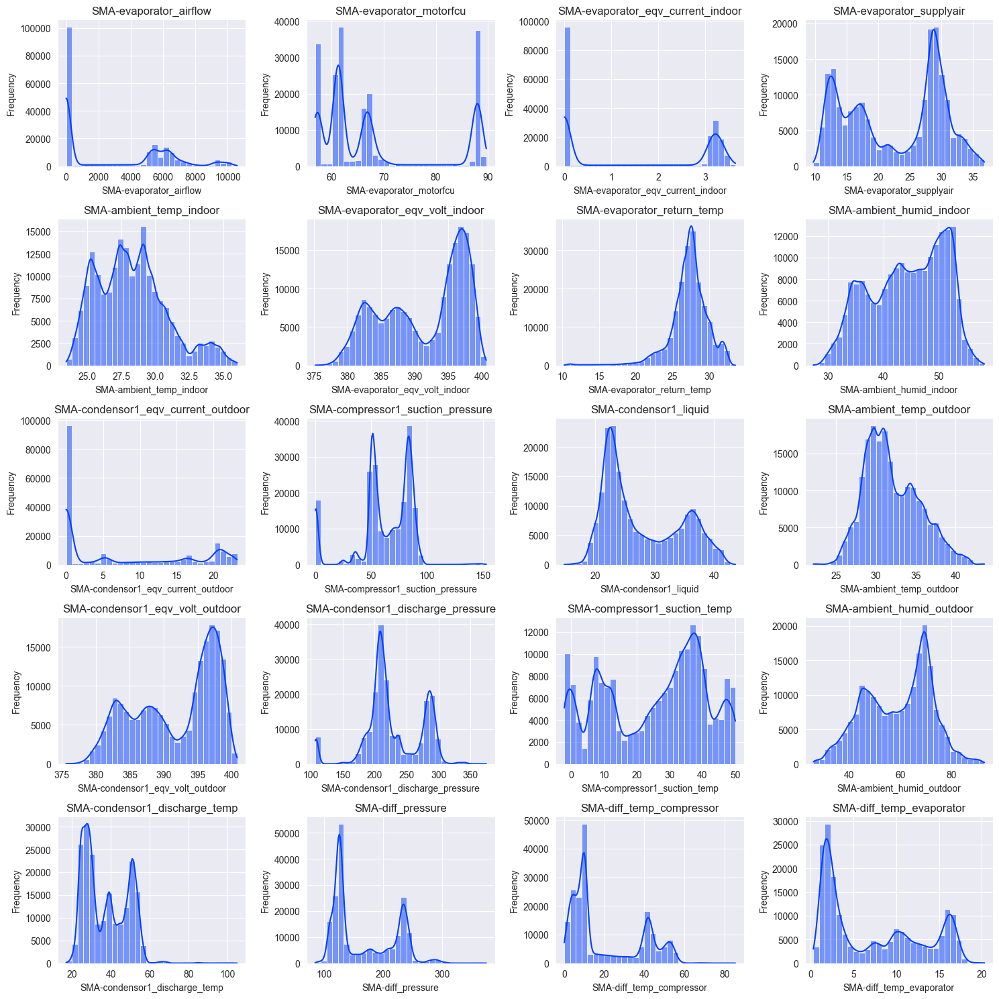

In [106]:
# Set up the matplotlib figure with 4 columns and 5 rows
fig, axes = plt.subplots(5, 4, figsize=(15, 15))  # 5 rows, 4 columns

# Flatten axes for easy iteration
axes = axes.flatten()

plt.title("Distribution plot with Moving Average Value from sensor")

# Plot each feature's distribution in a separate subplot
for i, column in enumerate(sma_columns):
    sns.histplot(lag_df[column], kde=True, ax=axes[i], bins=30)
    axes[i].set_title(f'{column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

# Hide any empty subplots if there are less than 20 features
for j in range(len(sma_columns), 20):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

## Log Transform Skewed Features

**Dealing with Skewness** :
- **Skewed Distributions** : In many real-world datasets, features can have highly skewed distributions, with values concentrated on one side and a long tail on the other. For example, income data tends to be right-skewed, with most values being lower but a few extremely high values stretching the tail.

- **Effect of Skewness** : Skewed data can negatively impact the performance of machine learning models, especially models that assume normally distributed data (like linear regression or certain clustering algorithms).

**Why np.log1p() -> log(1+x)**
- **Stabilizing Variance** : Applying the logarithm compresses large values more than smaller ones, reducing the skewness and bringing the distribution closer to normal.
Handling Zero and Negative Values: A direct logarithm (np.log(x)) cannot handle zero or negative values since the logarithm of zero is undefined and the logarithm of a negative number is complex. np.log1p(x) is useful because it applies log(1+x), allowing it to handle zero (since log(1)=0) and keeping small positive values positive after transformation.

- **Smoothing Distributions** : For right-skewed distributions (where the tail is on the right), np.log1p() reduces the impact of extreme values, making the distribution more symmetric and closer to normal, which often benefits model performance.

**When to Use np.log1p()** :
- **Highly Skewed Data** : If you detect significant right skewness (e.g., using the skewness metric or visualizing the distribution), applying np.log1p() can help.

- **Features with Wide Ranges** : Features where a few extreme values dominate the distribution are candidates for this transformation.

- **Feature Engineering** : It’s a standard step in preprocessing pipelines to transform skewed data for better model performance.

In [107]:
sk = lag_df.copy()

skewed_features = ['SMA-evaporator_return_temp']
sk[skewed_features] = np.log1p(sk[skewed_features] - np.min(sk[skewed_features], axis=0) + 1)

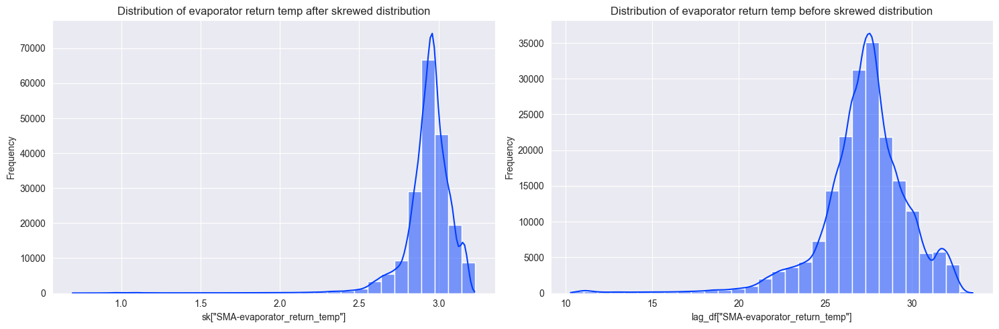

In [108]:
# Set up the matplotlib figure with 2 columns and 1 row
fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # 1 row, 2 columns

# Plot the distribution of sk["SMA-evaporator_return_temp"]
sns.histplot(sk["SMA-evaporator_return_temp"], kde=True, ax=axes[0], bins=30)
axes[0].set_title('Distribution of evaporator return temp after skrewed distribution')
axes[0].set_xlabel('sk["SMA-evaporator_return_temp"]')
axes[0].set_ylabel('Frequency')

# Plot the distribution of lag_df["SMA-evaporator_return_temp"]
sns.histplot(lag_df["SMA-evaporator_return_temp"], kde=True, ax=axes[1], bins=30)
axes[1].set_title('Distribution of evaporator return temp before skrewed distribution')
axes[1].set_xlabel('lag_df["SMA-evaporator_return_temp"]')
axes[1].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

In [109]:
lag_df[skewed_features] = np.log1p(lag_df[skewed_features] - np.min(lag_df[skewed_features], axis=0) + 1)

In [110]:
lag_df.columns

Index(['time', 'evaporator_airflow', 'evaporator_motorfcu',
       'evaporator_eqv_current_indoor', 'evaporator_supplyair',
       'ambient_temp_indoor', 'evaporator_eqv_volt_indoor',
       'evaporator_return_temp', 'ambient_humid_indoor',
       'condensor1_eqv_current_outdoor', 'compressor1_suction_pressure',
       'condensor1_liquid', 'ambient_temp_outdoor',
       'condensor1_eqv_volt_outdoor', 'condensor1_discharge_pressure',
       'compressor1_suction_temp', 'ambient_humid_outdoor',
       'condensor1_discharge_temp', 'year', 'month', 'hour', 'day', 'day_name',
       'month_year', 'datetime-diff', 'is_business_hours', 'is_dayoff',
       'diff_pressure', 'diff_temp_compressor', 'diff_temp_evaporator',
       'SMA-evaporator_airflow', 'SMA-evaporator_motorfcu',
       'SMA-evaporator_eqv_current_indoor', 'SMA-evaporator_supplyair',
       'SMA-ambient_temp_indoor', 'SMA-evaporator_eqv_volt_indoor',
       'SMA-evaporator_return_temp', 'SMA-ambient_humid_indoor',
       'SMA-co

In [123]:
lag_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 192006 entries, 1499 to 193504
Data columns (total 70 columns):
 #   Column                                  Non-Null Count   Dtype          
---  ------                                  --------------   -----          
 0   time                                    192006 non-null  datetime64[ns] 
 1   evaporator_airflow                      192006 non-null  float64        
 2   evaporator_motorfcu                     192006 non-null  float64        
 3   evaporator_eqv_current_indoor           192006 non-null  float64        
 4   evaporator_supplyair                    192006 non-null  float64        
 5   ambient_temp_indoor                     192006 non-null  float64        
 6   evaporator_eqv_volt_indoor              192006 non-null  float64        
 7   evaporator_return_temp                  192006 non-null  float64        
 8   ambient_humid_indoor                    192006 non-null  float64        
 9   condensor1_eqv_current_outdo

## Apply Guassian Mixture Models

### Splitting dataframe

Create function to split dataframe

In [111]:
# Use REGEX to be search sensor as a placeholder
import re

def split_dataframe(df, sensor_prefix):
    # Create new dataframe
    df_split = df.copy()
    
    # Create pattern to find the sensor name 
    pattern = rf"(^|SMA-|Lag-SMA-){re.escape(sensor_prefix)}"
    
    # Search feature 
    sensor_cols = [col for col in df_split.columns if re.search(pattern, col)]
    
    # Define time column
    time_cols = ['time', 'year', 'month', 'hour', 'day', 'day_name',
                 'month_year', 'datetime-diff', 'is_business_hours', 'is_dayoff',]
    
    # Merge columns
    merge_cols = time_cols + sensor_cols
    
    return df_split[merge_cols]

Store each dataframe in dictionary

In [112]:
sensor_prefixs = [
    'evaporator_airflow', 
    'evaporator_motorfcu',
    'evaporator_eqv_current_indoor', 
    'evaporator_supplyair',
    'ambient_temp_indoor', 
    'evaporator_eqv_volt_indoor',
    'evaporator_return_temp', 
    'ambient_humid_indoor',
    'condensor1_eqv_current_outdoor', 
    'compressor1_suction_pressure',
    'condensor1_liquid', 
    'ambient_temp_outdoor',
    'condensor1_eqv_volt_outdoor', 
    'condensor1_discharge_pressure',
    'compressor1_suction_temp', 
    'ambient_humid_outdoor',
    'condensor1_discharge_temp'
]
# split_dfs["condensor1_eqv_current_outdoor"].head()


# Create list to store dataframe
split_dfs = {}

# Create each df for sensor and store in a list
for prefix in sensor_prefixs :
    split_dfs[prefix] = split_dataframe(df=lag_df, sensor_prefix=prefix)

In [113]:
split_dfs

{'evaporator_airflow':                       time  year  month  hour  day   day_name month_year  \
 1499   2024-01-17 14:17:30  2024      1    14   17  Wednesday    2024-01   
 1500   2024-01-17 14:18:30  2024      1    14   17  Wednesday    2024-01   
 1501   2024-01-17 14:19:30  2024      1    14   17  Wednesday    2024-01   
 1502   2024-01-17 14:20:30  2024      1    14   17  Wednesday    2024-01   
 1503   2024-01-17 14:21:30  2024      1    14   17  Wednesday    2024-01   
 ...                    ...   ...    ...   ...  ...        ...        ...   
 193500 2024-06-01 23:55:30  2024      6    23    1   Saturday    2024-06   
 193501 2024-06-01 23:56:30  2024      6    23    1   Saturday    2024-06   
 193502 2024-06-01 23:57:30  2024      6    23    1   Saturday    2024-06   
 193503 2024-06-01 23:58:30  2024      6    23    1   Saturday    2024-06   
 193504 2024-06-01 23:59:30  2024      6    23    1   Saturday    2024-06   
 
          datetime-diff  is_business_hours  is_dayof

In [114]:
split_dfs["condensor1_eqv_current_outdoor"].head()

,time,year,month,hour,day,day_name,month_year,datetime-diff,is_business_hours,is_dayoff,condensor1_eqv_current_outdoor,SMA-condensor1_eqv_current_outdoor,Lag-SMA-condensor1_eqv_current_outdoor
1499,2024-01-17 14:17:30,2024,1,14,17,Wednesday,2024-01,0 days 00:01:00,1.0,0,5.18,10.600833,9.892833
1500,2024-01-17 14:18:30,2024,1,14,17,Wednesday,2024-01,0 days 00:01:00,1.0,0,5.17,10.316833,9.891333
1501,2024-01-17 14:19:30,2024,1,14,17,Wednesday,2024-01,0 days 00:01:00,1.0,0,5.15,10.032333,10.183333
1502,2024-01-17 14:20:30,2024,1,14,17,Wednesday,2024-01,0 days 00:01:00,1.0,0,5.16,10.030333,10.475333
1503,2024-01-17 14:21:30,2024,1,14,17,Wednesday,2024-01,0 days 00:01:00,1.0,0,5.14,10.028833,10.762167


### Apply GMM

In [129]:
from sklearn.mixture import GaussianMixture

def GaussianMixture_Cluster(df, feature):
    # Initialize and fit the GMM model
    gmm = GaussianMixture(n_components=2, random_state=42)
    gmm.fit(df[feature])
        
    # Add a new column with the GMM clustering result
    df[f"GMM-{feature}"] = gmm.predict(df[feature])
    print("---------------------- Success -----------------------")
    
    return df

In [130]:
for sensor_prefix, df in split_dfs.items():
    
    print(sensor_prefix)
    print(df)
    
    # Identify the SMA features for the current sensor
    sma_features = [col for col in df.columns if col.startswith('SMA-')]
    print(f"sma-feature ---------------------------------------->")
    print(sma_features)
    
    # Apply GMM to the dataframe directly
    split_dfs = GaussianMixture_Cluster(df, sma_features)

evaporator_airflow
                      time  year  month  hour  day   day_name month_year  \
1499   2024-01-17 14:17:30  2024      1    14   17  Wednesday    2024-01   
1500   2024-01-17 14:18:30  2024      1    14   17  Wednesday    2024-01   
1501   2024-01-17 14:19:30  2024      1    14   17  Wednesday    2024-01   
1502   2024-01-17 14:20:30  2024      1    14   17  Wednesday    2024-01   
1503   2024-01-17 14:21:30  2024      1    14   17  Wednesday    2024-01   
...                    ...   ...    ...   ...  ...        ...        ...   
193500 2024-06-01 23:55:30  2024      6    23    1   Saturday    2024-06   
193501 2024-06-01 23:56:30  2024      6    23    1   Saturday    2024-06   
193502 2024-06-01 23:57:30  2024      6    23    1   Saturday    2024-06   
193503 2024-06-01 23:58:30  2024      6    23    1   Saturday    2024-06   
193504 2024-06-01 23:59:30  2024      6    23    1   Saturday    2024-06   

         datetime-diff  is_business_hours  is_dayoff  evaporator_air

In [131]:
split_dfs["condensor1_eqv_current_outdoor"].head()

KeyError: 'condensor1_eqv_current_outdoor'

In [ ]:
# Verify updated split_dfs
for sensor_prefix, df in split_dfs.items():
    print(f"Updated DataFrame for {sensor_prefix}")
    print(df.head()) 

In [ ]:
for sensor_prefix, df in split_dfs.items():
    # Identify the GMM features for the current sensor
    gmm_features = [col for col in df.columns if col.startswith('GMM-')]
    
    # Keep only rows where any of the GMM features equals 1
    for gmm_feature in gmm_features:
        split_dfs[sensor_prefix] = df[df[gmm_feature] == 1]

### Inner Join

## Guassian Mixture Models (Clustering to Mode Off and Mode On by Distribution)

Split dataframe to time,feature -> Then apply GMM -> Group by On state -> Inner Join 

In [123]:
from sklearn.mixture import GaussianMixture

def apply_GMM(df, features_list):
    # Copy df
    gmm_df = df.copy()
    
    # Iterate over df
    for feature in features_list:
        # Extract column from df
        X = gmm_df[[feature]]
        # Initialize GMM clustering model
        gmm = GaussianMixture(n_components=2, random_state=42)
        gmm.fit(X)
        gmm_df[f"GMM-{feature}"] = gmm.predict(X)
        
    return gmm_df

In [100]:
gmm_df = apply_GMM(df=lag_df, features_list=sma_columns)

In [101]:
gmm_df

,time,evaporator_airflow,evaporator_motorfcu,evaporator_eqv_current_indoor,evaporator_supplyair,ambient_temp_indoor,evaporator_eqv_volt_indoor,evaporator_return_temp,ambient_humid_indoor,condensor1_eqv_current_outdoor,...,GMM-SMA-condensor1_liquid,GMM-SMA-ambient_temp_outdoor,GMM-SMA-condensor1_eqv_volt_outdoor,GMM-SMA-condensor1_discharge_pressure,GMM-SMA-compressor1_suction_temp,GMM-SMA-ambient_humid_outdoor,GMM-SMA-condensor1_discharge_temp,GMM-SMA-diff_pressure,GMM-SMA-diff_temp_compressor,GMM-SMA-diff_temp_evaporator
1499,2024-01-17 14:17:30,5.1,87.5,3.22,15.5,24.1,383.69,27.3,39.2,5.18,...,1,1,1,0,0,1,1,1,1,1
1500,2024-01-17 14:18:30,5.2,88.6,3.22,15.6,24.1,383.62,27.3,39.4,5.17,...,1,1,1,0,0,1,1,1,1,1
1501,2024-01-17 14:19:30,5.2,88.3,3.21,15.7,24.1,383.07,27.3,39.7,5.15,...,1,1,1,0,0,1,1,0,0,1
1502,2024-01-17 14:20:30,5.0,87.1,3.22,15.8,24.1,383.54,27.5,39.9,5.16,...,1,1,1,0,0,1,1,0,0,1
1503,2024-01-17 14:21:30,5.2,87.7,3.21,15.9,24.2,382.43,27.5,40.0,5.14,...,1,1,1,0,0,1,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193500,2024-06-01 23:55:30,0.0,57.5,0.00,30.0,30.1,396.35,27.8,54.6,0.00,...,0,0,0,0,0,0,1,0,0,0
193501,2024-06-01 23:56:30,0.0,57.5,0.00,30.0,30.1,396.54,27.8,54.6,0.00,...,0,0,0,0,0,0,1,0,0,0
193502,2024-06-01 23:57:30,0.0,57.5,0.00,30.0,30.2,397.84,27.8,54.7,0.00,...,0,0,0,0,0,0,1,0,0,0
193503,2024-06-01 23:58:30,0.0,57.5,0.00,30.0,30.1,398.09,27.8,54.7,0.00,...,0,0,0,0,0,0,1,0,0,0


In [102]:
gmm_df.columns

Index(['time', 'evaporator_airflow', 'evaporator_motorfcu',
       'evaporator_eqv_current_indoor', 'evaporator_supplyair',
       'ambient_temp_indoor', 'evaporator_eqv_volt_indoor',
       'evaporator_return_temp', 'ambient_humid_indoor',
       'condensor1_eqv_current_outdoor', 'compressor1_suction_pressure',
       'condensor1_liquid', 'ambient_temp_outdoor',
       'condensor1_eqv_volt_outdoor', 'condensor1_discharge_pressure',
       'compressor1_suction_temp', 'ambient_humid_outdoor',
       'condensor1_discharge_temp', 'year', 'month', 'hour', 'day', 'day_name',
       'month_year', 'datetime-diff', 'is_business_hours', 'is_dayoff',
       'diff_pressure', 'diff_temp_compressor', 'diff_temp_evaporator',
       'SMA-evaporator_airflow', 'SMA-evaporator_motorfcu',
       'SMA-evaporator_eqv_current_indoor', 'SMA-evaporator_supplyair',
       'SMA-ambient_temp_indoor', 'SMA-evaporator_eqv_volt_indoor',
       'SMA-evaporator_return_temp', 'SMA-ambient_humid_indoor',
       'SMA-co

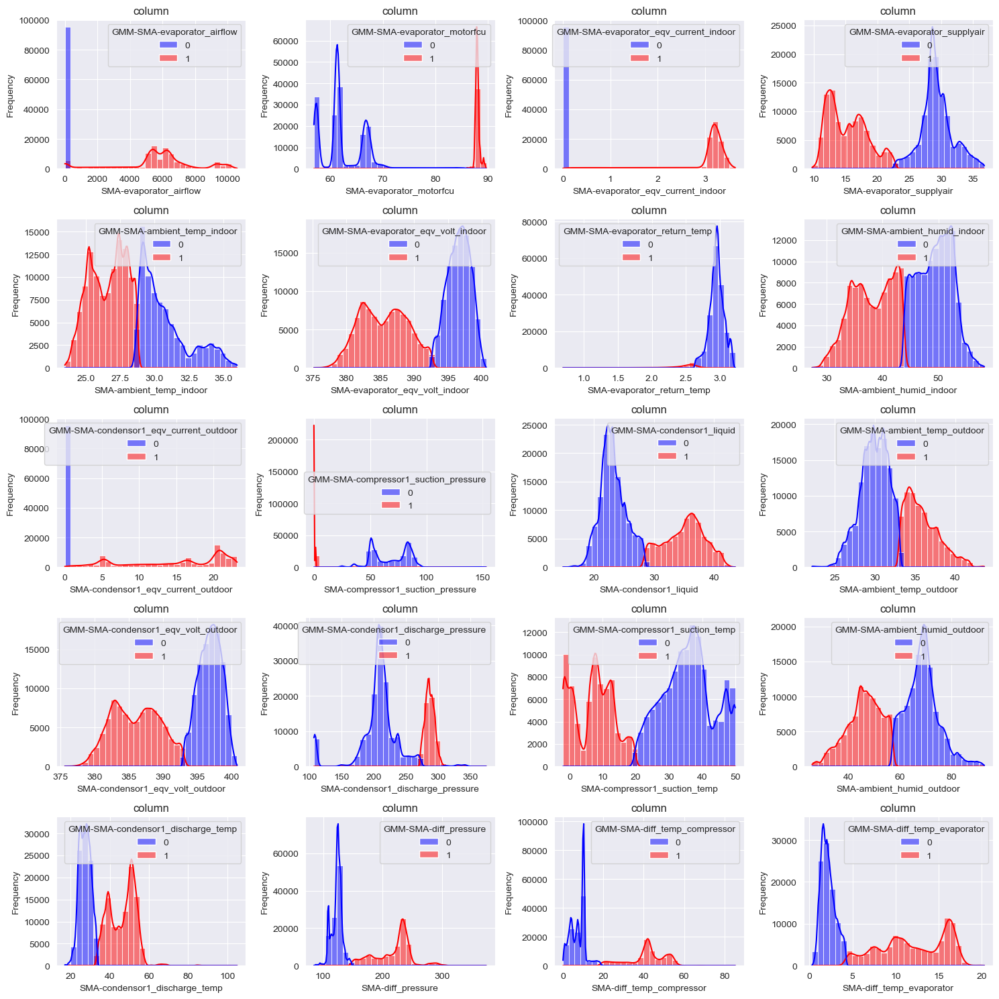

In [103]:
# Set up the matplotlib figure with 4 columns and 5 rows
fig, axes = plt.subplots(5, 4, figsize=(15, 15))  # 5 rows, 4 columns

# Flatten axes for easy iteration
axes = axes.flatten()
plt.title("Clusteing GMM by Distribution")

for i, column in enumerate(sma_columns):
    sns.histplot(
        data=gmm_df, 
        x=column, 
        hue=f"GMM-{column}", 
        palette={0: 'blue', 1: 'red'}, 
        ax=axes[i], 
        kde=True,
        bins=30
    )
    axes[i].set_title(f'column')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

# Hide any empty subplots if there are less than 20 features
for j in range(len(sma_columns), 20):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

### Classify the mode from GMM result

Visual Operation range from business hour and non business hour to all sensor, Plot time series on random normal working day to visualize which value are on ON and OFF mode

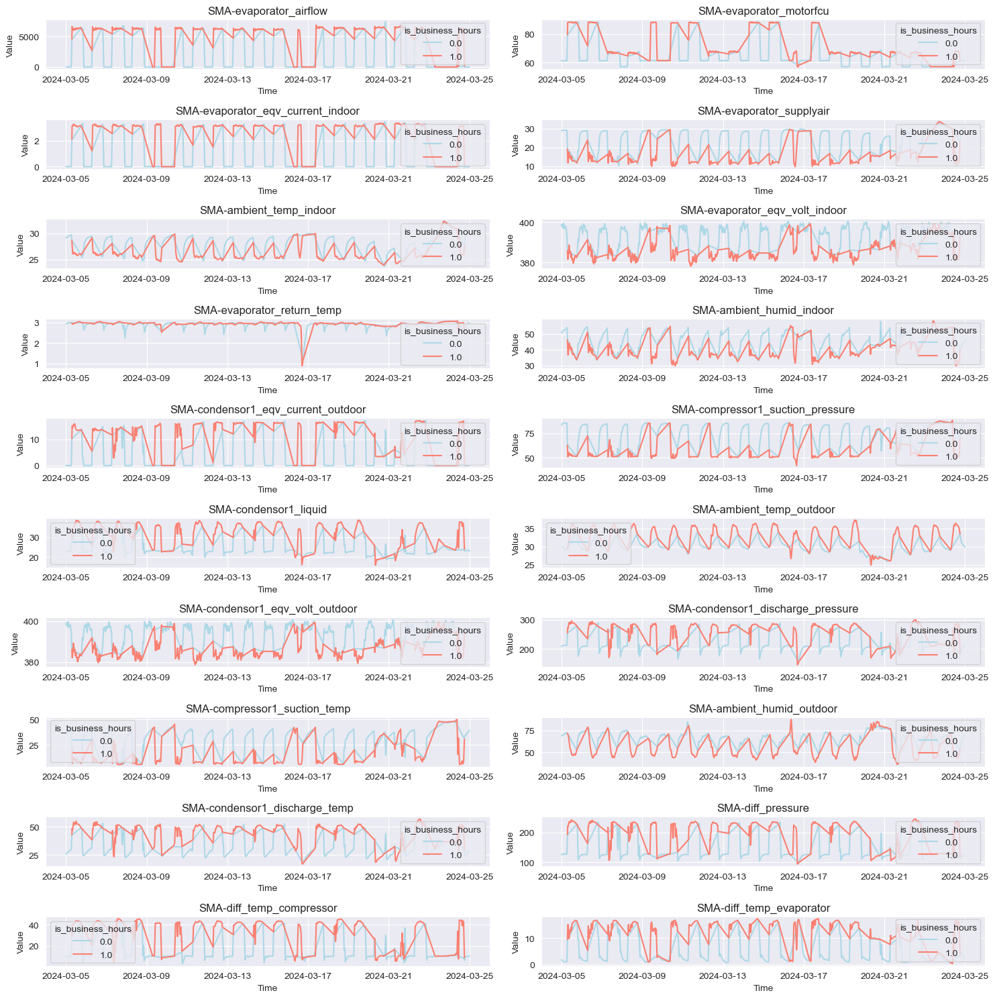

In [104]:
# Define the date range
start_date = pd.to_datetime('2024-03-05')
end_date = pd.to_datetime('2024-03-25')

# Filter the dataframe based on the date range
filtered_df = gmm_df[(gmm_df['time'] >= start_date) & (gmm_df['time'] <= end_date)]

# Select columns that start with "SMA-"
sma_columns = [col for col in gmm_df.columns if col.startswith("SMA-")]

# Limit the number of columns to the first 20 (for a 5x4 grid)
sma_columns = sma_columns[:20]

# Create the 5x4 grid of subplots
fig, axes = plt.subplots(nrows=10, ncols=2, figsize=(15, 15))
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Plot each SMA column in its respective subplot
for i, sma_col in enumerate(sma_columns):
    sns.lineplot(
        data=filtered_df,
        x='time',
        y=sma_col,
        hue='is_business_hours',
        palette={0: 'lightblue', 1: 'salmon'},
        ax=axes[i]
    )
    axes[i].set_title(sma_col)
    axes[i].set_xlabel("Time")
    axes[i].set_ylabel("Value")

# Remove any empty subplots (in case there are less than 20 SMA columns)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

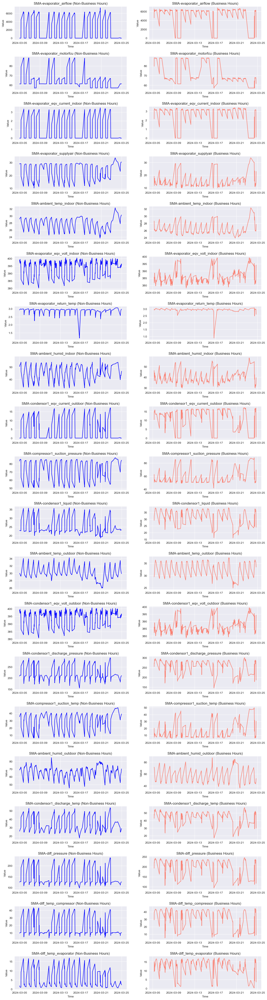

In [105]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define the date range
start_date = pd.to_datetime('2024-03-05')
end_date = pd.to_datetime('2024-03-25')

# Filter the dataframe based on the date range
filtered_df = gmm_df[(gmm_df['time'] >= start_date) & (gmm_df['time'] <= end_date)]

# Select columns that start with "SMA-"
sma_columns = [col for col in gmm_df.columns if col.startswith("SMA-")]

# Limit the number of columns to the first 20 (for a 10x2 grid)
sma_columns = sma_columns[:20]

# Create the 10x2 grid of subplots (left column for non-business hours, right for business hours)
fig, axes = plt.subplots(nrows=20, ncols=2, figsize=(15, 60))
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Plot each SMA column in the left and right subplots
for i, sma_col in enumerate(sma_columns):
    # Plot for is_business_hours == 0 (left)
    sns.lineplot(
        data=filtered_df[filtered_df['is_business_hours'] == 0],
        x='time',
        y=sma_col,
        color='blue',
        ax=axes[i*2]  # Left subplot
    )
    axes[i*2].set_title(f'{sma_col} (Non-Business Hours)')
    axes[i*2].set_xlabel("Time")
    axes[i*2].set_ylabel("Value")

    # Plot for is_business_hours == 1 (right)
    sns.lineplot(
        data=filtered_df[filtered_df['is_business_hours'] == 1],
        x='time',
        y=sma_col,
        color='salmon',
        ax=axes[i*2 + 1]  # Right subplot
    )
    axes[i*2 + 1].set_title(f'{sma_col} (Business Hours)')
    axes[i*2 + 1].set_xlabel("Time")
    axes[i*2 + 1].set_ylabel("Value")

# Remove any empty subplots (in case there are less than 20 SMA columns)
for j in range(len(sma_columns) * 2, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout and show the plot
plt.subplots_adjust(hspace=0.5) 
plt.show()


Consumption from plotting
- 'SMA-evaporator_airflow' - normal
- 'SMA-evaporator_motorfcu' - normal
- 'SMA-evaporator_eqv_current_indoor' - normal
**- 'SMA-evaporator_supplyair'- inverse**
**- 'SMA-ambient_temp_indoor' - inverse**
**- 'SMA-evaporator_eqv_volt_indoor' - inverse**
- 'SMA-evaporator_return_temp' - 
- 'SMA-ambient_humid_indoor'
- 'SMA-condensor1_eqv_current_outdoor'
- 'SMA-compressor1_suction_pressure' 
- 'SMA-condensor1_liquid'
- 'SMA-ambient_temp_outdoor'
- 'SMA-condensor1_eqv_volt_outdoor'
- 'SMA-condensor1_discharge_pressure 
- 'SMA-compressor1_suction_temp'
- 'SMA-ambient_humid_outdoor'
- 'SMA-condensor1_discharge_temp'
- 'SMA-diff_pressure', 'SMA-diff_temp_compressor'
- 'SMA-diff_temp_evaporator'

### Filter Sensor based on GMM cluster

In [106]:
gmm_df.columns.tolist()

['time',
 'evaporator_airflow',
 'evaporator_motorfcu',
 'evaporator_eqv_current_indoor',
 'evaporator_supplyair',
 'ambient_temp_indoor',
 'evaporator_eqv_volt_indoor',
 'evaporator_return_temp',
 'ambient_humid_indoor',
 'condensor1_eqv_current_outdoor',
 'compressor1_suction_pressure',
 'condensor1_liquid',
 'ambient_temp_outdoor',
 'condensor1_eqv_volt_outdoor',
 'condensor1_discharge_pressure',
 'compressor1_suction_temp',
 'ambient_humid_outdoor',
 'condensor1_discharge_temp',
 'year',
 'month',
 'hour',
 'day',
 'day_name',
 'month_year',
 'datetime-diff',
 'is_business_hours',
 'is_dayoff',
 'diff_pressure',
 'diff_temp_compressor',
 'diff_temp_evaporator',
 'SMA-evaporator_airflow',
 'SMA-evaporator_motorfcu',
 'SMA-evaporator_eqv_current_indoor',
 'SMA-evaporator_supplyair',
 'SMA-ambient_temp_indoor',
 'SMA-evaporator_eqv_volt_indoor',
 'SMA-evaporator_return_temp',
 'SMA-ambient_humid_indoor',
 'SMA-condensor1_eqv_current_outdoor',
 'SMA-compressor1_suction_pressure',
 'SMA

In [107]:
# Condition to drop rows where all GMM_sensor columns are 0
gmm_columns = [col for col in gmm_df.columns if col.startswith('GMM-')]
ft_df = gmm_df.loc[~(gmm_df[gmm_columns] == 0).all(axis=1)]
ft_df.head(10)

,time,evaporator_airflow,evaporator_motorfcu,evaporator_eqv_current_indoor,evaporator_supplyair,ambient_temp_indoor,evaporator_eqv_volt_indoor,evaporator_return_temp,ambient_humid_indoor,condensor1_eqv_current_outdoor,...,GMM-SMA-condensor1_liquid,GMM-SMA-ambient_temp_outdoor,GMM-SMA-condensor1_eqv_volt_outdoor,GMM-SMA-condensor1_discharge_pressure,GMM-SMA-compressor1_suction_temp,GMM-SMA-ambient_humid_outdoor,GMM-SMA-condensor1_discharge_temp,GMM-SMA-diff_pressure,GMM-SMA-diff_temp_compressor,GMM-SMA-diff_temp_evaporator
1499,2024-01-17 14:17:30,5.1,87.5,3.22,15.5,24.1,383.69,27.3,39.2,5.18,...,1,1,1,0,0,1,1,1,1,1
1500,2024-01-17 14:18:30,5.2,88.6,3.22,15.6,24.1,383.62,27.3,39.4,5.17,...,1,1,1,0,0,1,1,1,1,1
1501,2024-01-17 14:19:30,5.2,88.3,3.21,15.7,24.1,383.07,27.3,39.7,5.15,...,1,1,1,0,0,1,1,0,0,1
1502,2024-01-17 14:20:30,5.0,87.1,3.22,15.8,24.1,383.54,27.5,39.9,5.16,...,1,1,1,0,0,1,1,0,0,1
1503,2024-01-17 14:21:30,5.2,87.7,3.21,15.9,24.2,382.43,27.5,40.0,5.14,...,1,1,1,0,0,1,1,0,0,1
1504,2024-01-17 14:22:30,5.2,88.2,3.21,16.0,24.2,382.43,27.5,40.1,5.15,...,1,1,1,0,0,1,1,0,0,1
1505,2024-01-17 14:23:30,5.2,88.3,3.21,16.0,24.2,382.31,27.5,40.3,5.15,...,1,1,1,0,0,1,1,0,0,1
1506,2024-01-17 14:24:30,5.1,88.0,3.20,16.1,24.3,381.49,27.5,40.4,5.13,...,1,1,1,0,0,1,1,0,0,1
1507,2024-01-17 14:25:30,5.3,88.3,3.23,16.2,24.3,383.09,27.6,40.5,5.17,...,1,1,1,0,0,1,1,0,0,1
1508,2024-01-17 14:26:30,5.2,87.9,3.25,16.3,24.3,384.43,27.6,40.6,5.22,...,1,1,1,0,0,1,1,0,0,1


In [108]:
gmm_df.shape, ft_df.shape

((192006, 90), (159442, 90))

# Preprocessing Features

year : normal standardization

month : cyclic relationship

hour : cyclic relationship

day : cyclic relationship

day_name : Label Encoding (Onehot encoding may make data more bigger)

month_year : may be drop

datetime-diff : convert to nemeric

In [109]:
ft_df = ft_df.drop(columns=["month_year"])

In [110]:
ft_df["datetime-diff"].dtype

dtype('<m8[ns]')

In [111]:
ft_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 159442 entries, 1499 to 193504
Data columns (total 89 columns):
 #   Column                                  Non-Null Count   Dtype          
---  ------                                  --------------   -----          
 0   time                                    159442 non-null  datetime64[ns] 
 1   evaporator_airflow                      159442 non-null  float64        
 2   evaporator_motorfcu                     159442 non-null  float64        
 3   evaporator_eqv_current_indoor           159442 non-null  float64        
 4   evaporator_supplyair                    159442 non-null  float64        
 5   ambient_temp_indoor                     159442 non-null  float64        
 6   evaporator_eqv_volt_indoor              159442 non-null  float64        
 7   evaporator_return_temp                  159442 non-null  float64        
 8   ambient_humid_indoor                    159442 non-null  float64        
 9   condensor1_eqv_current_outdo

In [112]:
def datetime_diff_minute(input_df):
    df = input_df.copy()
    
    # Convert 'datetime-diff' to timedelta
    df['datetime-diff'] = pd.to_timedelta(df['datetime-diff'])
    
    # Convert timedelta to total minutes
    df['datetime-diff-minutes'] = df['datetime-diff'].dt.total_seconds() / 60
    
    # Convert minutes to 1 if the difference is exactly 1 minute
    # or you can keep the minutes directly if needed
    df['datetime-diff-minutes'] = df['datetime-diff-minutes'].apply(lambda x: 1 if x == 1 else x)
    
    # Drop the original 'datetime-diff' column if no longer needed
    df = df.drop(columns=['datetime-diff'])
    
    return df

ft_df = datetime_diff_minute(ft_df)



## Cyclic Relationship

In [113]:
from calendar import monthrange
from datetime import datetime

# Helper function to get number of days in a month
def get_days_in_month(year, month):
    return monthrange(year, month)[1]
    
def cyclic_feature(input_df):
    
    df = input_df.copy()

    # Create columns for cyclical encoding
    df['month_sin'] = np.sin(df['month'] * (2. * np.pi / 12))
    df['month_cos'] = np.cos(df['month'] * (2. * np.pi / 12))

    # Apply day encoding with correct day count for each month
    df['day_sin'] = df.apply(lambda row: np.sin(row['day'] * (2. * np.pi / get_days_in_month(row['year'], row['month']))), axis=1)
    df['day_cos'] = df.apply(lambda row: np.cos(row['day'] * (2. * np.pi / get_days_in_month(row['year'], row['month']))), axis=1)

    # Apply hour encoding
    df['hour_sin'] = np.sin(df['hour'] * (2. * np.pi / 24))
    df['hour_cos'] = np.cos(df['hour'] * (2. * np.pi / 24))
    
    return df


cc_df = cyclic_feature(ft_df)
cc_df.head()

,time,evaporator_airflow,evaporator_motorfcu,evaporator_eqv_current_indoor,evaporator_supplyair,ambient_temp_indoor,evaporator_eqv_volt_indoor,evaporator_return_temp,ambient_humid_indoor,condensor1_eqv_current_outdoor,...,GMM-SMA-diff_pressure,GMM-SMA-diff_temp_compressor,GMM-SMA-diff_temp_evaporator,datetime-diff-minutes,month_sin,month_cos,day_sin,day_cos,hour_sin,hour_cos
1499,2024-01-17 14:17:30,5.1,87.5,3.22,15.5,24.1,383.69,27.3,39.2,5.18,...,1,1,1,1,0.5,0.866025,-0.299363,-0.954139,-0.5,-0.866025
1500,2024-01-17 14:18:30,5.2,88.6,3.22,15.6,24.1,383.62,27.3,39.4,5.17,...,1,1,1,1,0.5,0.866025,-0.299363,-0.954139,-0.5,-0.866025
1501,2024-01-17 14:19:30,5.2,88.3,3.21,15.7,24.1,383.07,27.3,39.7,5.15,...,0,0,1,1,0.5,0.866025,-0.299363,-0.954139,-0.5,-0.866025
1502,2024-01-17 14:20:30,5.0,87.1,3.22,15.8,24.1,383.54,27.5,39.9,5.16,...,0,0,1,1,0.5,0.866025,-0.299363,-0.954139,-0.5,-0.866025
1503,2024-01-17 14:21:30,5.2,87.7,3.21,15.9,24.2,382.43,27.5,40.0,5.14,...,0,0,1,1,0.5,0.866025,-0.299363,-0.954139,-0.5,-0.866025


## Label Enconding

In [114]:
from sklearn.preprocessing import LabelEncoder

def EncoderCategorical(input_df):
  label_encoder = LabelEncoder()

  df = input_df.copy()
  df["day_name"] = label_encoder.fit_transform(df['day_name'])

  return df

enc_df = EncoderCategorical(cc_df)
enc_df["day_name"]

1499      6
1500      6
1501      6
1502      6
1503      6
         ..
193500    2
193501    2
193502    2
193503    2
193504    2
Name: day_name, Length: 159442, dtype: int32

In [115]:
enc_df.head()

,time,evaporator_airflow,evaporator_motorfcu,evaporator_eqv_current_indoor,evaporator_supplyair,ambient_temp_indoor,evaporator_eqv_volt_indoor,evaporator_return_temp,ambient_humid_indoor,condensor1_eqv_current_outdoor,...,GMM-SMA-diff_pressure,GMM-SMA-diff_temp_compressor,GMM-SMA-diff_temp_evaporator,datetime-diff-minutes,month_sin,month_cos,day_sin,day_cos,hour_sin,hour_cos
1499,2024-01-17 14:17:30,5.1,87.5,3.22,15.5,24.1,383.69,27.3,39.2,5.18,...,1,1,1,1,0.5,0.866025,-0.299363,-0.954139,-0.5,-0.866025
1500,2024-01-17 14:18:30,5.2,88.6,3.22,15.6,24.1,383.62,27.3,39.4,5.17,...,1,1,1,1,0.5,0.866025,-0.299363,-0.954139,-0.5,-0.866025
1501,2024-01-17 14:19:30,5.2,88.3,3.21,15.7,24.1,383.07,27.3,39.7,5.15,...,0,0,1,1,0.5,0.866025,-0.299363,-0.954139,-0.5,-0.866025
1502,2024-01-17 14:20:30,5.0,87.1,3.22,15.8,24.1,383.54,27.5,39.9,5.16,...,0,0,1,1,0.5,0.866025,-0.299363,-0.954139,-0.5,-0.866025
1503,2024-01-17 14:21:30,5.2,87.7,3.21,15.9,24.2,382.43,27.5,40.0,5.14,...,0,0,1,1,0.5,0.866025,-0.299363,-0.954139,-0.5,-0.866025


## Standardization Scaling all feature

In [116]:
from sklearn.preprocessing import StandardScaler

exclude_column = ['time']

def standardization_dataframe(df, exclude_columns:list):
    
    # Copy dataframe to new df
    sc_df = df.copy()
    
    # Identify columns to standardize
    numeric_columns = df.columns.difference(exclude_columns)
    print(f"numeric columns : \n{numeric_columns}")

    # Initialize StandardScaler
    scaler = StandardScaler()

    # Standardize the numeric columns
    sc_df[numeric_columns] = scaler.fit_transform(df[numeric_columns])

    # Check the standardized DataFrame
    print(df.head())
    
    return sc_df
    
    
sc_df = standardization_dataframe(df=enc_df, exclude_columns=exclude_column)

numeric columns : 
Index(['GMM-SMA-ambient_humid_indoor', 'GMM-SMA-ambient_humid_outdoor',
       'GMM-SMA-ambient_temp_indoor', 'GMM-SMA-ambient_temp_outdoor',
       'GMM-SMA-compressor1_suction_pressure',
       'GMM-SMA-compressor1_suction_temp',
       'GMM-SMA-condensor1_discharge_pressure',
       'GMM-SMA-condensor1_discharge_temp',
       'GMM-SMA-condensor1_eqv_current_outdoor',
       'GMM-SMA-condensor1_eqv_volt_outdoor', 'GMM-SMA-condensor1_liquid',
       'GMM-SMA-diff_pressure', 'GMM-SMA-diff_temp_compressor',
       'GMM-SMA-diff_temp_evaporator', 'GMM-SMA-evaporator_airflow',
       'GMM-SMA-evaporator_eqv_current_indoor',
       'GMM-SMA-evaporator_eqv_volt_indoor', 'GMM-SMA-evaporator_motorfcu',
       'GMM-SMA-evaporator_return_temp', 'GMM-SMA-evaporator_supplyair',
       'Lag-SMA-ambient_humid_indoor', 'Lag-SMA-ambient_humid_outdoor',
       'Lag-SMA-ambient_temp_indoor', 'Lag-SMA-ambient_temp_outdoor',
       'Lag-SMA-compressor1_suction_pressure',
       'Lag-SM

# Feature Selection

## Visualize error range

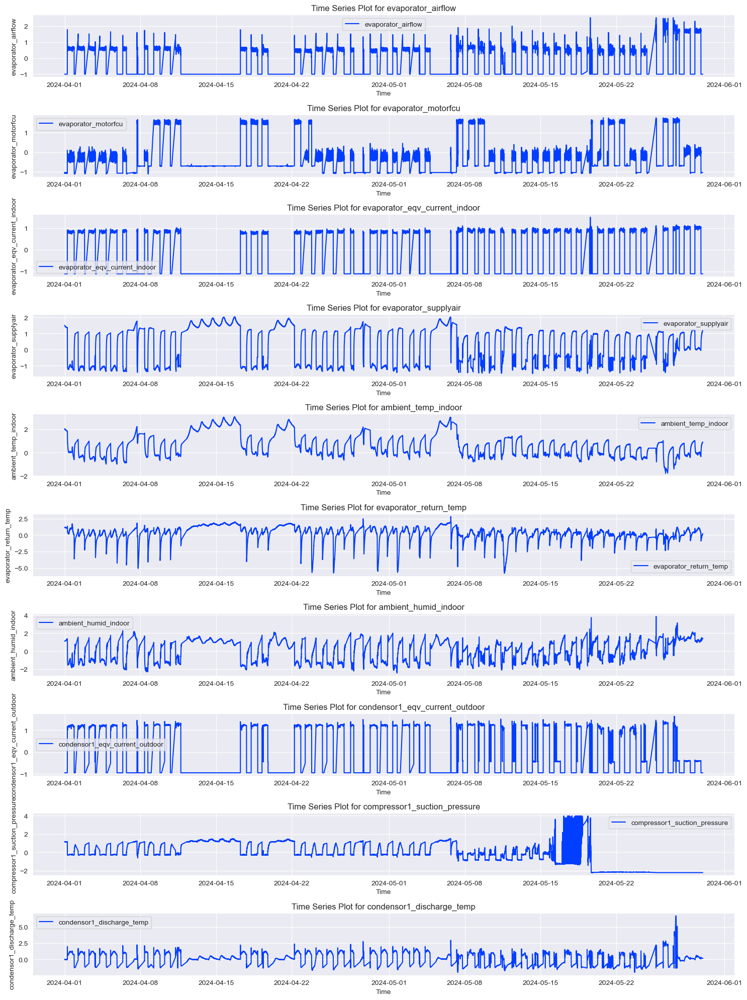

In [117]:
def visual_error_range(df, start_date='2024-04-01', end_date='2024-05-30') :
    # Assuming df is your DataFrame and 'time' is already in datetime format
    df['time'] = pd.to_datetime(df['time'])

    # Filter data for the specific date
    start_date = pd.to_datetime(start_date)
    end_date = pd.to_datetime(end_date)
    filtered_df = df[(df['time'] >= start_date) & (df['time'] <= end_date)]

    # List of columns to plot
    sensor_columns = [
        'evaporator_airflow', 
        'evaporator_motorfcu', 
        'evaporator_eqv_current_indoor', 
        'evaporator_supplyair', 
        'ambient_temp_indoor', 
        'evaporator_return_temp', 
        'ambient_humid_indoor', 
        'condensor1_eqv_current_outdoor', 
        'compressor1_suction_pressure', 
        'condensor1_discharge_temp'
    ]

    # Plotting each sensor in a separate subplot
    plt.figure(figsize=(15, 20))
    for i, column in enumerate(sensor_columns, 1):
        plt.subplot(len(sensor_columns), 1, i)
        plt.plot(filtered_df['time'], filtered_df[column], label=column)
        plt.xlabel('Time')
        plt.ylabel(column)
        plt.title(f'Time Series Plot for {column}')
        plt.legend()

    plt.tight_layout()
    plt.show()
    

visual_error_range(df=sc_df)

### Drop the day from 2024-05-15 and above

In [118]:
def drop_error(df, date='2024-05-15'):
    new_df = df.copy()
    idx = new_df[(new_df['time'] > '2024-05-15')].index
    new_df.drop(index=idx, inplace=True)
    new_df['time'].tail()
    
    return new_df

final_df = drop_error(df=sc_df)
    

In [119]:
final_df.tail()

,time,evaporator_airflow,evaporator_motorfcu,evaporator_eqv_current_indoor,evaporator_supplyair,ambient_temp_indoor,evaporator_eqv_volt_indoor,evaporator_return_temp,ambient_humid_indoor,condensor1_eqv_current_outdoor,...,GMM-SMA-diff_pressure,GMM-SMA-diff_temp_compressor,GMM-SMA-diff_temp_evaporator,datetime-diff-minutes,month_sin,month_cos,day_sin,day_cos,hour_sin,hour_cos
168777,2024-05-14 23:55:30,-1.003901,-1.0363,-1.11617,1.178965,0.89848,1.144731,0.179488,-0.015498,-0.948148,...,0.924272,-0.904845,-1.290541,0.0,-1.145687,-1.213246,0.560351,-1.316495,-0.219134,1.564312
168778,2024-05-14 23:56:30,-1.003901,-1.0363,-1.11617,1.178965,0.89848,1.252181,0.179488,-0.015498,-0.948148,...,0.924272,-0.904845,-1.290541,0.0,-1.145687,-1.213246,0.560351,-1.316495,-0.219134,1.564312
168779,2024-05-14 23:57:30,-1.003901,-1.0363,-1.11617,1.191941,0.89848,1.258234,0.213522,-0.015498,-0.948148,...,0.924272,-0.904845,-1.290541,0.0,-1.145687,-1.213246,0.560351,-1.316495,-0.219134,1.564312
168780,2024-05-14 23:58:30,-1.003901,-1.0363,-1.11617,1.178965,0.89848,1.282448,0.179488,-0.000510,-0.948148,...,0.924272,-0.904845,-1.290541,0.0,-1.145687,-1.213246,0.560351,-1.316495,-0.219134,1.564312
168781,2024-05-14 23:59:30,-1.003901,-1.0363,-1.11617,1.191941,0.89848,0.979774,0.213522,-0.015498,-0.948148,...,0.924272,-0.904845,-1.290541,0.0,-1.145687,-1.213246,0.560351,-1.316495,-0.219134,1.564312


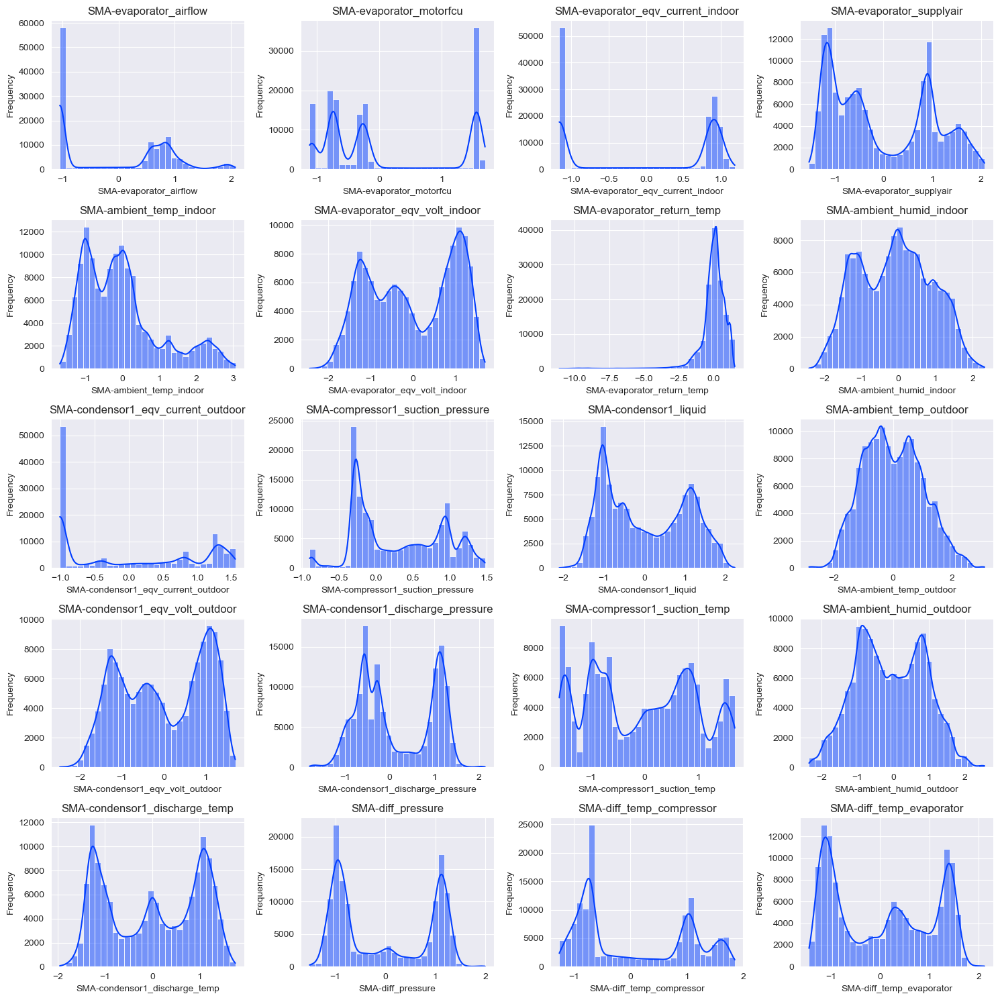

In [122]:
# Set up the matplotlib figure with 4 columns and 5 rows
fig, axes = plt.subplots(5, 4, figsize=(15, 15))  # 5 rows, 4 columns

# Flatten axes for easy iteration
axes = axes.flatten()

plt.title("Final Features Distribution plot with Moving Average Value from sensor")

# Plot each feature's distribution in a separate subplot
for i, column in enumerate(sma_columns):
    sns.histplot(final_df[column], kde=True, ax=axes[i], bins=30)
    axes[i].set_title(f'{column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

# Hide any empty subplots if there are less than 20 features
for j in range(len(sma_columns), 20):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

# Save CSV.

In [121]:
import os 

def save_csv_file(df, date="29_8_2024-fix", path="D:\ai\predictive-maintenance-residential-aircon-coop\notebooks\csv-log"):
    # Ensure the directory exists
    os.makedirs(path, exist_ok=True)
    
    # Define the full path for saving the file
    file_path = os.path.join(path, f'feature_engineering_{date}.csv')
    
    # Save the DataFrame to a CSV file
    df.to_csv(file_path, index=False)
    
    print(f"File saved to {file_path}")